## Import

In [18]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [19]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [20]:
pre_path = "../../../../../../../"
physical_model = "MIST"
path_to_data = pre_path + "data/MIST_v1.2_vvcrit0.0_basic_isos/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "mass_smaller_3"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["phase"]

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading MIST dataframe from csv file...


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,3.486221,3.131342,-1.0,-0.25,0.100000,0.153402
1,5.0,3.487362,3.126808,-1.0,-0.25,0.102645,0.160326
2,5.0,3.489243,3.119367,-1.0,-0.25,0.107039,0.171785
3,5.0,3.491102,3.112165,-1.0,-0.25,0.111419,0.183099
4,5.0,3.492937,3.105143,-1.0,-0.25,0.115789,0.194305
...,...,...,...,...,...,...,...
1467117,10.3,4.402490,7.777159,6.0,0.50,0.532726,-1.806255
1467118,10.3,4.387132,7.783242,6.0,0.50,0.532730,-1.809295
1467119,10.3,4.371789,7.789130,6.0,0.50,0.532735,-1.812237
1467120,10.3,4.356480,7.794844,6.0,0.50,0.532741,-1.815091


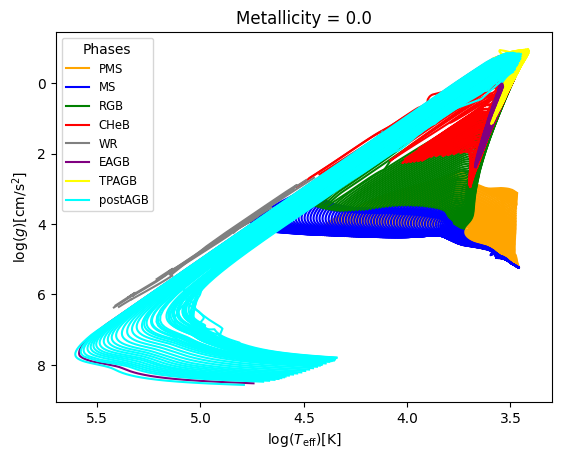

In [21]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['log10_isochrone_age_yr', 'log_Teff', 'log_g', 'phase', 'metallicity', 'star_mass', 'log_R'], 
                              physical_model, reclassify=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

In [22]:
print_uniques("star_mass", iso_df)
# print_uniques_count("star_mass", iso_df)

star_mass : 1467117 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,5.0,4.494412,4.346972,0.0,-0.25,13.584360,0.610679
1,5.0,4.497517,4.345776,0.0,-0.25,13.765512,0.614753
2,5.0,4.500556,4.344580,0.0,-0.25,13.942887,0.618755
3,5.0,4.504040,4.343050,0.0,-0.25,14.591712,0.624670
4,5.0,4.507576,4.341483,0.0,-0.25,15.426062,0.631187
...,...,...,...,...,...,...,...
633331,10.3,3.602322,1.827453,3.0,0.50,0.866616,1.274247
633332,10.3,3.600999,1.809405,3.0,0.50,0.866614,1.283270
633333,10.3,3.599710,1.791489,3.0,0.50,0.866612,1.292228
633334,10.3,3.598418,1.773621,3.0,0.50,0.866610,1.301161


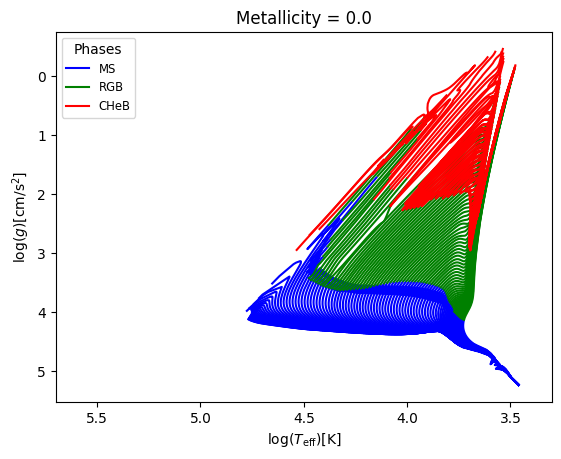

In [23]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [24]:
print_uniques("star_mass", phase_filtered_iso_df)
# print_uniques_count("star_mass", phase_filtered_iso_df)

star_mass : 633336 unique values, range [0.0999979840073621, 298.5447575808816]


,log10_isochrone_age_yr,log_Teff,log_g,phase,metallicity,star_mass,log_R
0,6.50,4.126429,4.449033,0.0,-0.25,2.859137,0.222566
1,6.50,4.130406,4.448602,0.0,-0.25,2.900395,0.225872
2,6.50,4.134480,4.448201,0.0,-0.25,2.941695,0.229166
3,6.50,4.138527,4.447853,0.0,-0.25,2.982876,0.232424
4,6.55,4.113582,4.450139,0.0,-0.25,2.734122,0.212411
...,...,...,...,...,...,...,...
323154,10.30,3.602322,1.827453,3.0,0.50,0.866616,1.274247
323155,10.30,3.600999,1.809405,3.0,0.50,0.866614,1.283270
323156,10.30,3.599710,1.791489,3.0,0.50,0.866612,1.292228
323157,10.30,3.598418,1.773621,3.0,0.50,0.866610,1.301161


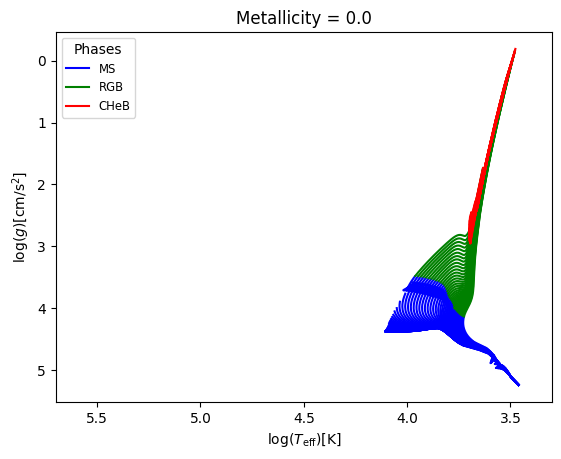

In [25]:
phase_mass_filtered_iso_df = Data_preparator.filter_data(iso_df, {'phase':[0, 2, 3], "star_mass" : ("<", 3)})
display(phase_mass_filtered_iso_df)
data_visualiser_phase_age_filtered = Data_visualiser(phase_mass_filtered_iso_df, physical_model)
data_visualiser_phase_age_filtered.plot_Kiel([], [0.0])

In [26]:
print_all_uniques(phase_mass_filtered_iso_df)

log10_isochrone_age_yr  : Range : 6.2 - 10.3, Mean : 9.1042, Median : 9.2

log_Teff  : Range : 3.34 - 5.2138, Mean : 3.8022, Median : 3.7554

log_g  : Range : -1.08 - 7.9405, Mean : 3.6564, Median : 4.1712

Values in phase column : 0.0, 2.0, 3.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.5, -3.0, -3.5, -4.0, 0.0, 0.25, 0.5 

star_mass  : Range : 0.1 - 3.0, Mean : 1.3172, Median : 1.1821

log_R  : Range : -1.86 - 2.7813, Mean : 0.4084, Median : 0.2349



In [27]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_mass_filtered_iso_df, x_cols=['log10_isochrone_age_yr', 'metallicity', 'star_mass'], 
                               y_cols=['log_Teff', 'log_g', 'log_R'], categories_cols=['phase'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the log_Teff parameter : 3.344668191350628 - 5.213751178569124
Median value in train data for the log_Teff parameter: 3.755276264292559
Mean value in train data for the log_Teff parameter: 3.8020939418891992

Range in train data for the log_g parameter : -1.0828963170617296 - 7.94051322120885
Median value in train data for the log_g parameter: 4.170385464447518
Mean value in train data for the log_g parameter: 3.657089804675904

Range in train data for the log_R parameter : -1.861069007171269 - 2.772287451333455
Median value in train data for the log_R parameter: 0.2350500595994825
Mean value in train data for the log_R parameter: 0.4079055757762753

Testing set statistics:
Range in test data for the log_Teff parameter : 3.344674699659814 - 5.204071817974809
Median value in test data for the log_Teff parameter: 3.755719336893531
Mean value in test data for the log_Teff parameter: 3.8023618725868578

Range in test data for the log_g param

## Model training

### Linear regression

In [28]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.7729242967191179
  RMSE :  0.10049133648214309
  MAE :  0.08695427180158606
  MedAE :  0.08507324775640202
  CORR :  0.8982879016635165
  MAX_ER :  0.22219974142062693
  Percentiles : 
    75th percentile :  0.1245941561927364
    90th percentile :  0.15833988588759887
    95th percentile :  0.1739869588172399
    99th percentile :  0.19269674681896684

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.276512878191396
  RVE :  0.5284611749154071
  RMSE :  0.11338773603343978
  MAE :  0.09256214188572959
  MedAE :  0.08148202263135529
  CORR :  0.7342994977087216
  MAX_ER :  0.3381938791666612
  Percentiles : 
    75th percentile :  0.13481159361445938
    90th percentile :  0.18399710898743393
    

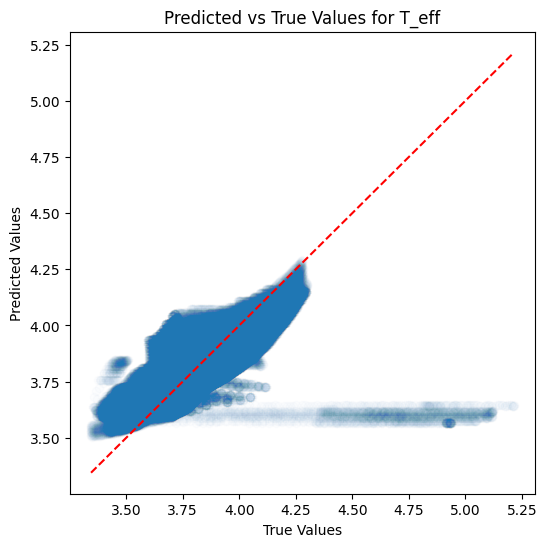

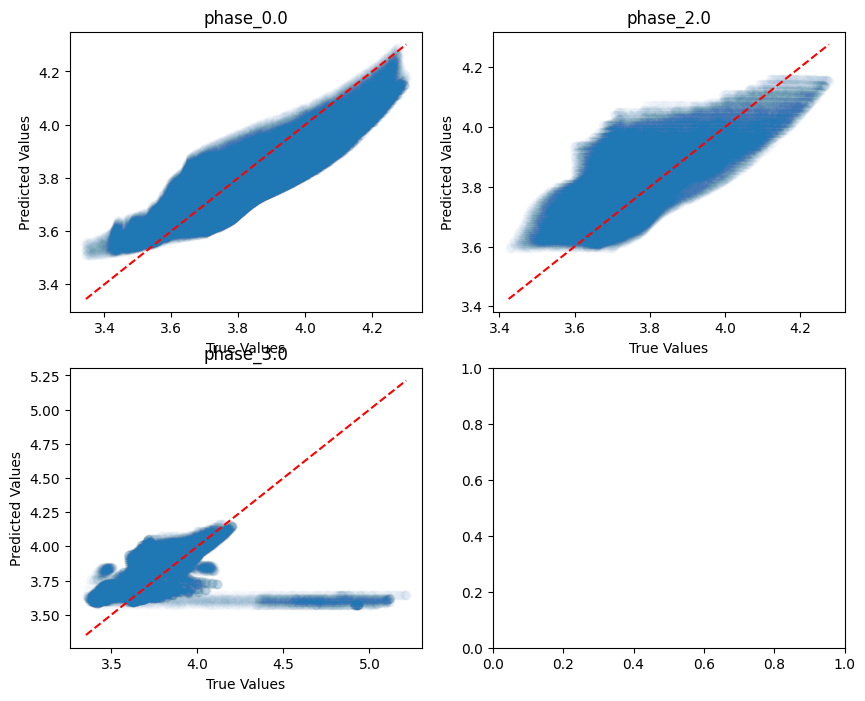

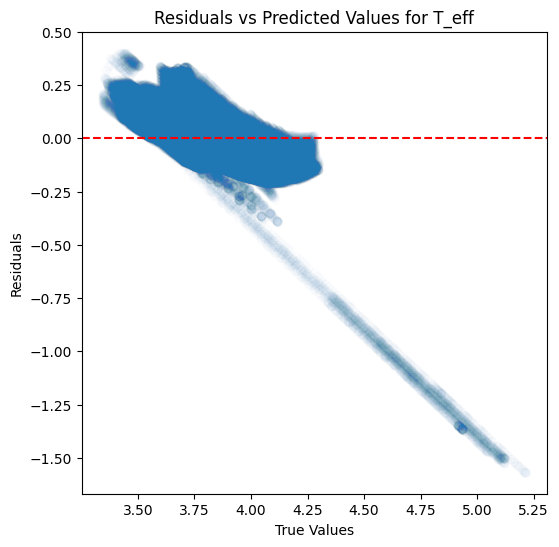

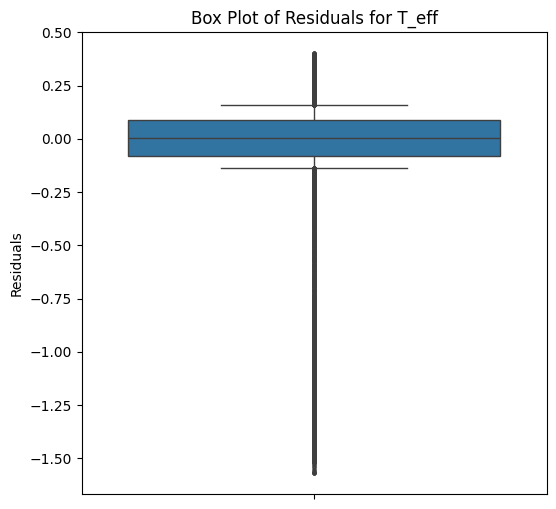

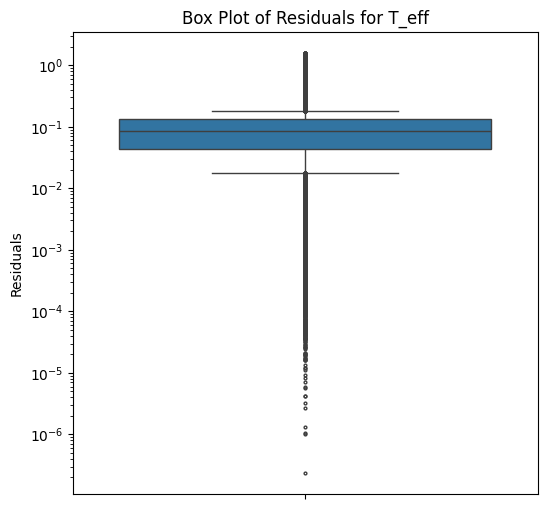

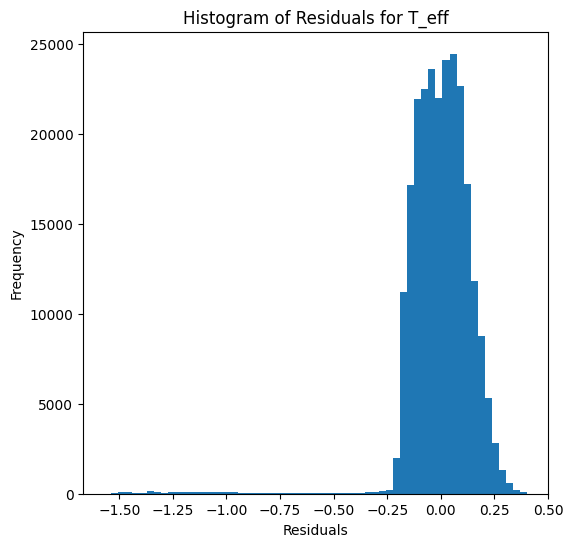

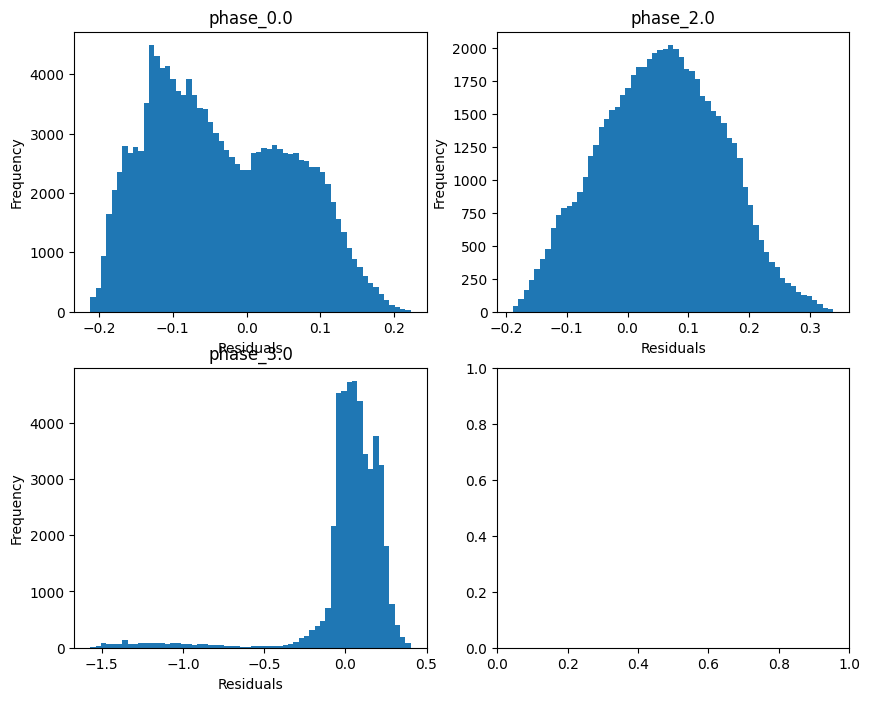

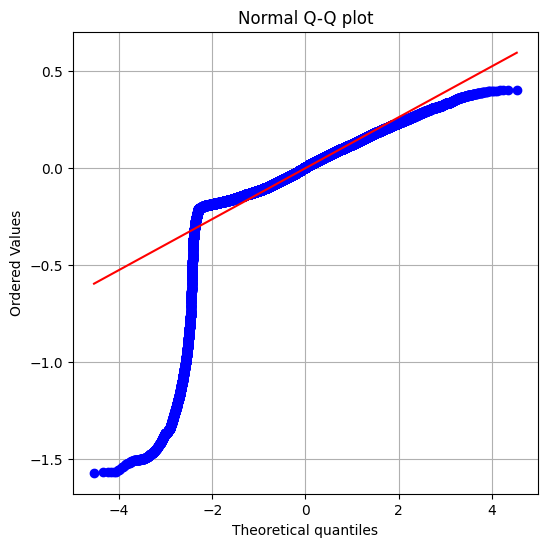

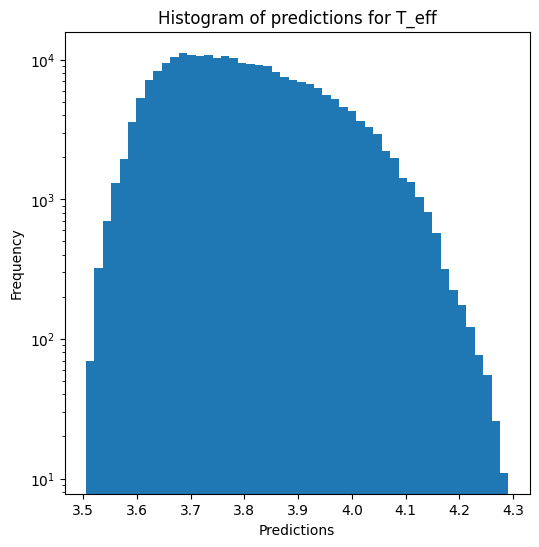

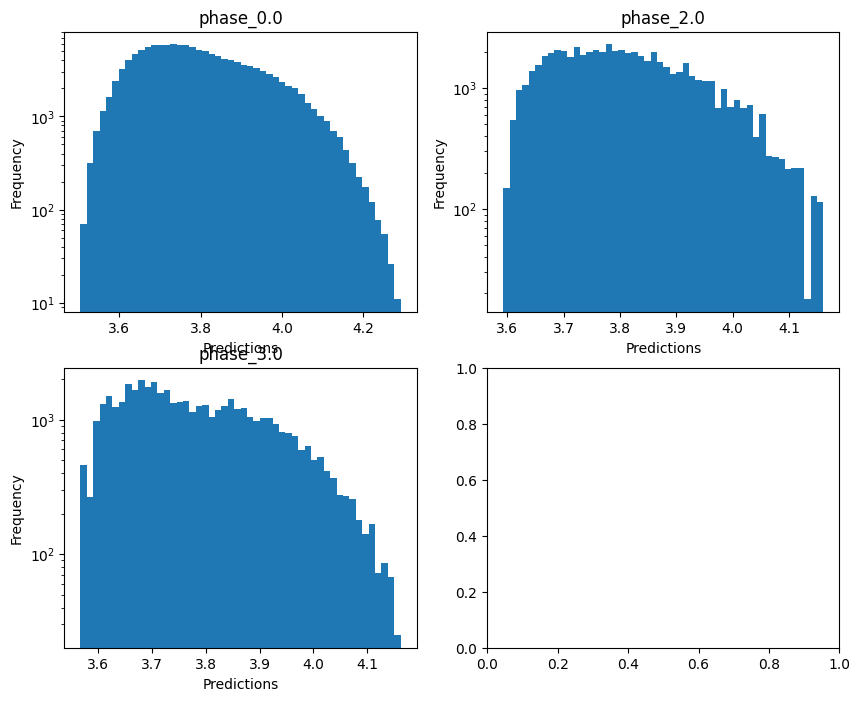

no negative values

log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.432991769220164
  RVE :  -2.483008276517319
  RMSE :  0.8319249158801338
  MAE :  0.7318660095748647
  MedAE :  0.7623100406144854
  CORR :  0.5875119081903233
  MAX_ER :  1.7083361802637382
  Percentiles : 
    75th percentile :  1.0163399058593212
    90th percentile :  1.2647569077133884
    95th percentile :  1.3865191401907808
    99th percentile :  1.5508529877267765

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  -0.03195322545246149
  RMSE :  1.116139516366003
  MAE :  0.8634386864793685
  MedAE :  0.6451575168680197
  CORR :  0.10554027202842463
  MAX_ER :  3.0328066312448
  Percentiles : 
    75th percentile :  1.257399176303684
    90th percentile :  2.025892506445031
    95th percentile :  2.3498887279738607
    99th percentile :  2.709160119829476

log_g results for the phase category

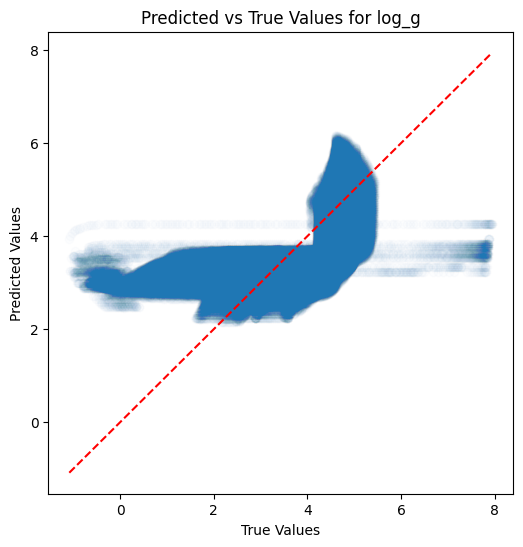

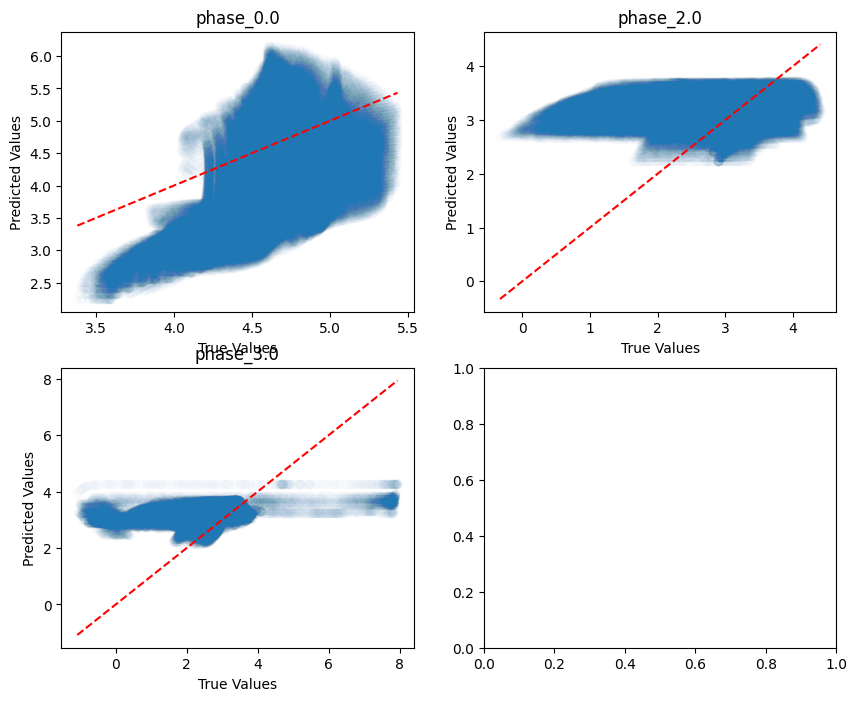

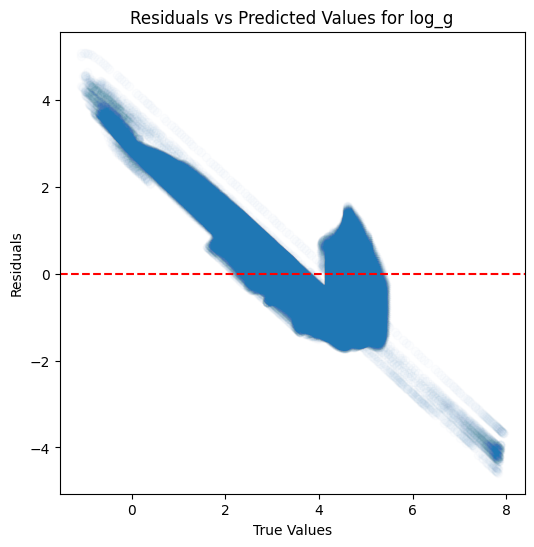

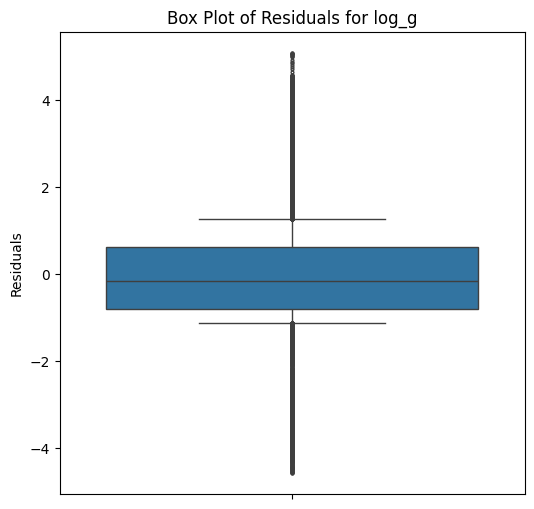

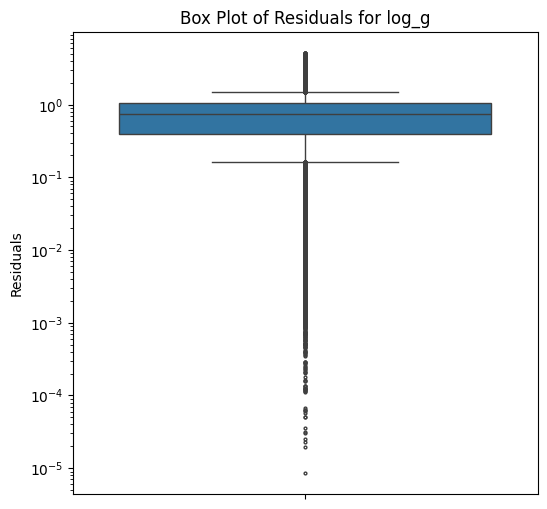

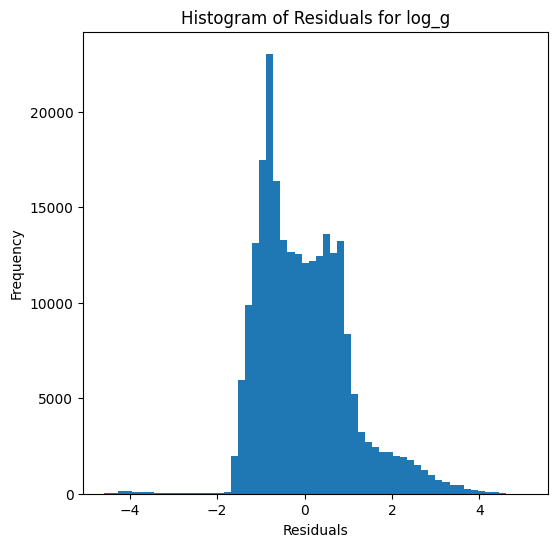

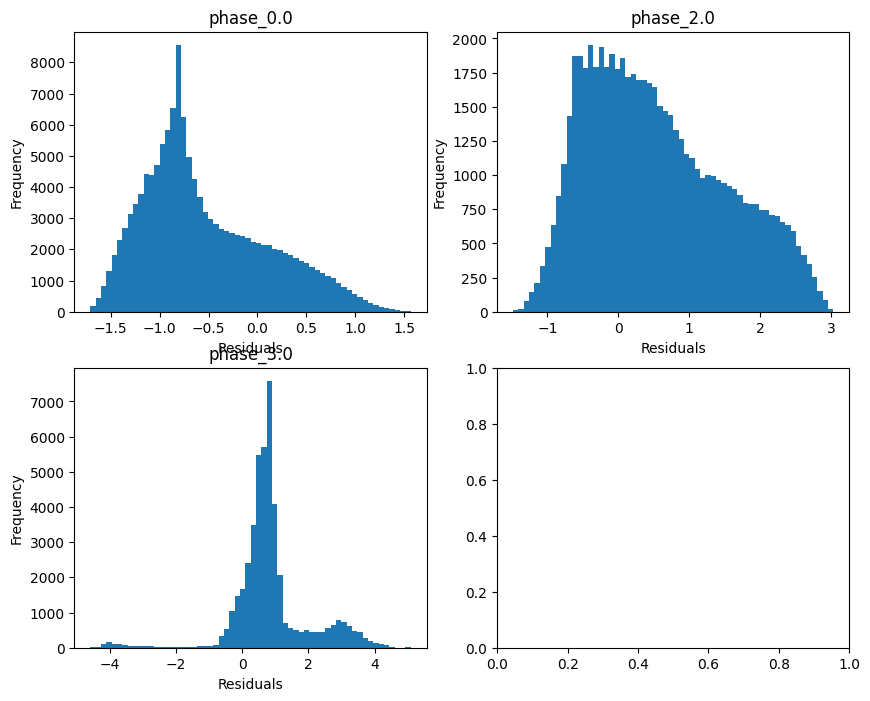

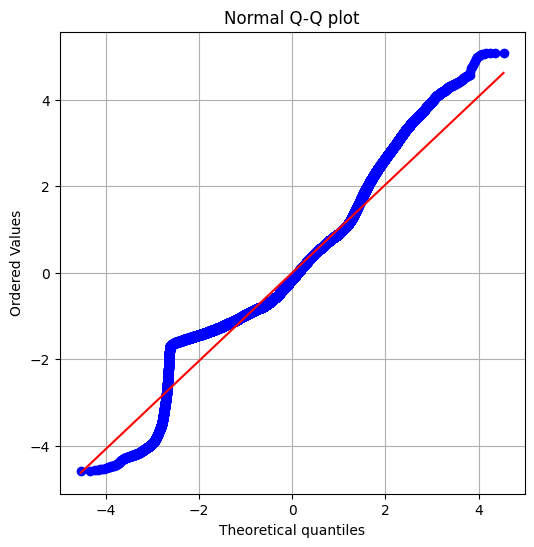

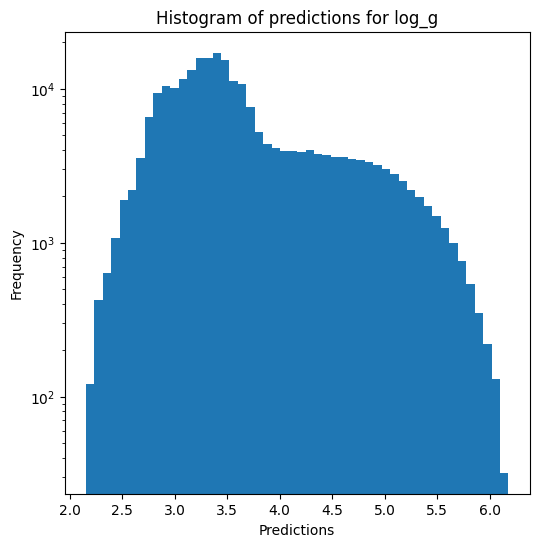

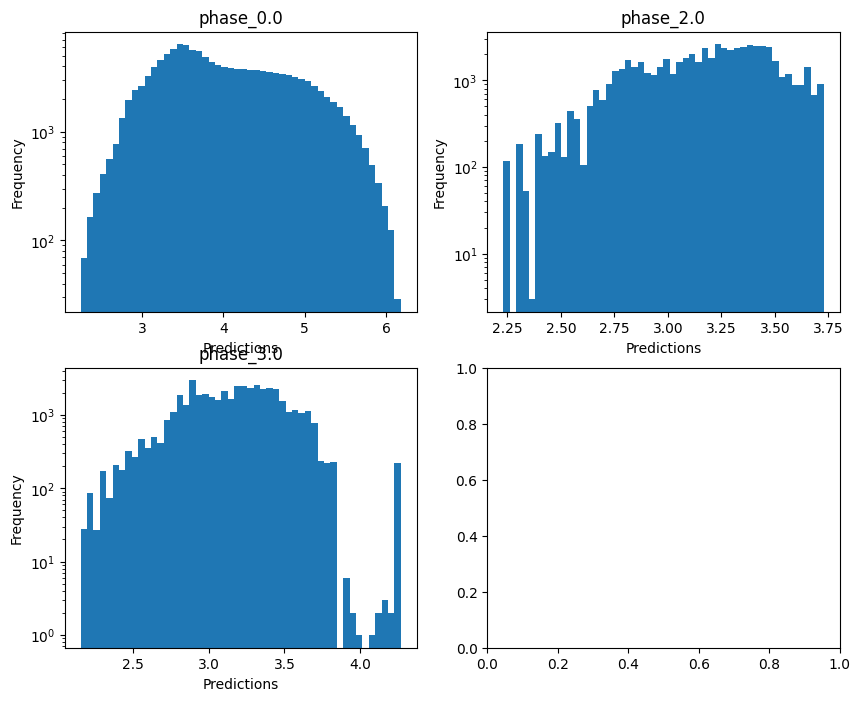


radius results for the phase category with a value of 0.0
  value range :  -0.9974234436680278 - 0.7629161677552769
  RVE :  -0.19540822380785894
  RMSE :  0.4437813086231369
  MAE :  0.3871357669054664
  MedAE :  0.37626370675814236
  CORR :  0.6494155206063639
  MAX_ER :  1.144896074096005
  Percentiles : 
    75th percentile :  0.5383595412221689
    90th percentile :  0.6862216310846668
    95th percentile :  0.759031876757802
    99th percentile :  0.8876467843131031

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.353416446984946
  RVE :  -0.20000669085424816
  RMSE :  0.5767746589000061
  MAE :  0.44705955310972983
  MedAE :  0.3369805353748081
  CORR :  0.0411936062142408
  MAX_ER :  1.5390982310236332
  Percentiles : 
    75th percentile :  0.6592344037722154
    90th percentile :  1.0428245667098395
    95th percentile :  1.2051546655838
    99th percentile :  1.3840896658035011

radius results for the phase category with a v

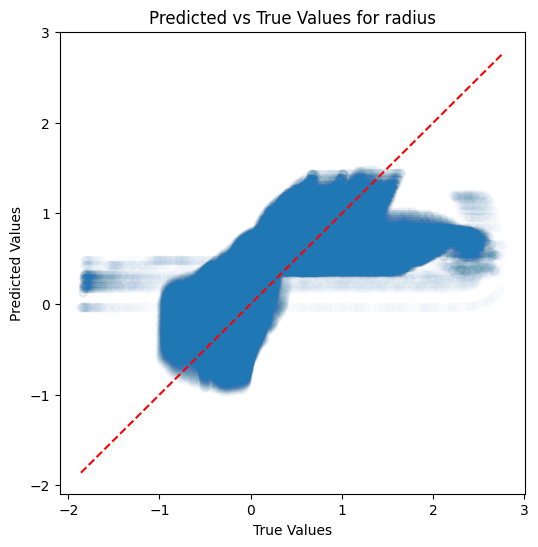

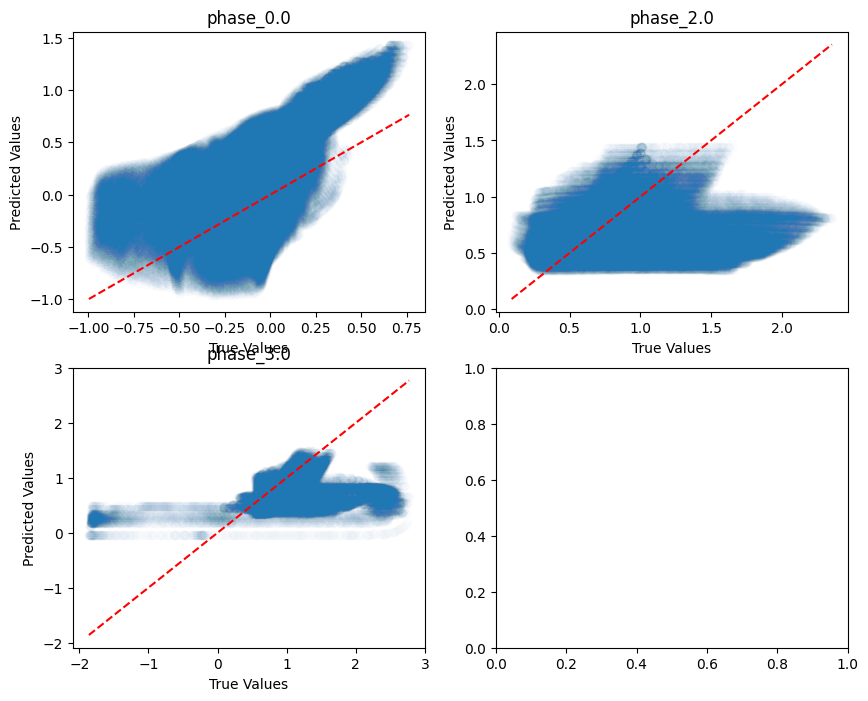

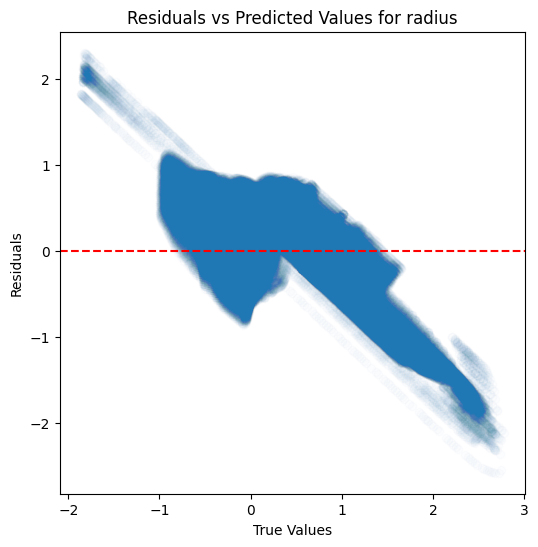

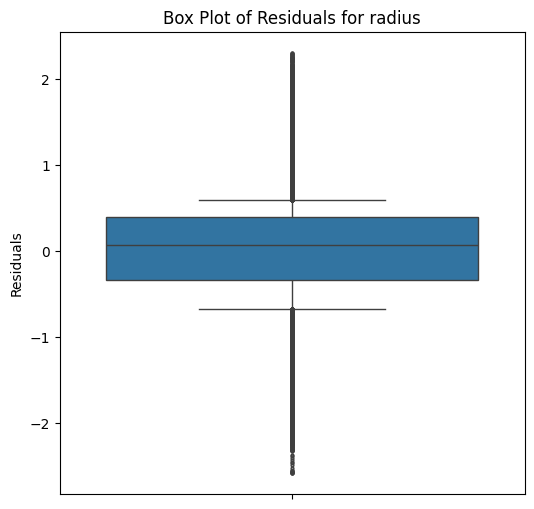

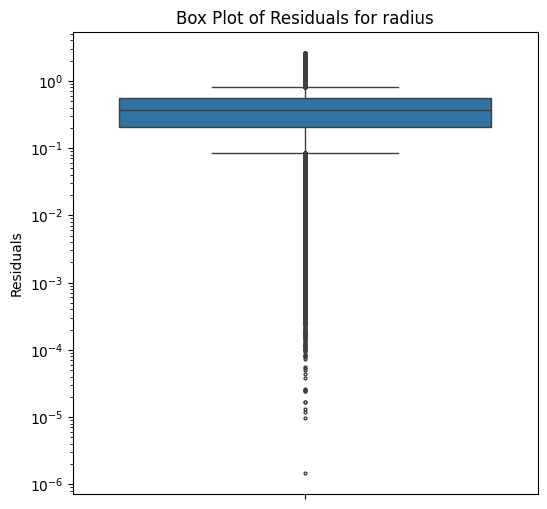

...

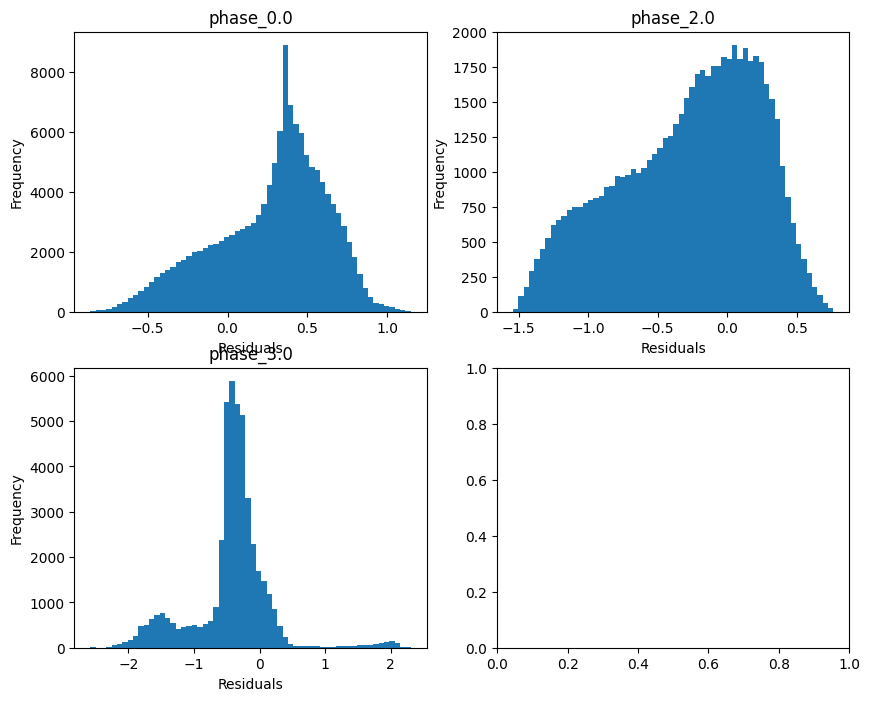

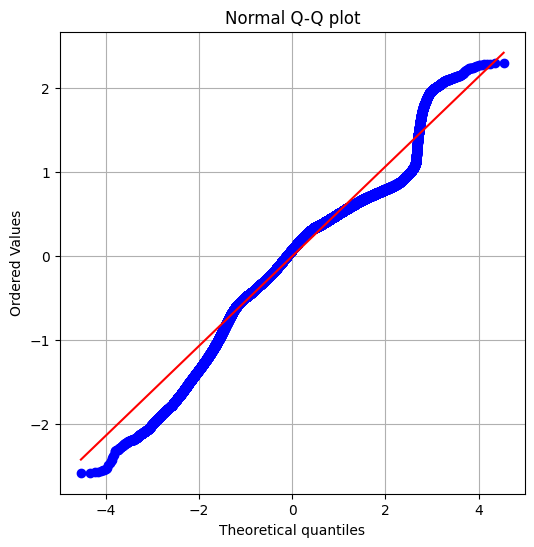

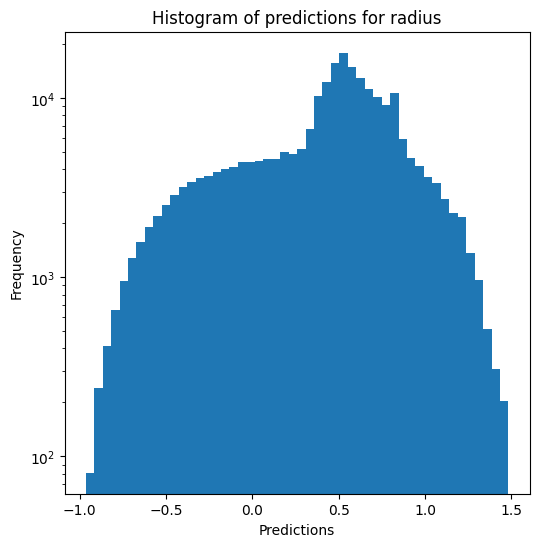

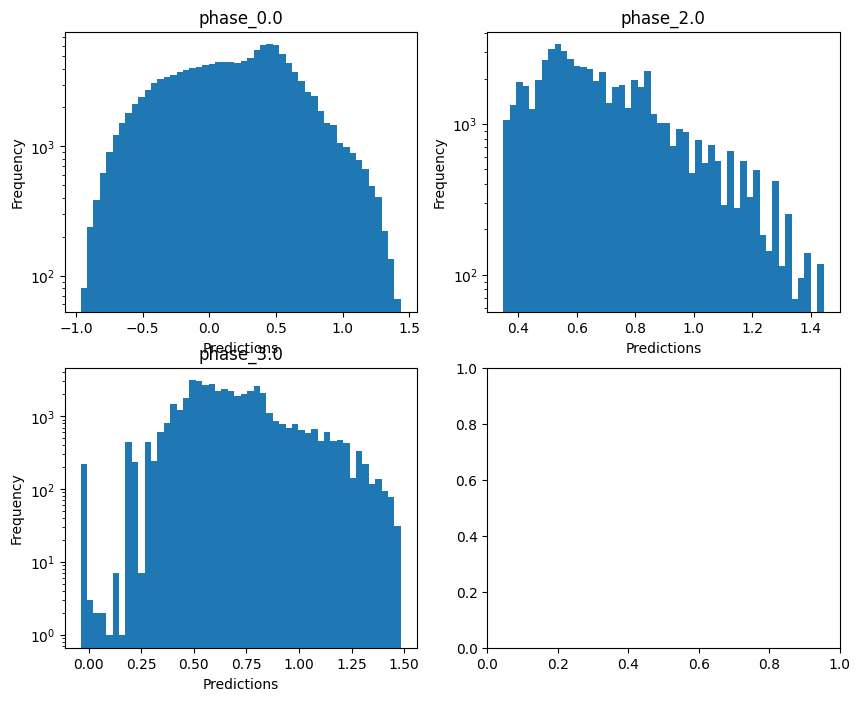

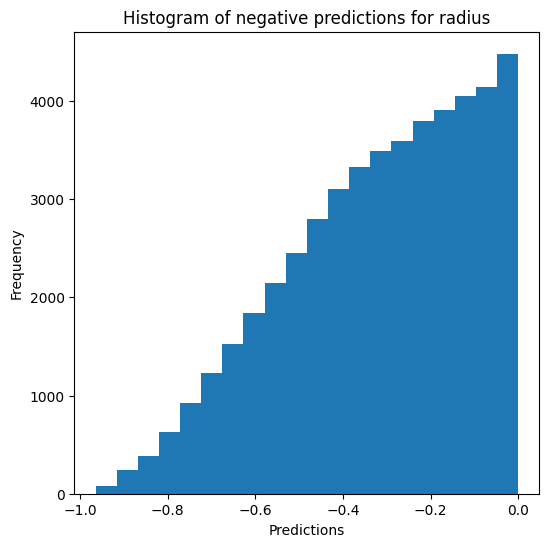

Saving predictions and results...


In [29]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True) # override=False, use_preds=True

### Decision tree

In [30]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.9770342105603469
  RMSE :  0.030341014194795277
  MAE :  0.005512821250714921
  MedAE :  0.0008677687022671243
  CORR :  0.9888269390797622
  MAX_ER :  1.5050059374711688
  Percentiles : 
    75th percentile :  0.0020021141573485224
    90th percentile :  0.00419161508272099
    95th percentile :  0.007688931816141725
    99th percentile :  0.1892631198556258

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.276512878191396
  RVE :  0.7717858231493433
  RMSE :  0.06885694732953519
  MAE :  0.038734430570588986
  MedAE :  0.004881316307997263
  CORR :  0.8850129516947081
  MAX_ER :  0.4046534072089152
  Percentiles : 
    75th percentile :  0.05878408721811157
    90th percentile :  0.1279718649063

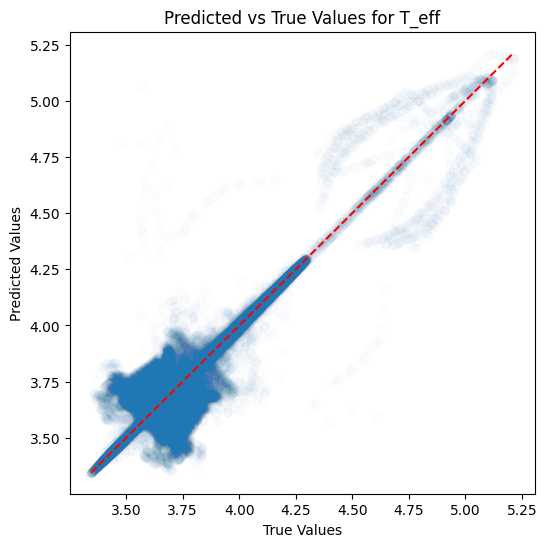

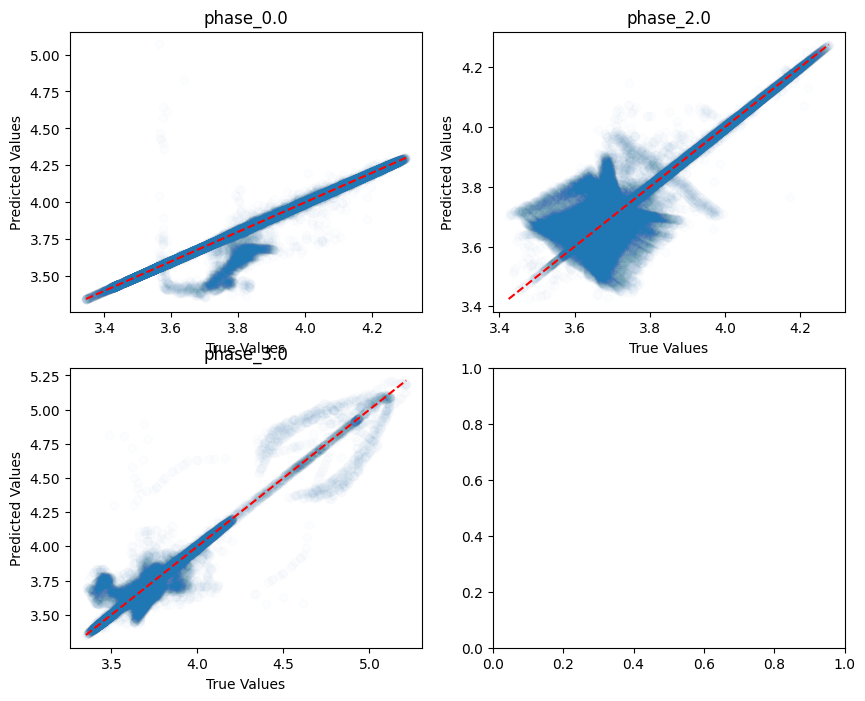

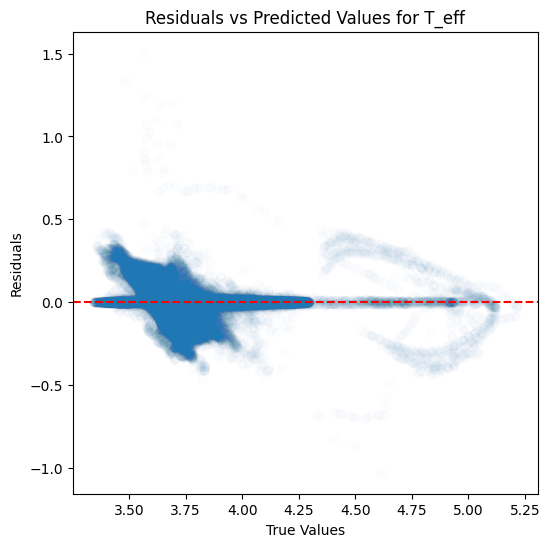

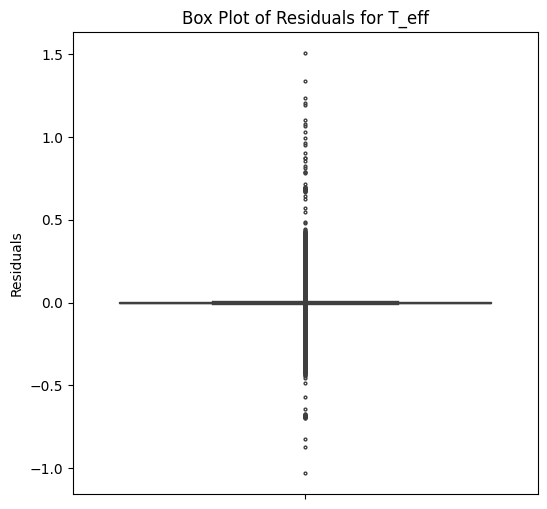

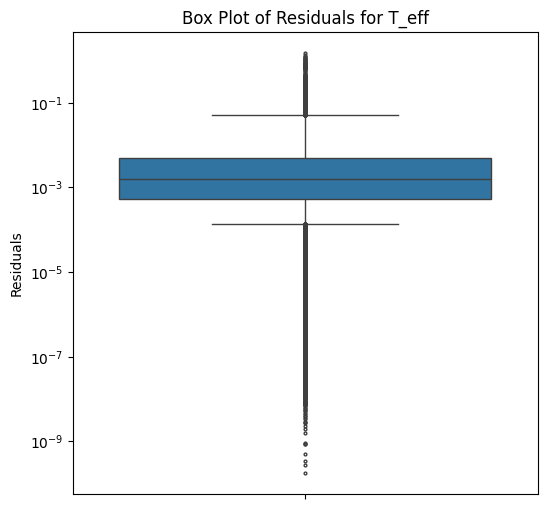

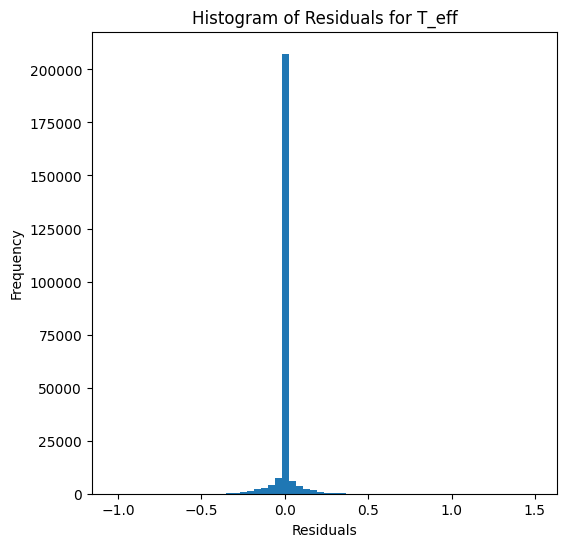

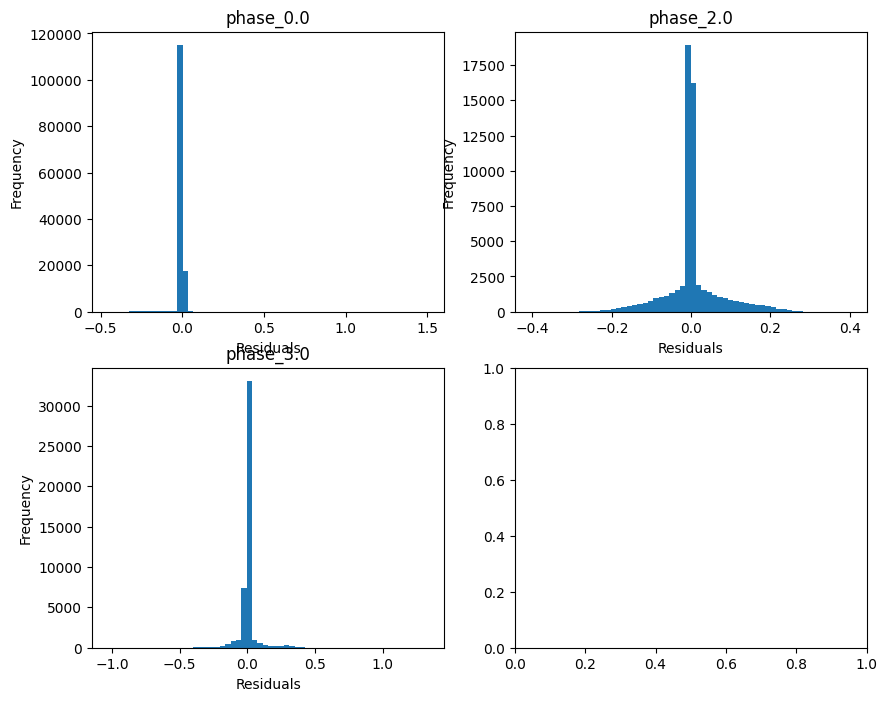

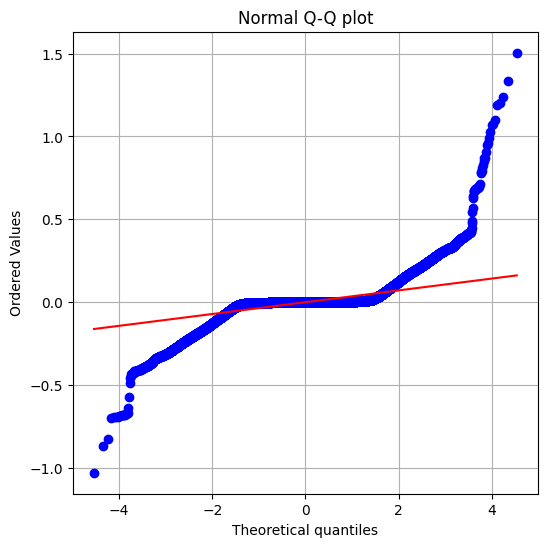

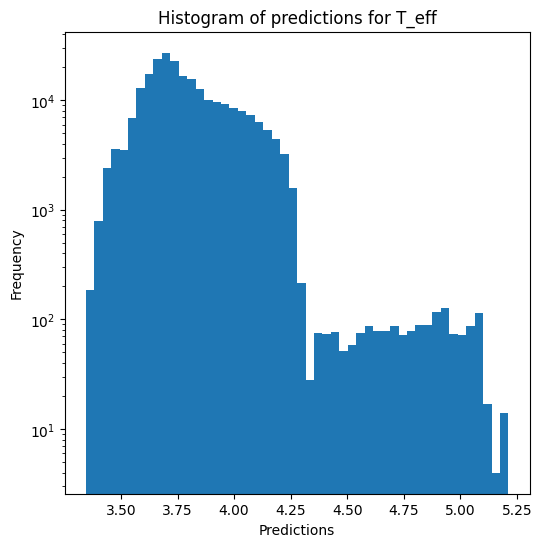

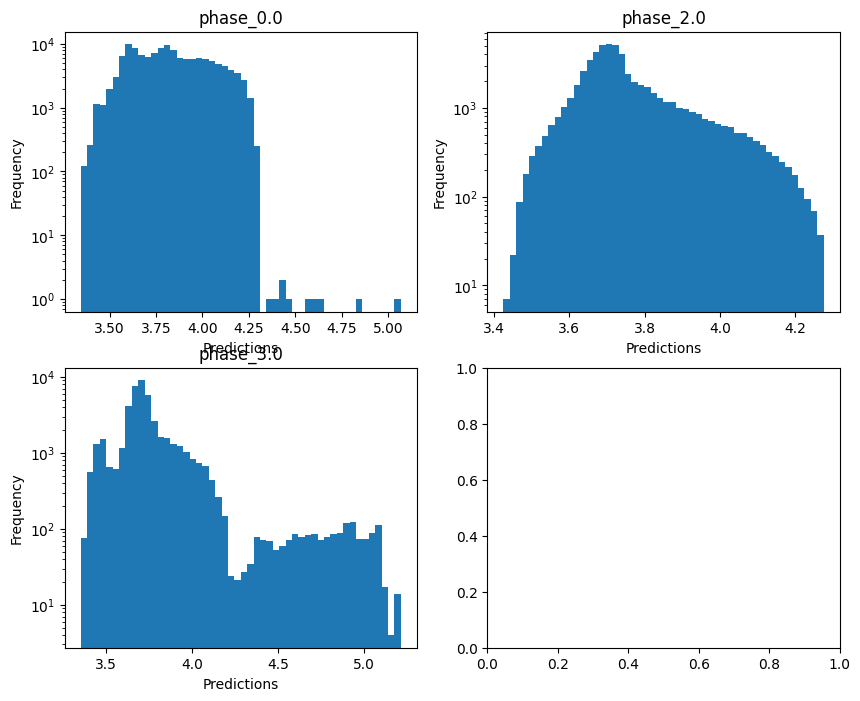


log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.432991769220164
  RVE :  -1.0430553693213191
  RMSE :  0.49359627939609707
  MAE :  0.06933319117977328
  MedAE :  0.003091854053976384
  CORR :  0.6416997476586614
  MAX_ER :  5.664585824937198
  Percentiles : 
    75th percentile :  0.0062371713258650985
    90th percentile :  0.010825353648097467
    95th percentile :  0.018037524103143146
    99th percentile :  3.3888160683023463

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  -0.5946353862533862
  RMSE :  1.215096770531205
  MAE :  0.6873891013291298
  MedAE :  0.03190968354368673
  CORR :  0.18393975641635574
  MAX_ER :  4.637418133429539
  Percentiles : 
    75th percentile :  1.1615288121675855
    90th percentile :  2.3271281723488353
    95th percentile :  2.937455199649129
    99th percentile :  3.7429025684613326

log_g results for the phase category wit

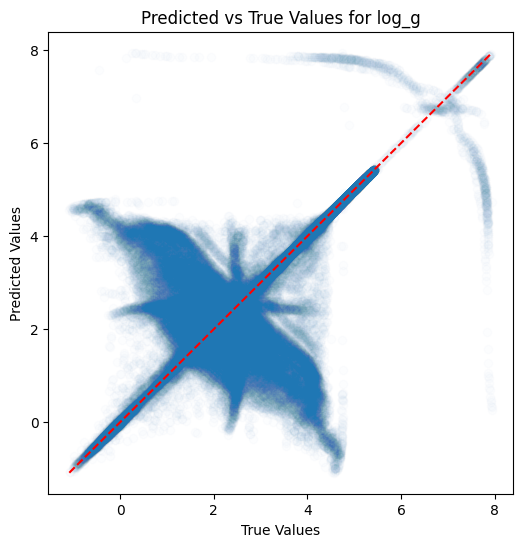

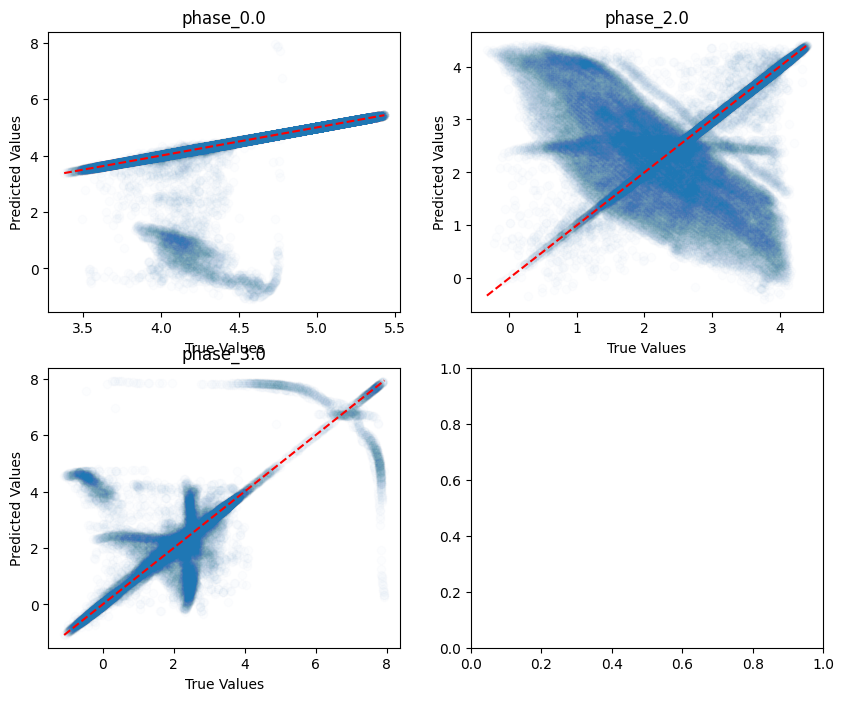

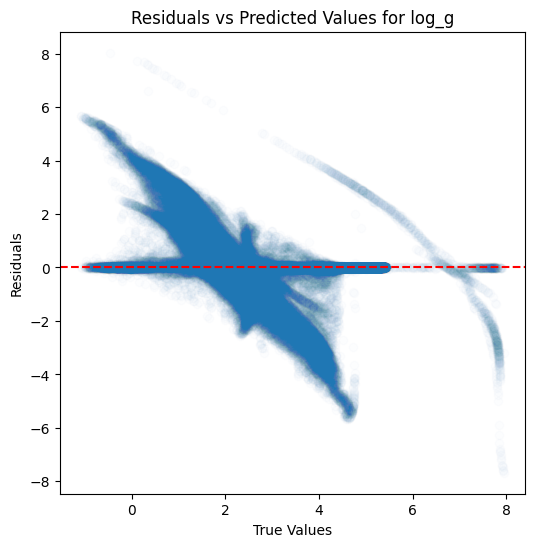

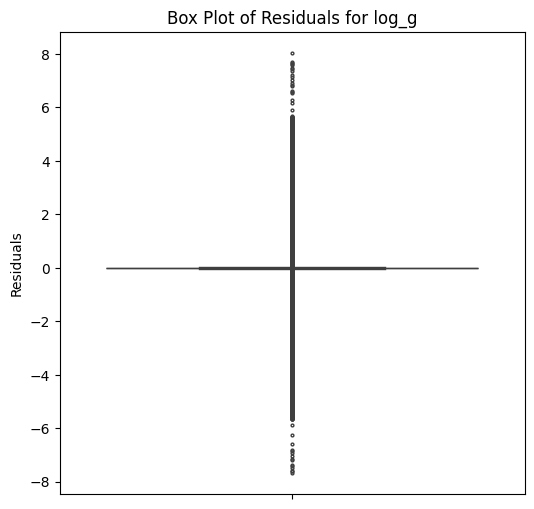

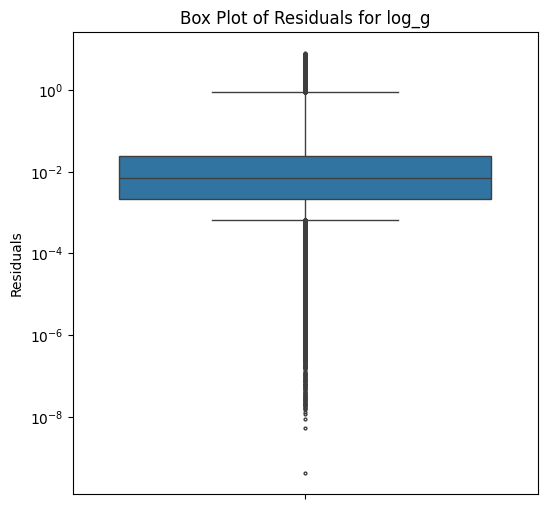

...

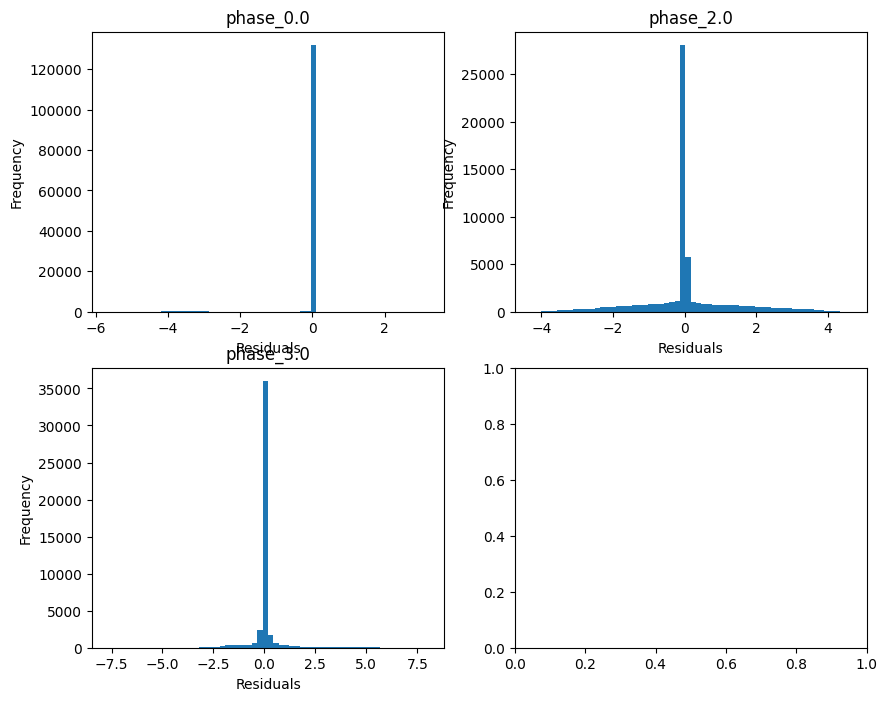

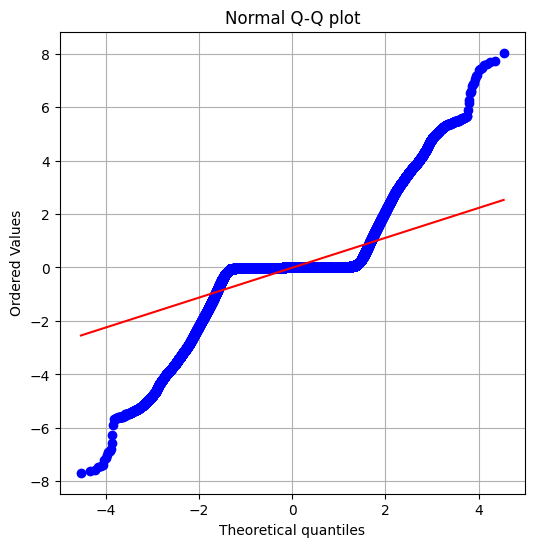

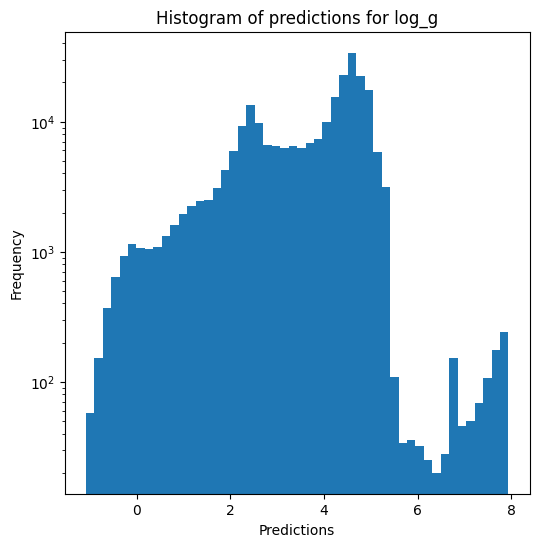

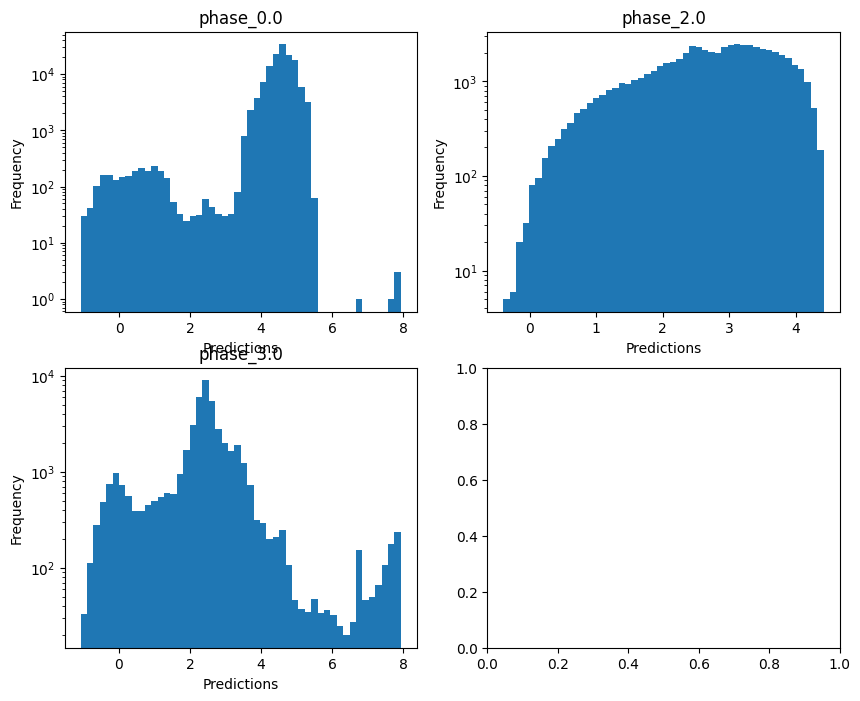

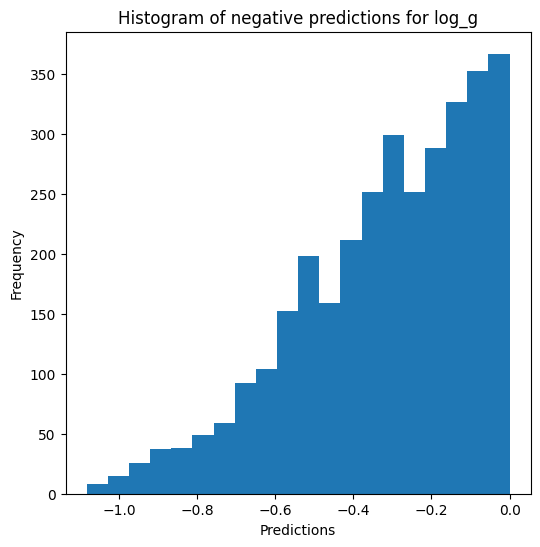


radius results for the phase category with a value of 0.0
  value range :  -0.9974234436680278 - 0.7629161677552769
  RVE :  0.41116666490676423
  RMSE :  0.24681320898942155
  MAE :  0.03522065738088551
  MedAE :  0.002089678484708396
  CORR :  0.8079914445445322
  MAX_ER :  2.8289875513690657
  Percentiles : 
    75th percentile :  0.003952371907044221
    90th percentile :  0.006681260760603312
    95th percentile :  0.010375927972050931
    99th percentile :  1.6944274482484822

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.353416446984946
  RVE :  -0.7413151939986142
  RMSE :  0.6075321611722578
  MAE :  0.3437009535819144
  MedAE :  0.01596063606949616
  CORR :  0.1245445080973174
  MAX_ER :  2.3190299467163435
  Percentiles : 
    75th percentile :  0.5807869059159974
    90th percentile :  1.1637764670914452
    95th percentile :  1.4686590315245738
    99th percentile :  1.8714959631978034

radius results for the phase categ

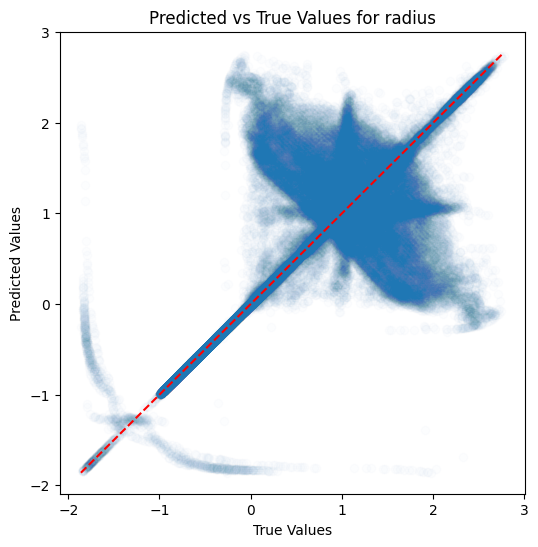

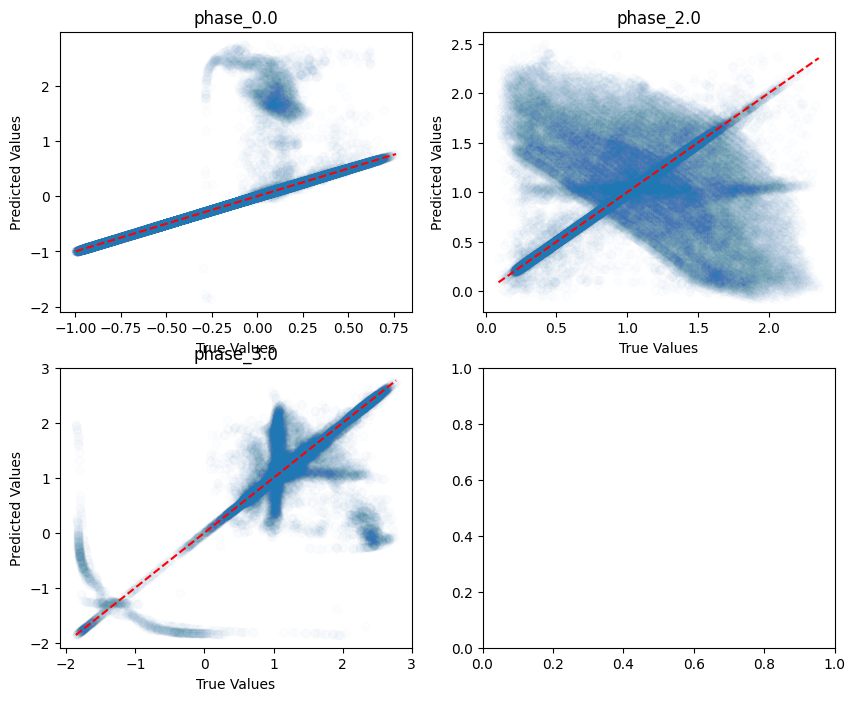

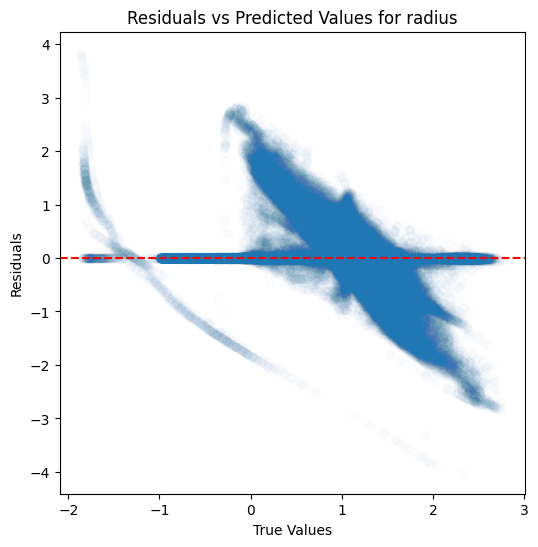

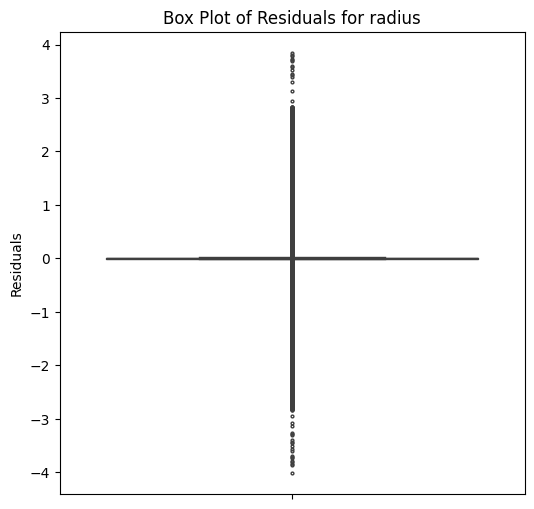

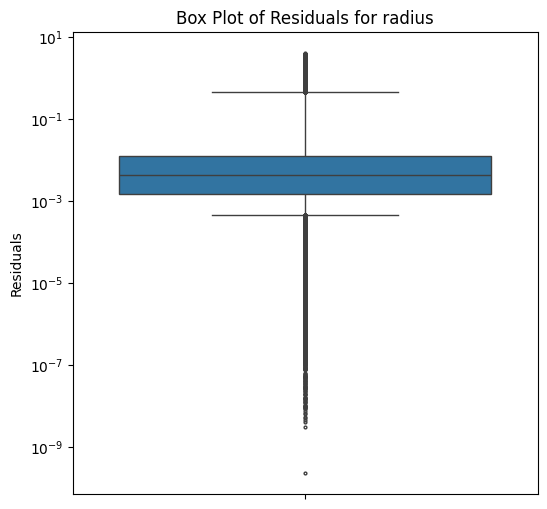

...

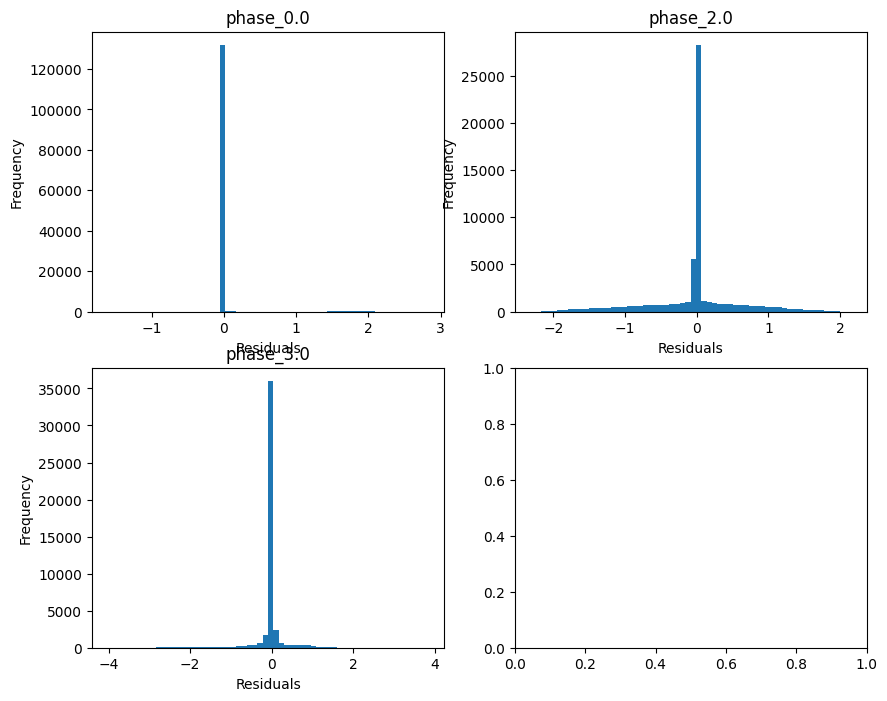

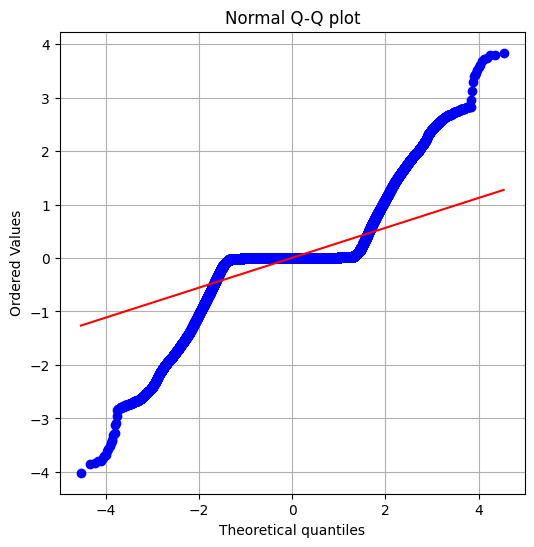

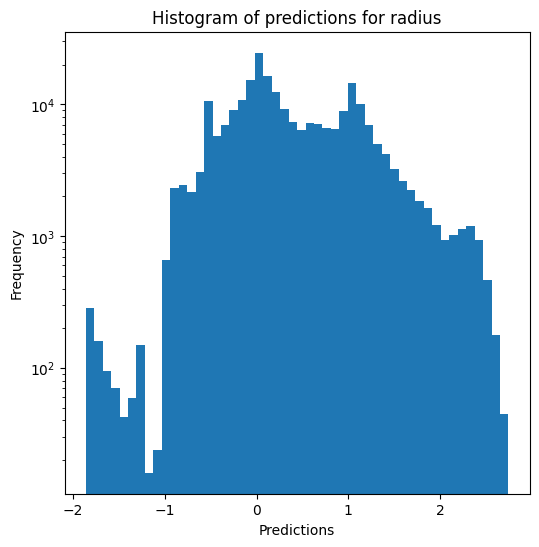

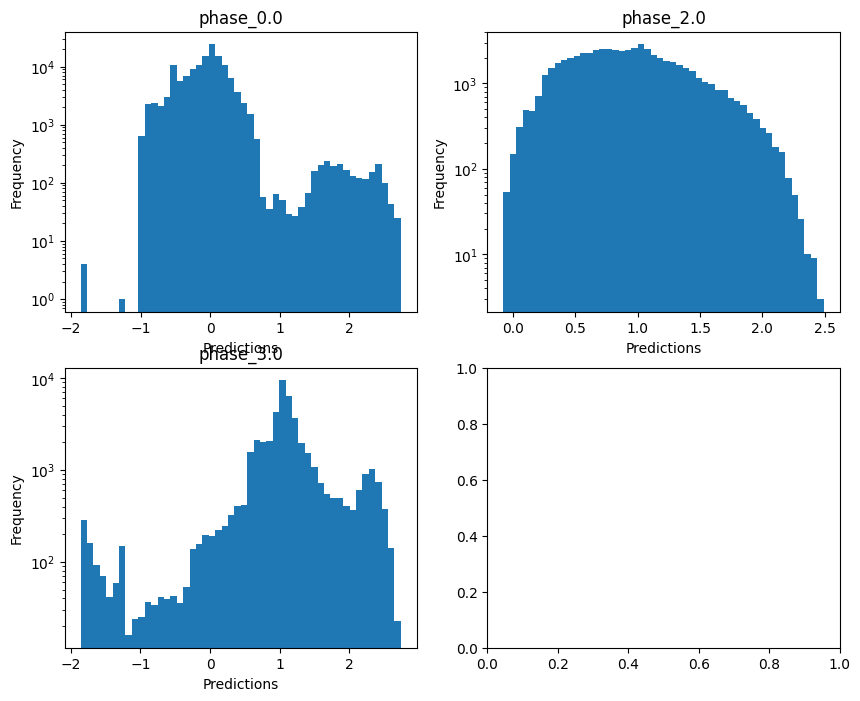

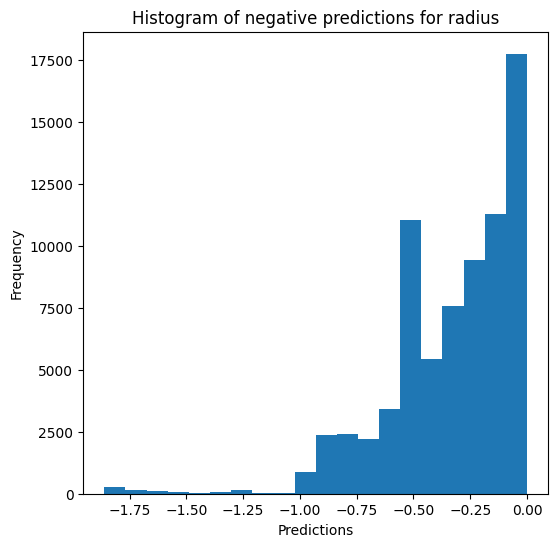

Saving predictions and results...


In [31]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True)

### K-nearest neighbours

In [32]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.9840273432587666
  RMSE :  0.02527032970632032
  MAE :  0.004737393932830771
  MedAE :  0.0011346399856173583
  CORR :  0.9921494192929688
  MAX_ER :  1.5285305629787587
  Percentiles : 
    75th percentile :  0.0023834073544803935
    90th percentile :  0.004572618785403825
    95th percentile :  0.007018190682730994
    99th percentile :  0.10552679447696493

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.276512878191396
  RVE :  0.8931989743653773
  RMSE :  0.04718171578799089
  MAE :  0.026968382379742698
  MedAE :  0.00670486254880398
  CORR :  0.9451893399940301
  MAX_ER :  0.30404942081570185
  Percentiles : 
    75th percentile :  0.04020599215814391
    90th percentile :  0.082796238921

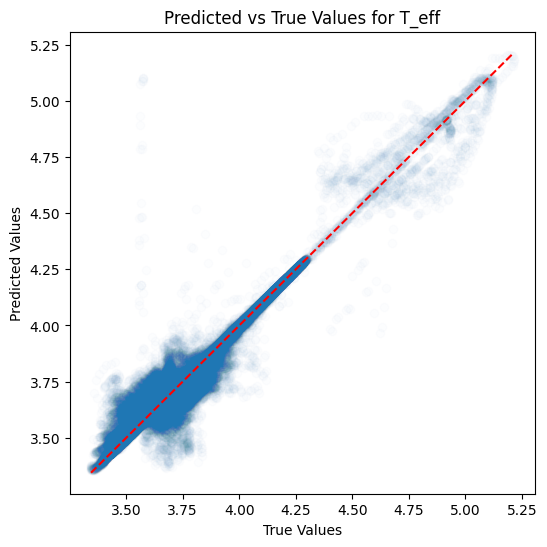

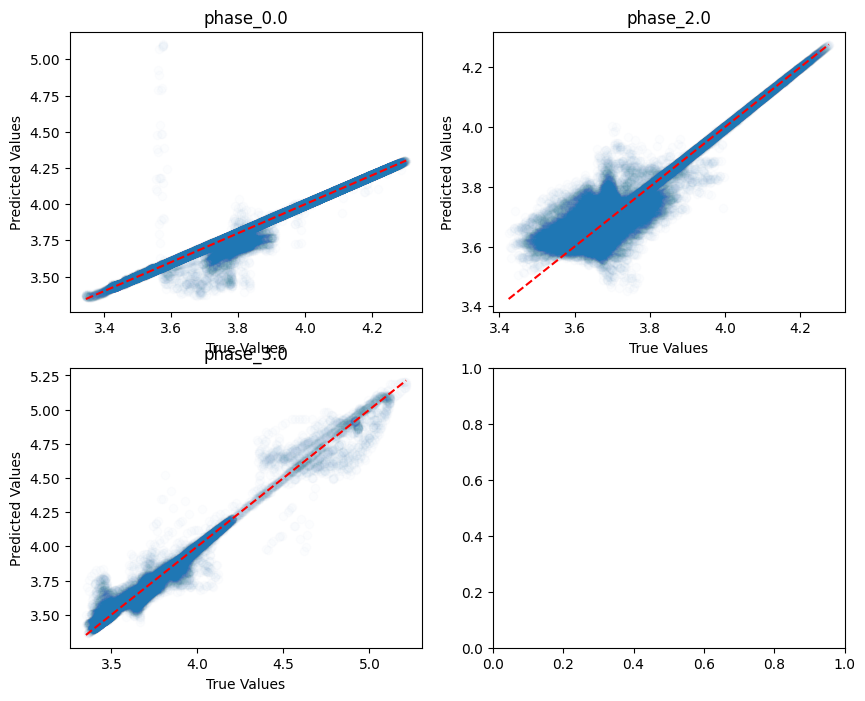

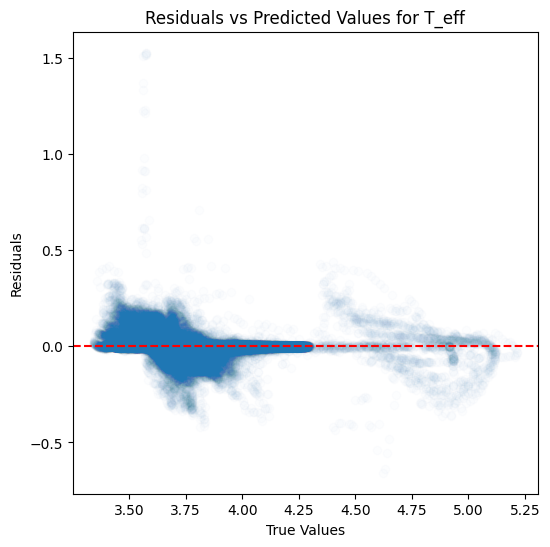

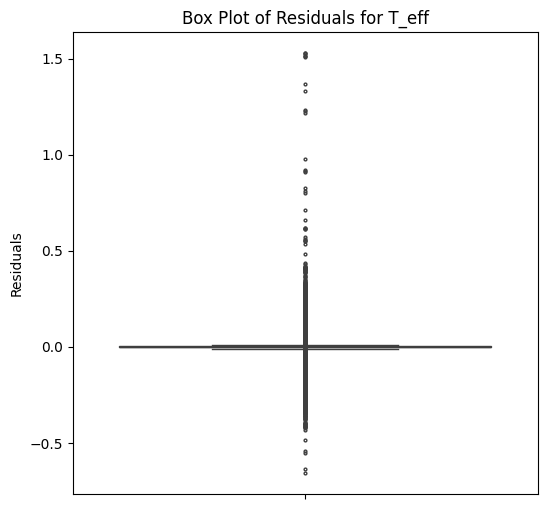

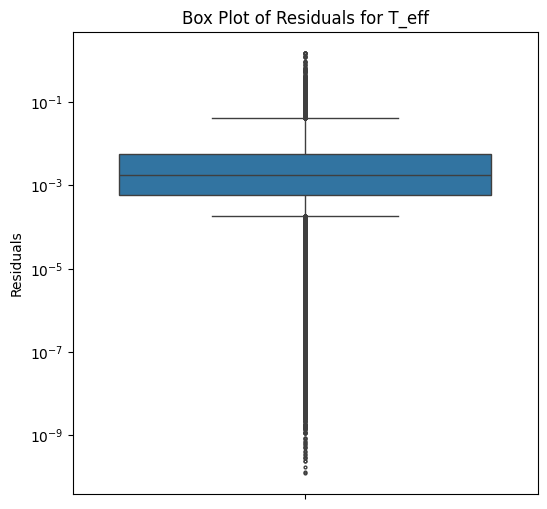

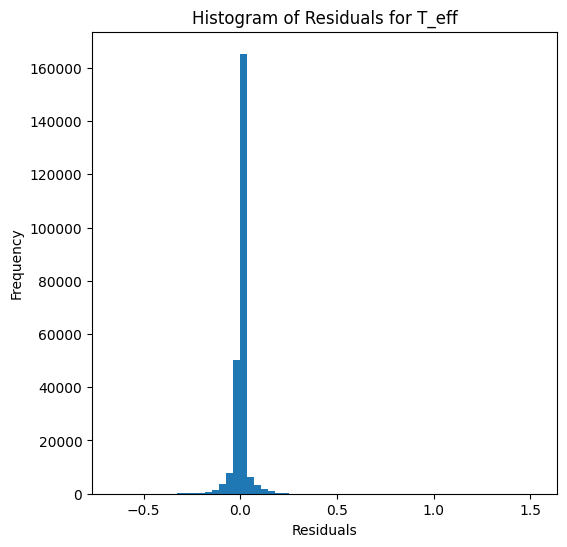

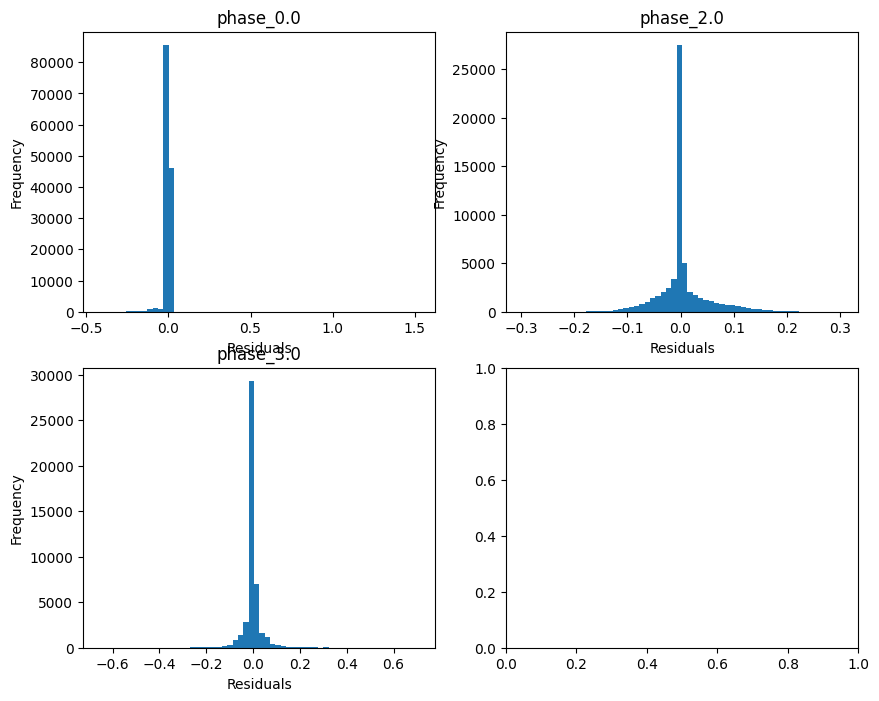

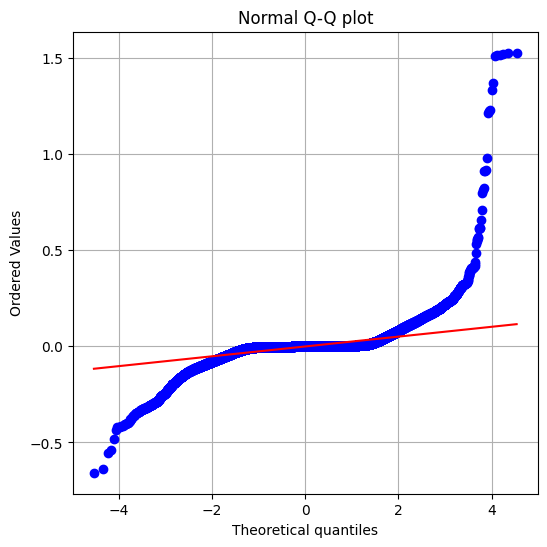

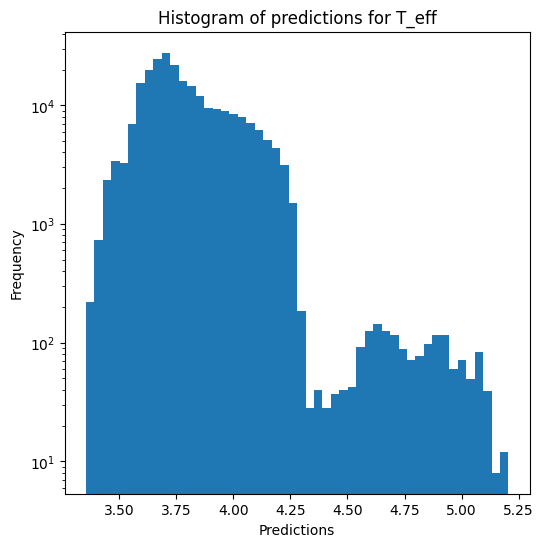

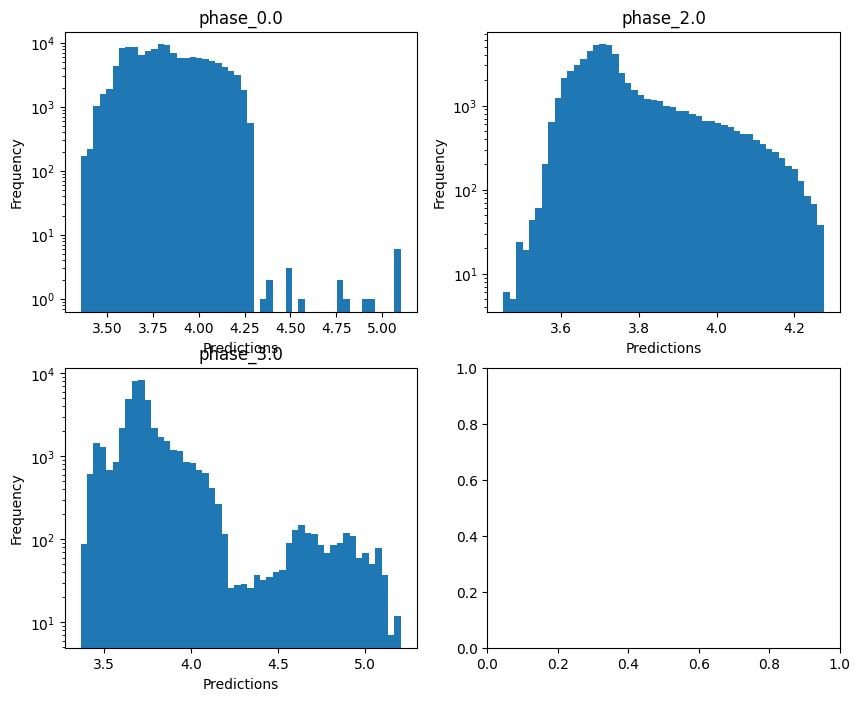


log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.432991769220164
  RVE :  -0.029789091740060503
  RMSE :  0.35123185013756303
  MAE :  0.05619413143129555
  MedAE :  0.0026649925933499574
  CORR :  0.7528693231623642
  MAX_ER :  5.526668282226258
  Percentiles : 
    75th percentile :  0.005865079465623868
    90th percentile :  0.012197288657328272
    95th percentile :  0.021291640170008633
    99th percentile :  1.894447286802321

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  0.25751430545800036
  RMSE :  0.8299326151081803
  MAE :  0.4859371039390146
  MedAE :  0.0944114124152815
  CORR :  0.5388250672380422
  MAX_ER :  4.328205908293549
  Percentiles : 
    75th percentile :  0.8035996775067995
    90th percentile :  1.5048604542859376
    95th percentile :  1.9144553785527016
    99th percentile :  2.7298448557058332

log_g results for the phase category wi

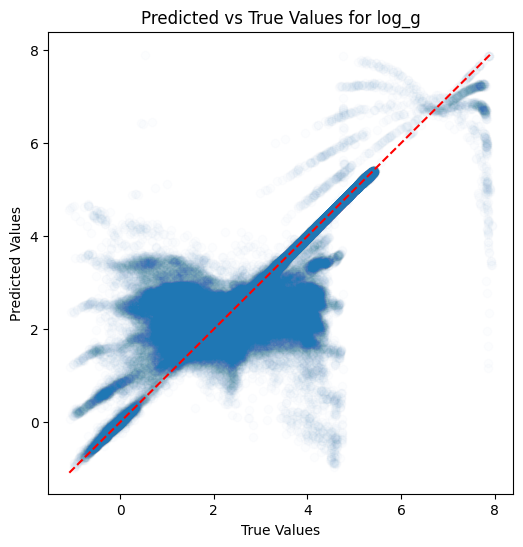

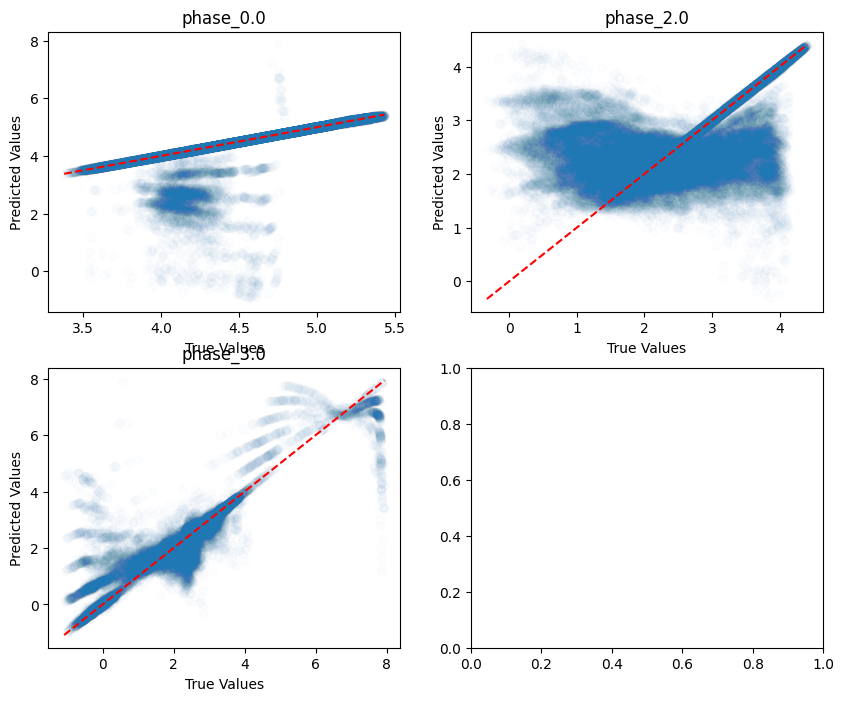

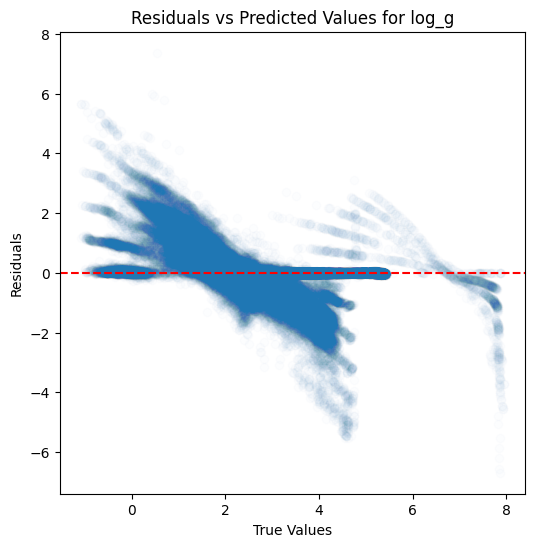

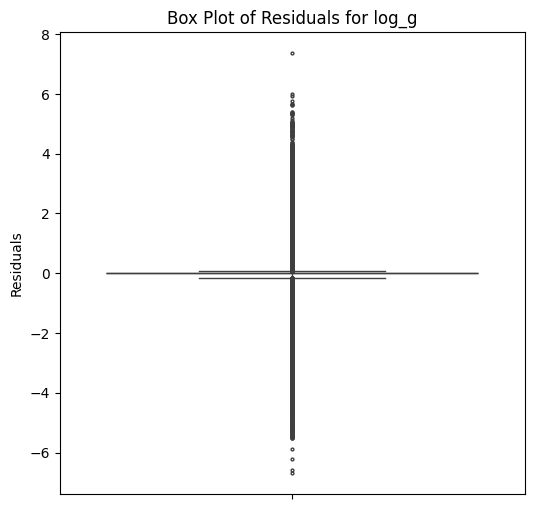

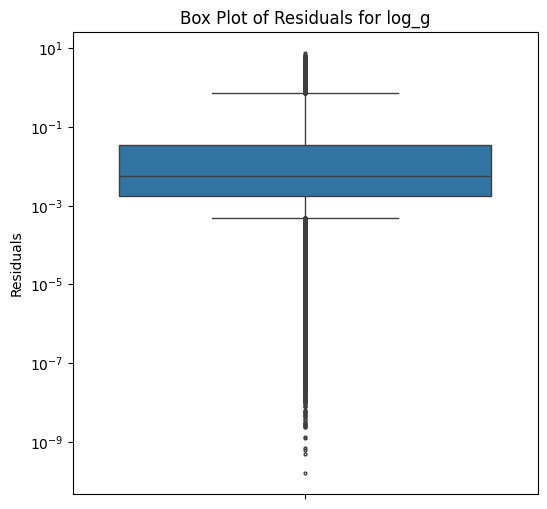

...

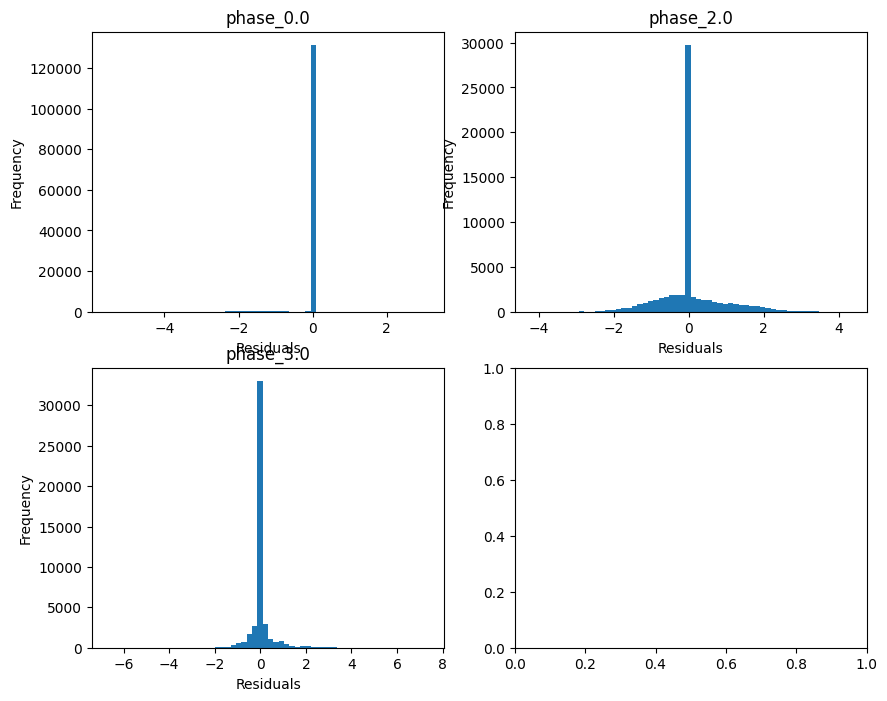

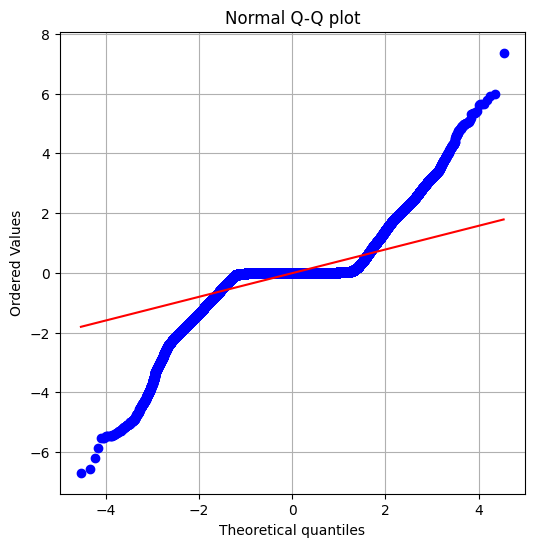

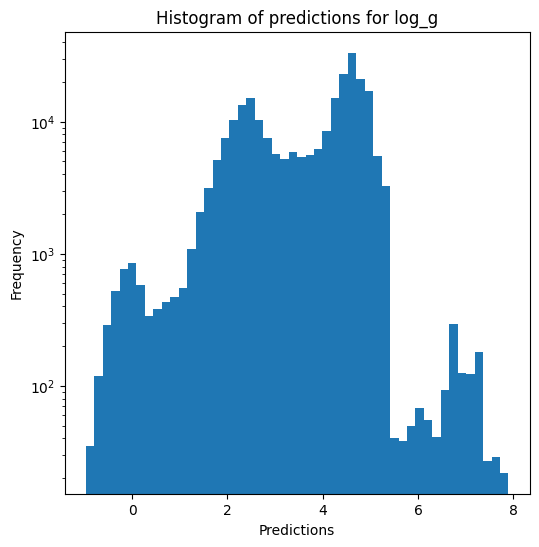

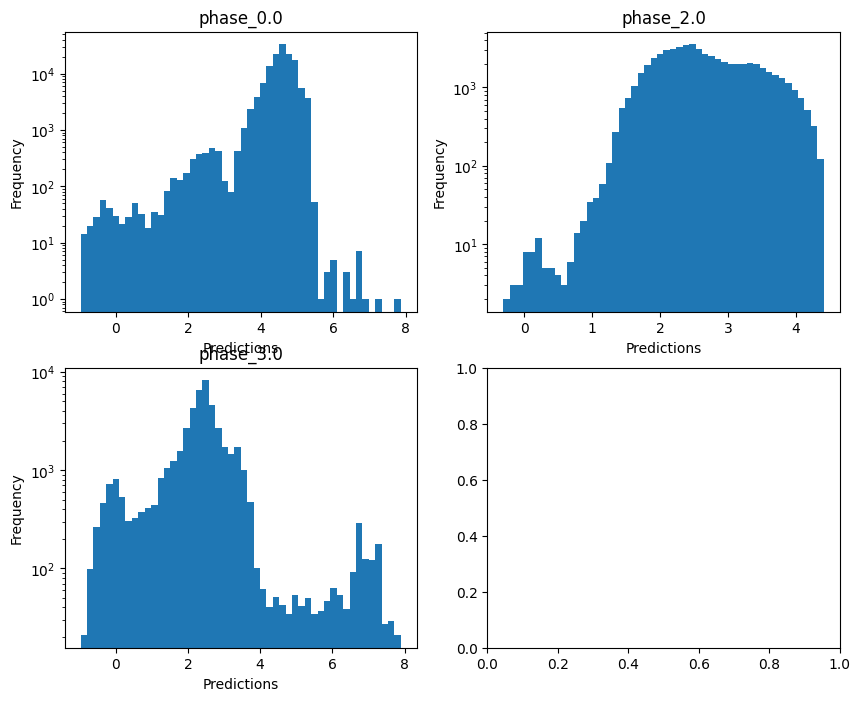

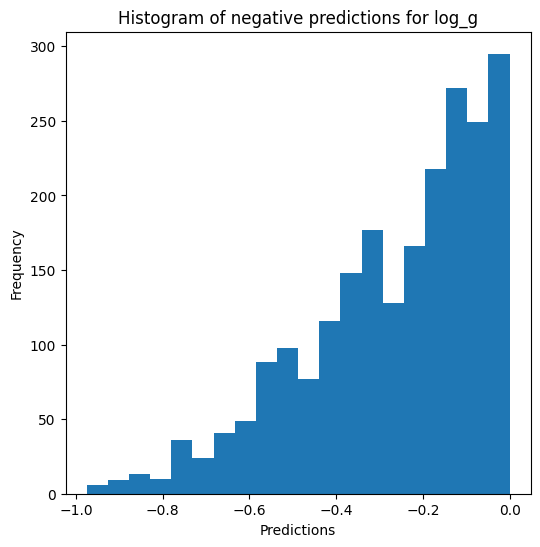


radius results for the phase category with a value of 0.0
  value range :  -0.9974234436680278 - 0.7629161677552769
  RVE :  0.7029386440545523
  RMSE :  0.17570029637062587
  MAE :  0.029670291355456287
  MedAE :  0.0022087953692212503
  CORR :  0.8861236245684995
  MAX_ER :  2.7629001701216254
  Percentiles : 
    75th percentile :  0.004874307852698392
    90th percentile :  0.01032031801636055
    95th percentile :  0.0197836471793755
    99th percentile :  0.9471636511721164

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.353416446984946
  RVE :  0.18920948928470582
  RMSE :  0.41495706720366543
  MAE :  0.24297254635672202
  MedAE :  0.047194662958678024
  CORR :  0.48907376321397544
  MAX_ER :  2.1641239351950547
  Percentiles : 
    75th percentile :  0.40180608655104755
    90th percentile :  0.7524602482401781
    95th percentile :  0.957217382797559
    99th percentile :  1.3649087077296531

radius results for the phase cat

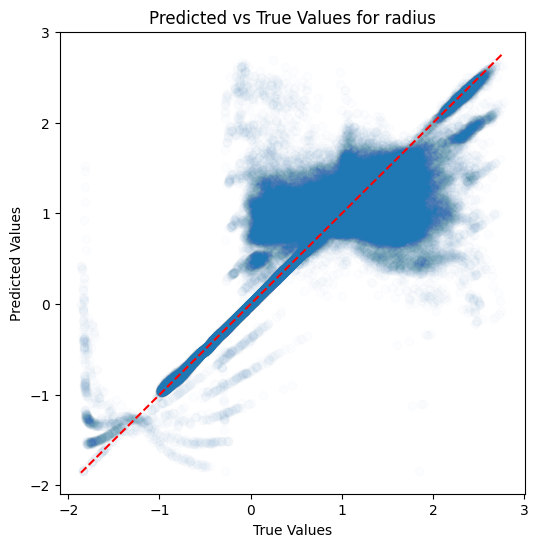

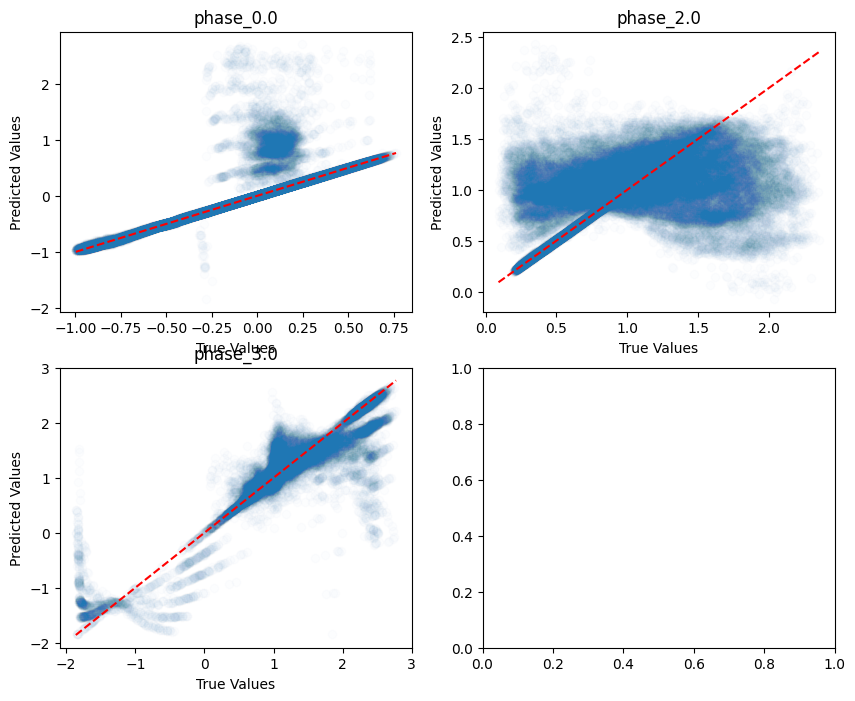

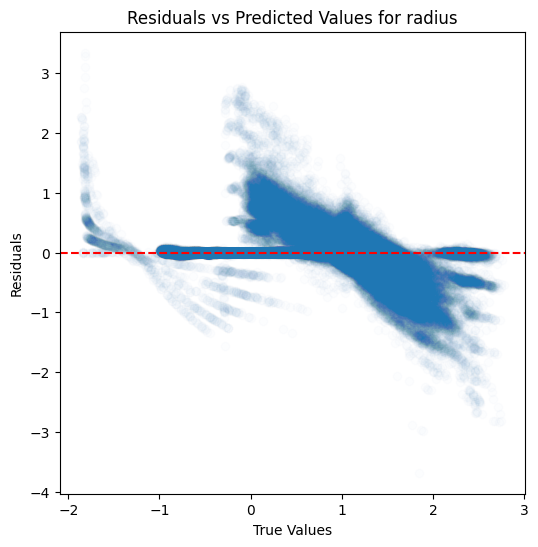

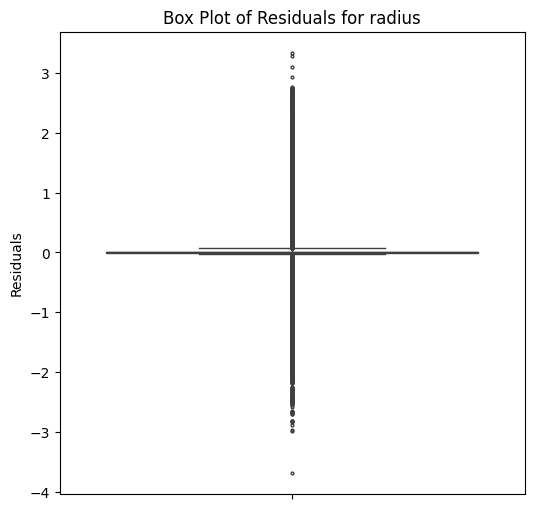

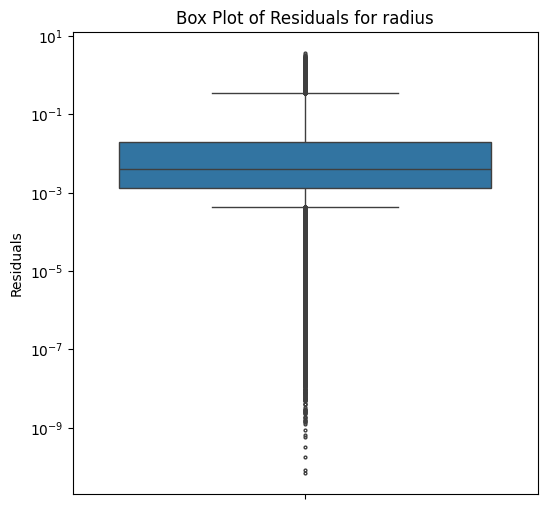

...

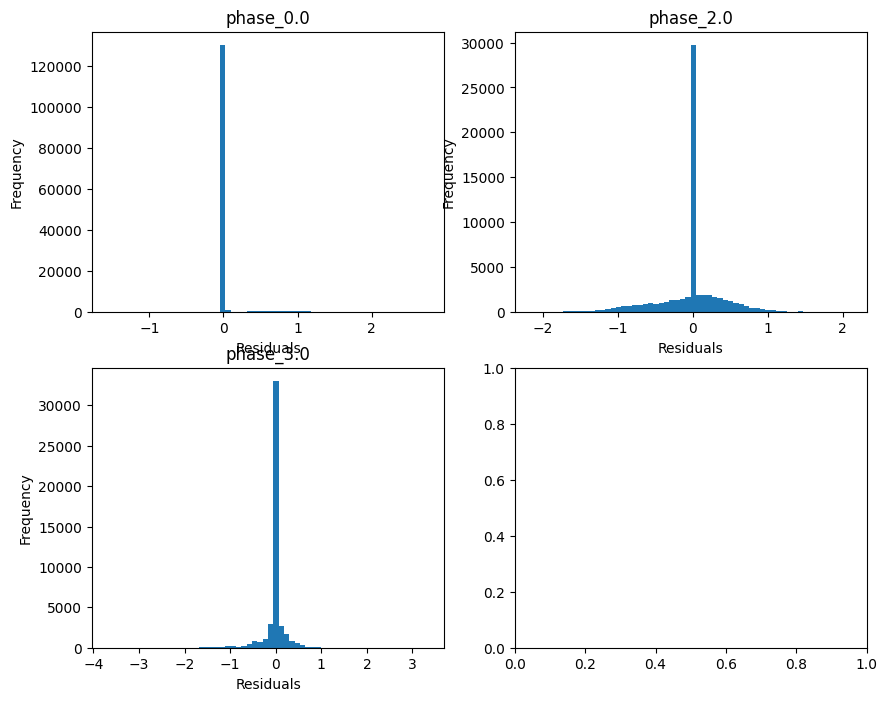

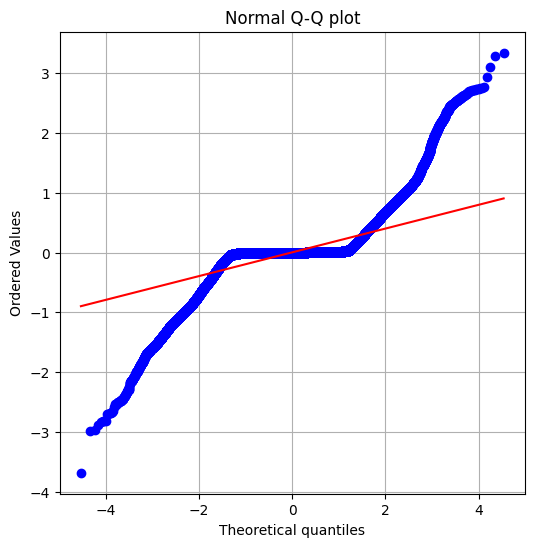

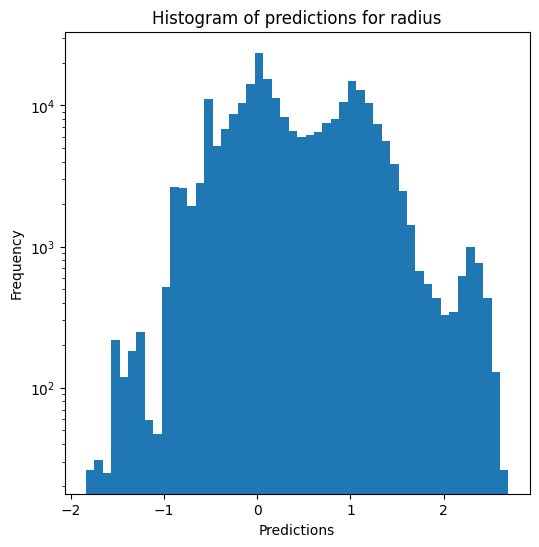

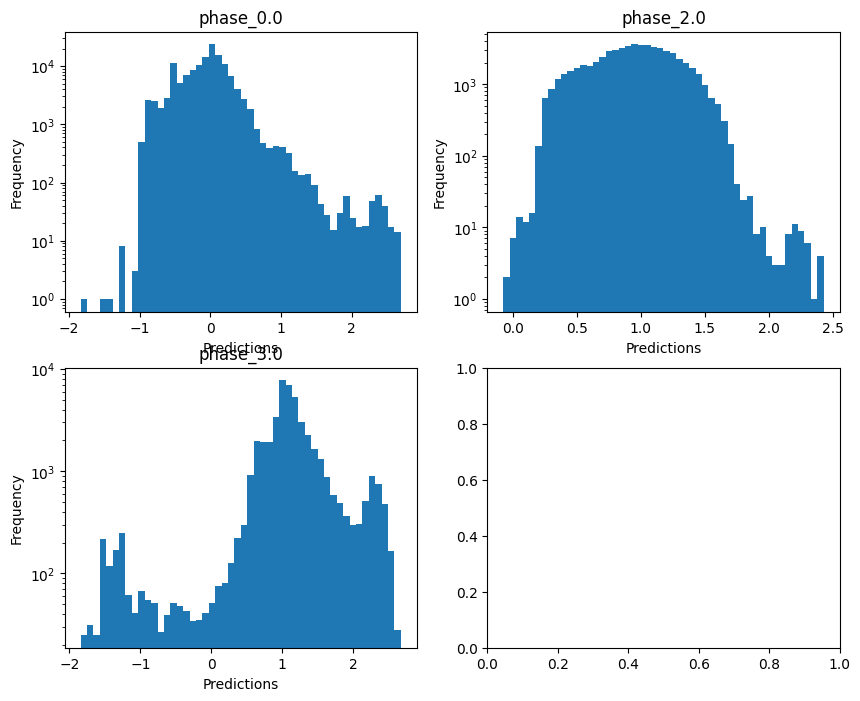

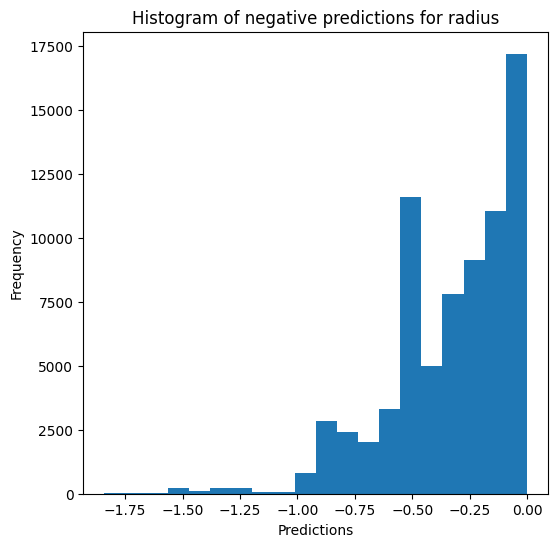

Saving predictions and results...


In [33]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True)

### Random forests

In [34]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.9851352815837138
  RMSE :  0.02447699227964094
  MAE :  0.004800385384830217
  MedAE :  0.0004967682996999123
  CORR :  0.9927057113057539
  MAX_ER :  1.2062230042087965
  Percentiles : 
    75th percentile :  0.0012894616557803662
    90th percentile :  0.0036784319876701052
    95th percentile :  0.010297254969091478
    99th percentile :  0.13197401735621406

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.276512878191396
  RVE :  0.8440263014817975
  RMSE :  0.05700833005832001
  MAE :  0.032755928637031785
  MedAE :  0.007846570444146828
  CORR :  0.9198040287210958
  MAX_ER :  0.29981273514976614
  Percentiles : 
    75th percentile :  0.04950124796431998
    90th percentile :  0.1025067994

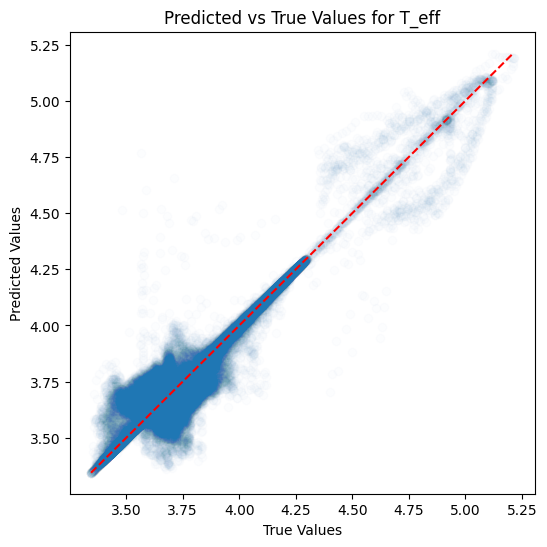

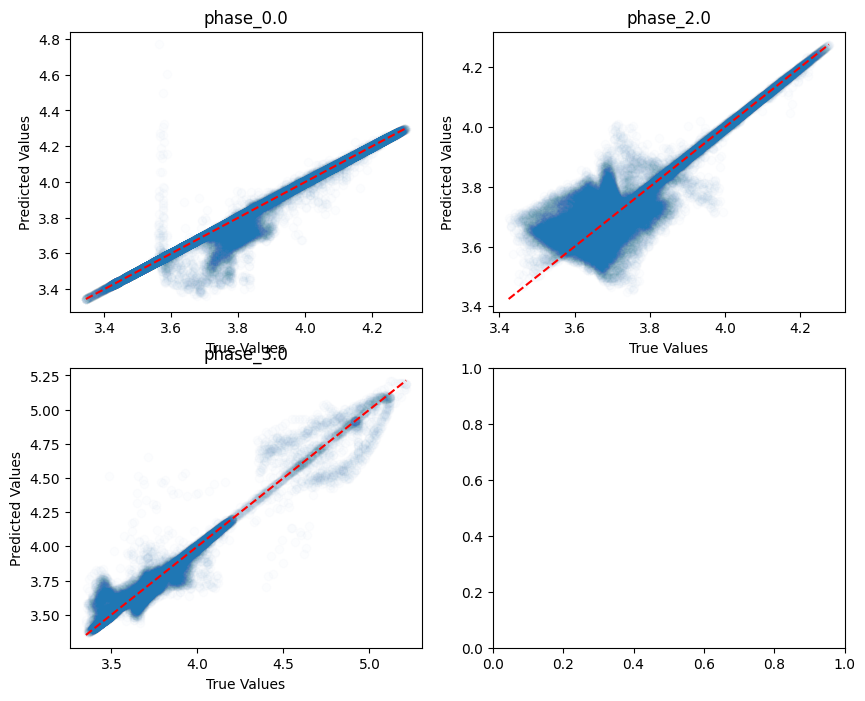

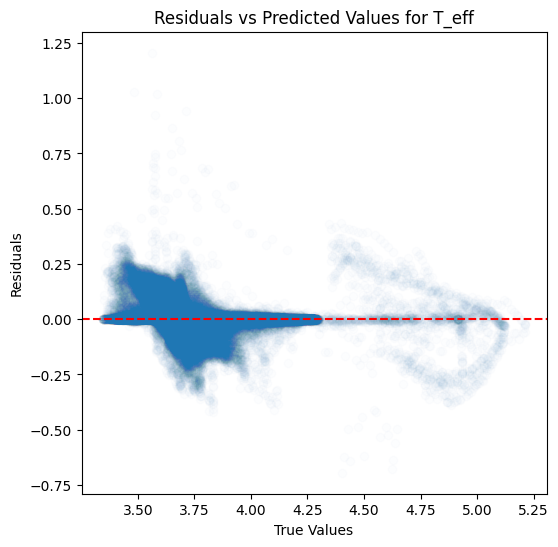

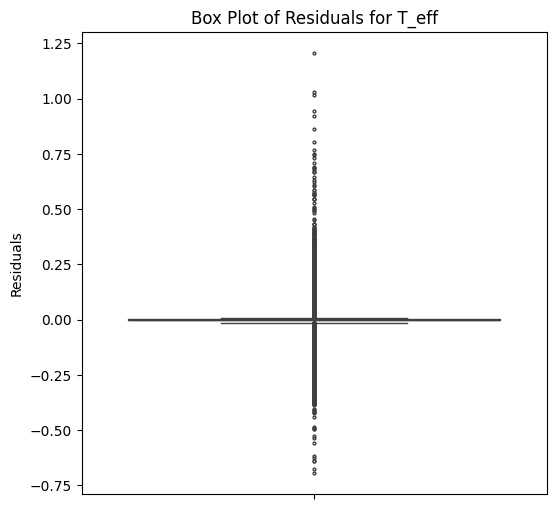

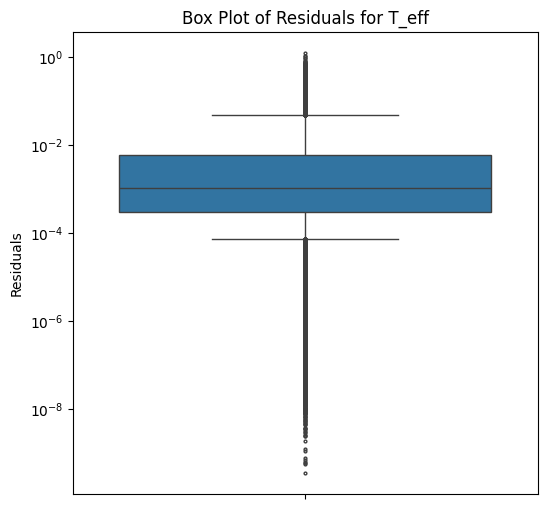

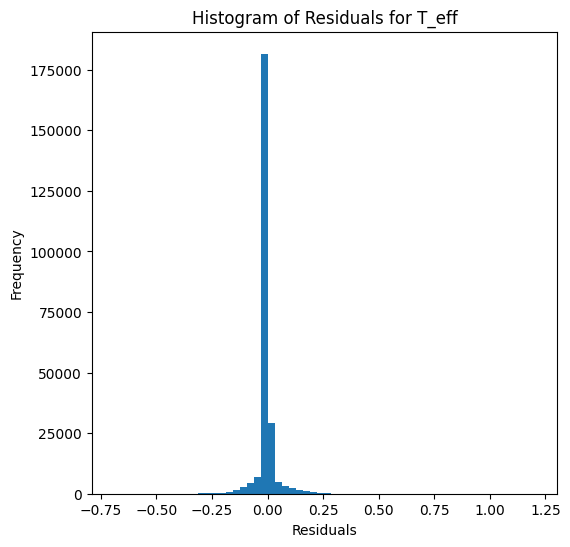

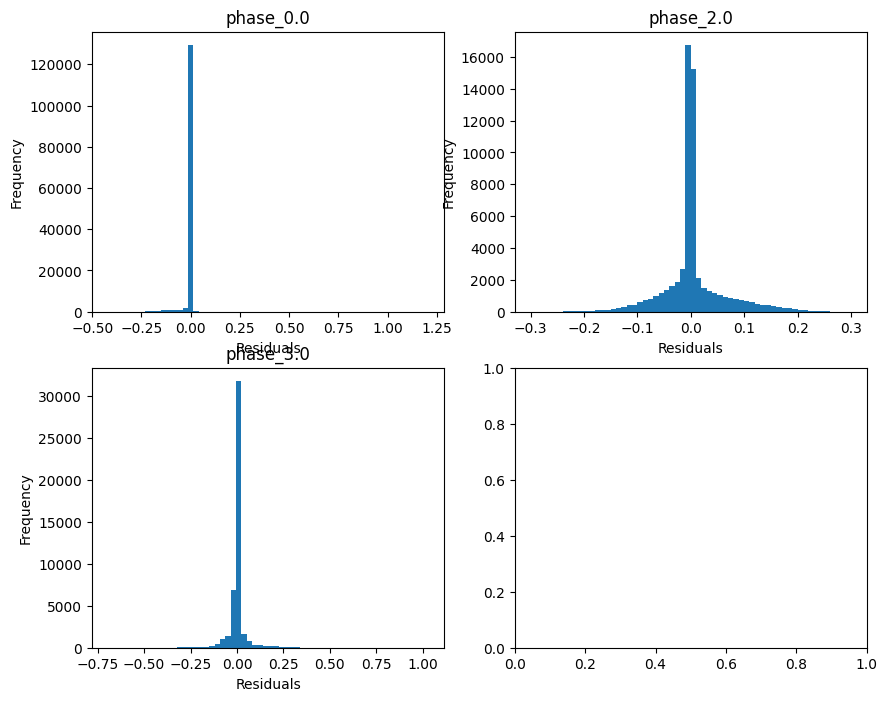

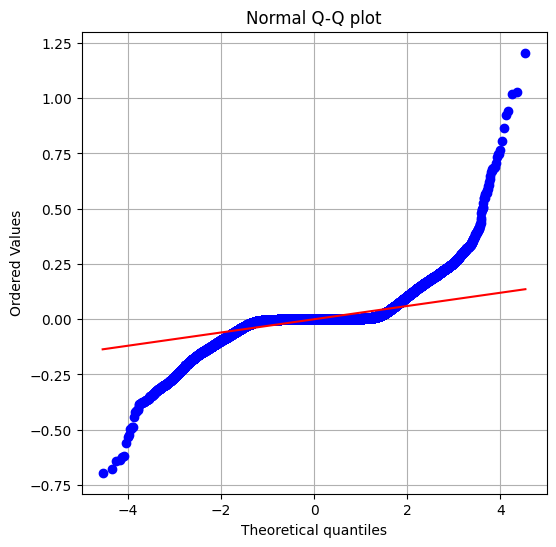

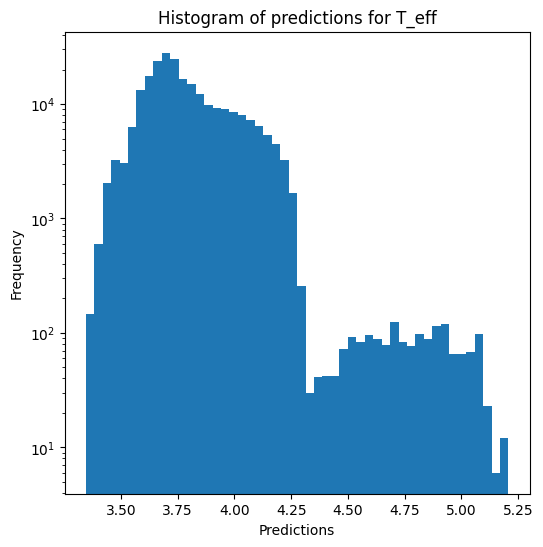

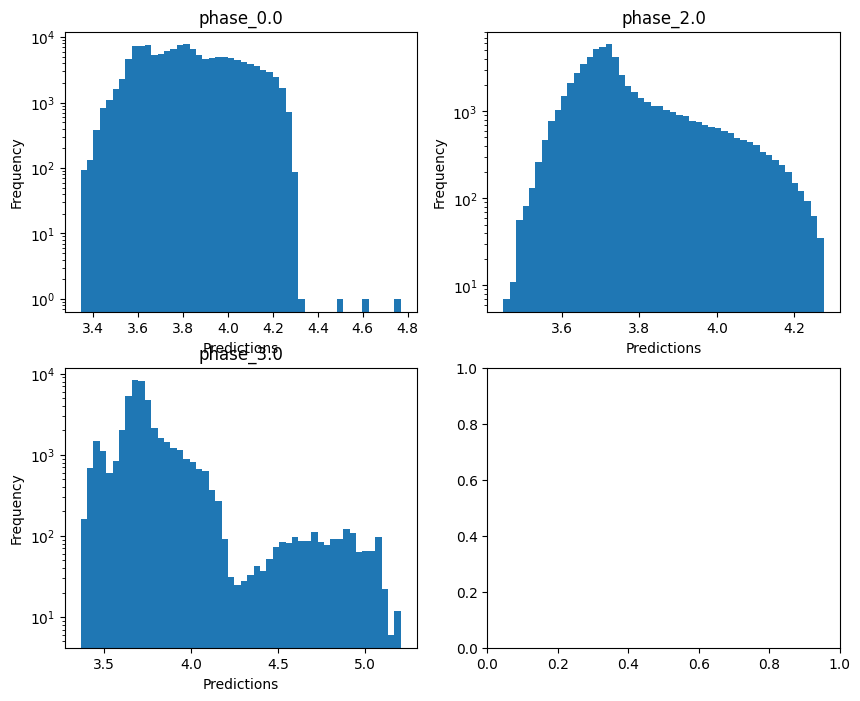


log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.432991769220164
  RVE :  -0.2664717741044109
  RMSE :  0.3904329228257322
  MAE :  0.06571719249224556
  MedAE :  0.0013838693510361821
  CORR :  0.7290591901788438
  MAX_ER :  5.537638405418559
  Percentiles : 
    75th percentile :  0.003617353963925929
    90th percentile :  0.010923929462931697
    95th percentile :  0.07035778777987324
    99th percentile :  2.3297233995115865

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  -0.10091682521494816
  RMSE :  1.0104407960864261
  MAE :  0.5920632473298327
  MedAE :  0.10704394364459091
  CORR :  0.3319958918179881
  MAX_ER :  4.501144778824359
  Percentiles : 
    75th percentile :  1.0005955499986763
    90th percentile :  1.8663289201049746
    95th percentile :  2.348226679912168
    99th percentile :  3.228466790118353

log_g results for the phase category with 

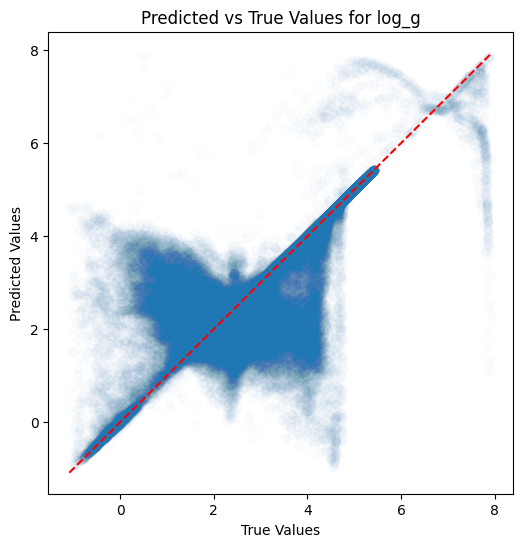

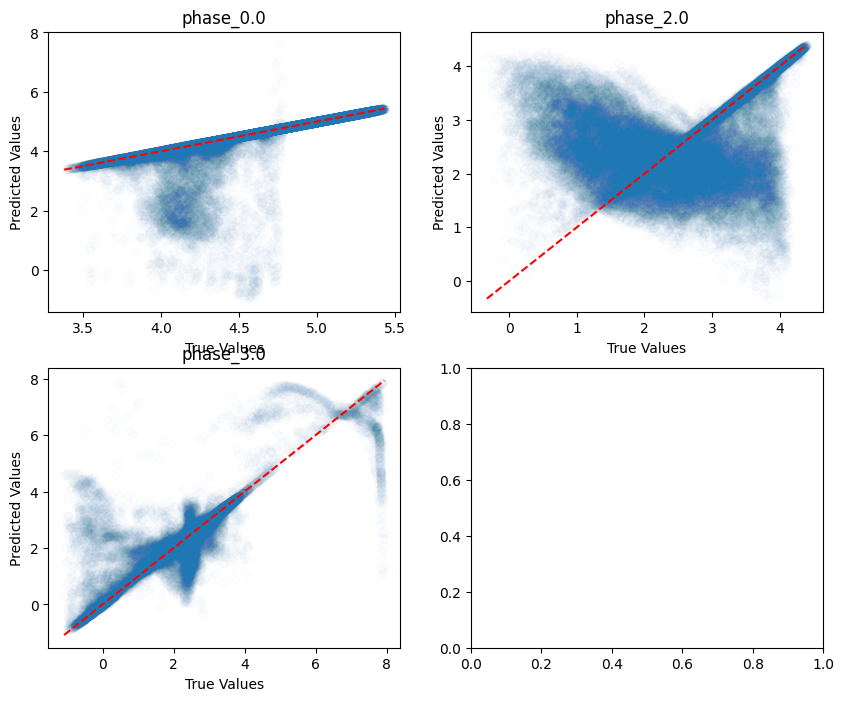

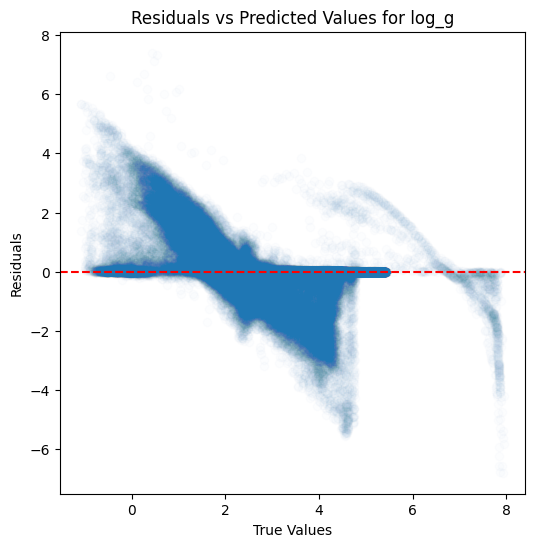

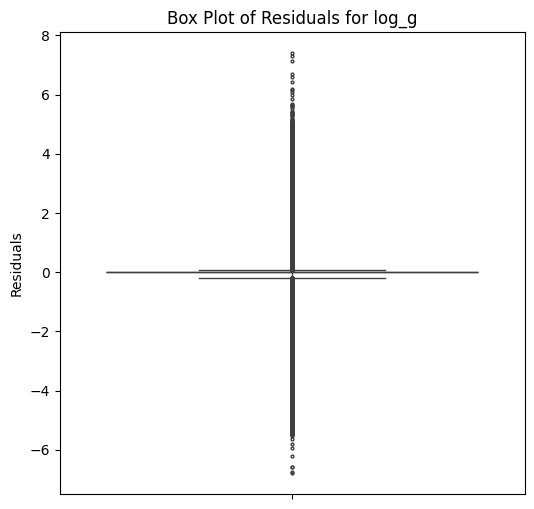

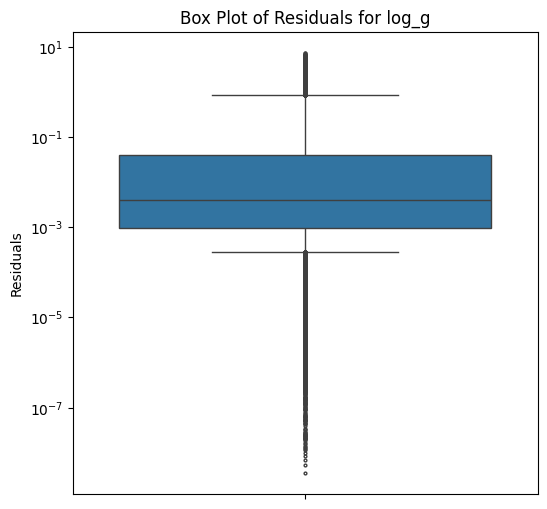

...

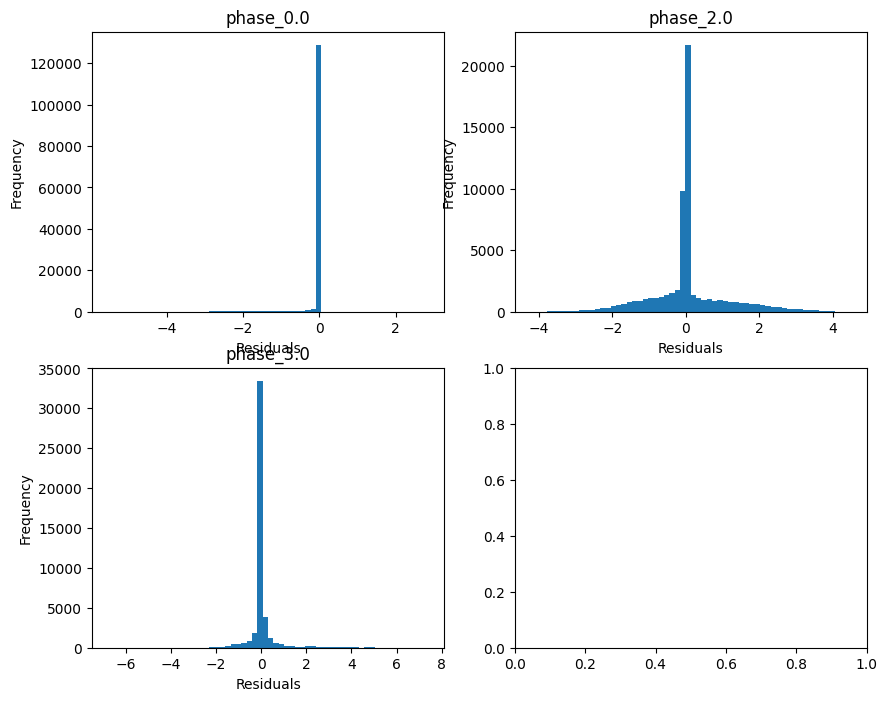

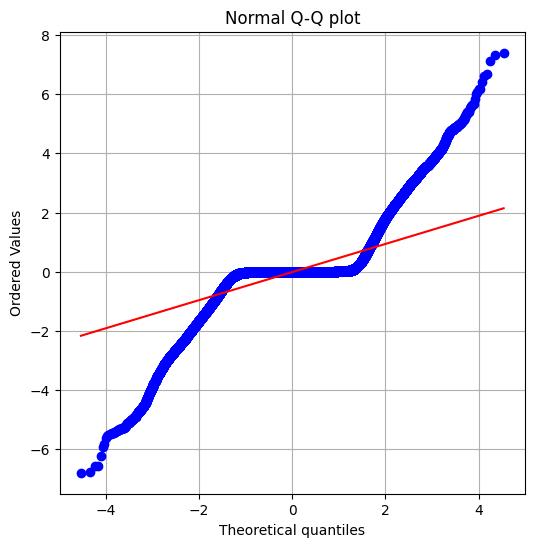

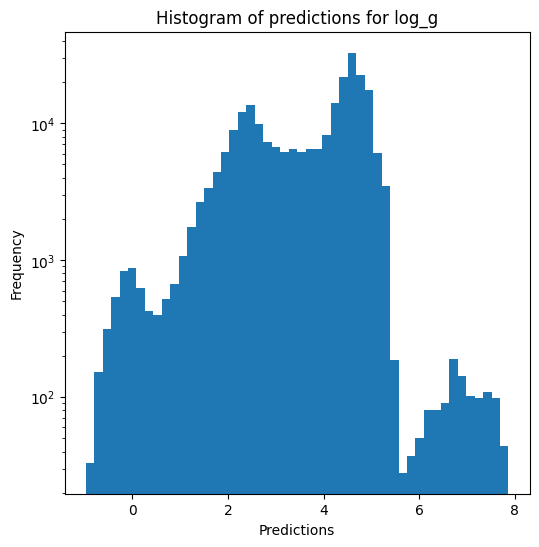

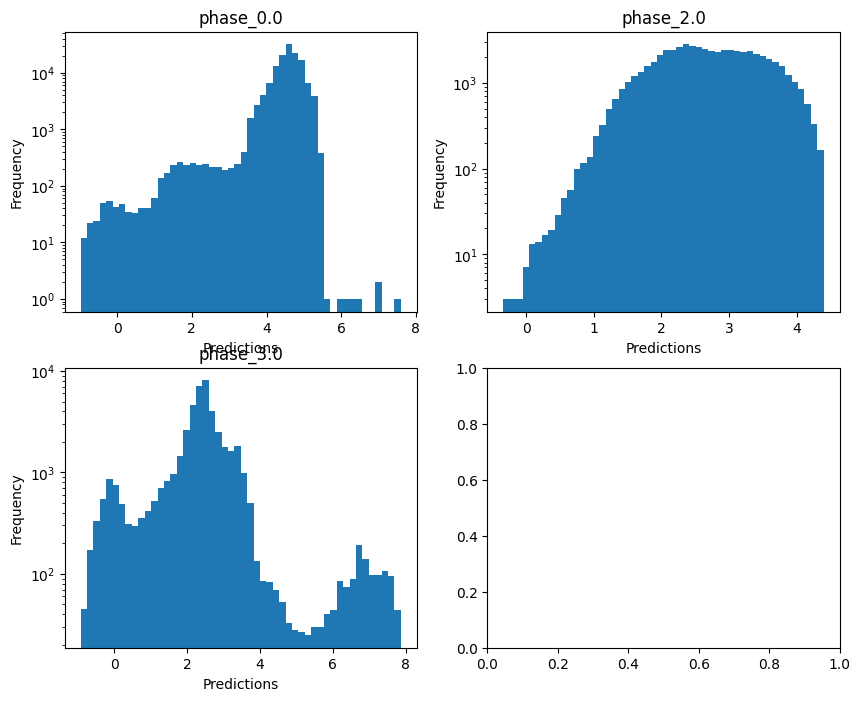

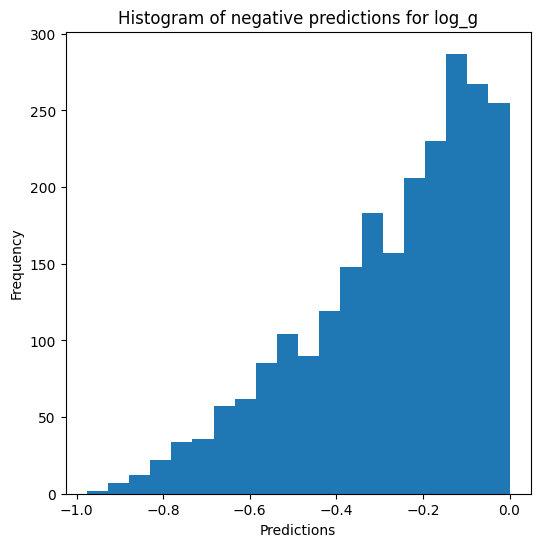


radius results for the phase category with a value of 0.0
  value range :  -0.9974234436680278 - 0.7629161677552769
  RVE :  0.6349911224215185
  RMSE :  0.19522935690039275
  MAE :  0.033054597114928655
  MedAE :  0.0008734238421599094
  CORR :  0.8675599665469864
  MAX_ER :  2.768649854387297
  Percentiles : 
    75th percentile :  0.0021664208257160533
    90th percentile :  0.005976253273663212
    95th percentile :  0.035375976148419586
    99th percentile :  1.1648751843897087

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.353416446984946
  RVE :  -0.2021717896549322
  RMSE :  0.505204724101036
  MAE :  0.2960280806444812
  MedAE :  0.05354831426434248
  CORR :  0.2698445767041976
  MAX_ER :  2.2508455590418377
  Percentiles : 
    75th percentile :  0.5003574800271962
    90th percentile :  0.9330648196243324
    95th percentile :  1.1740470434422052
    99th percentile :  1.6142946708593828

radius results for the phase categ

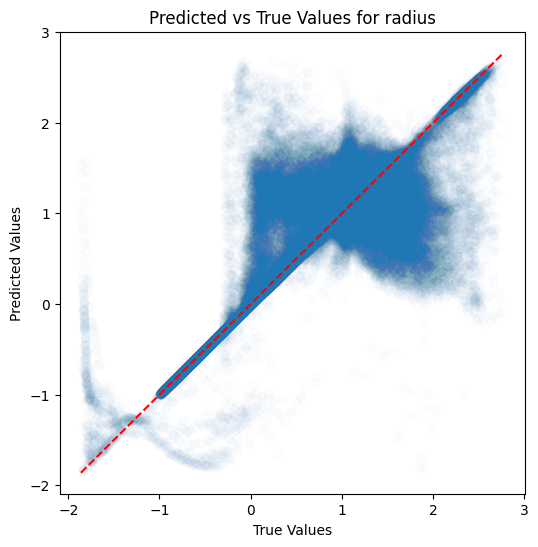

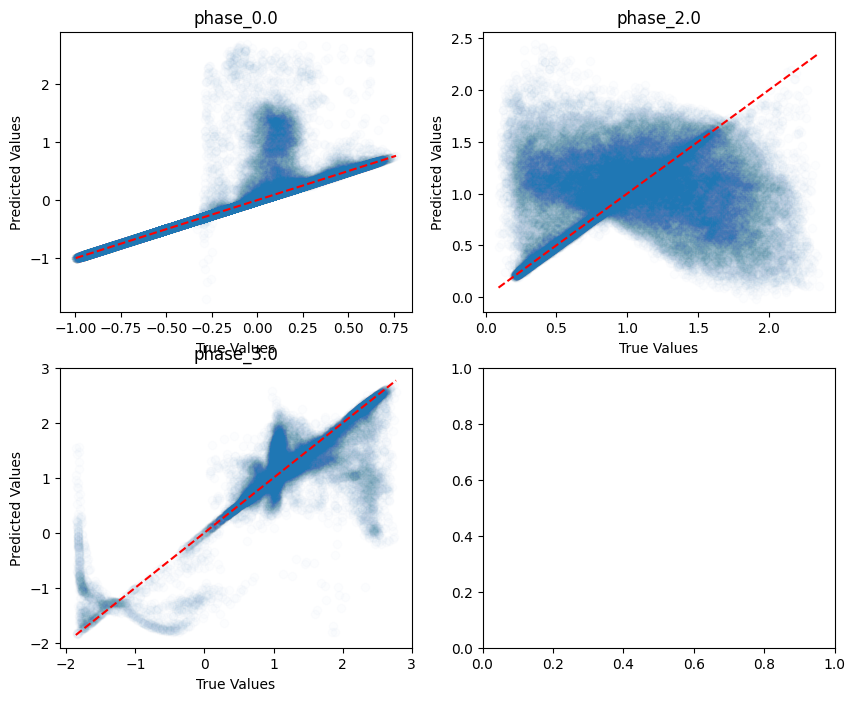

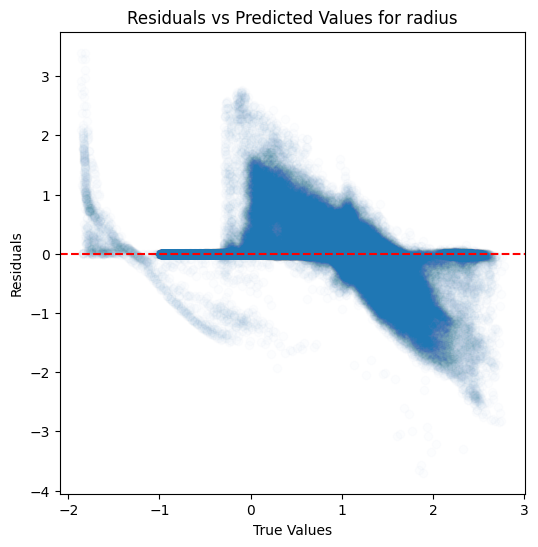

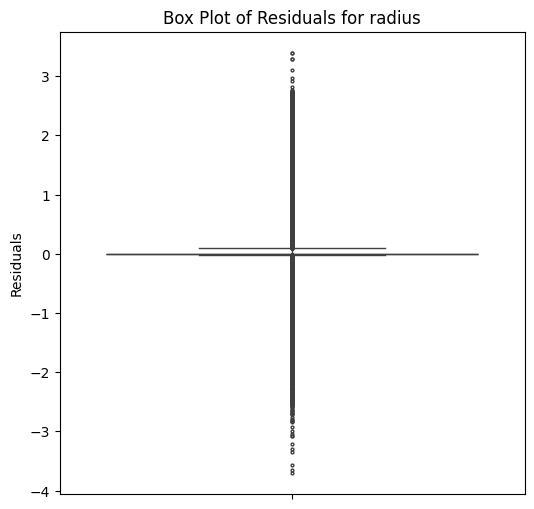

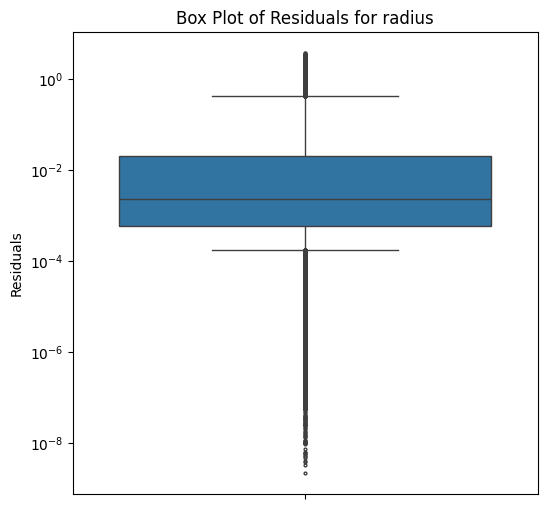

...

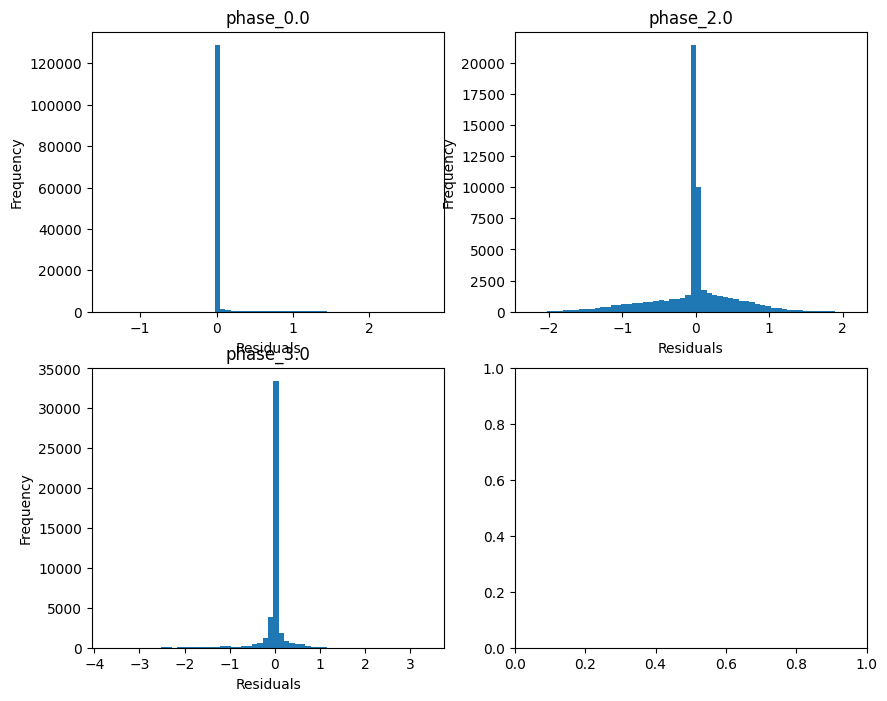

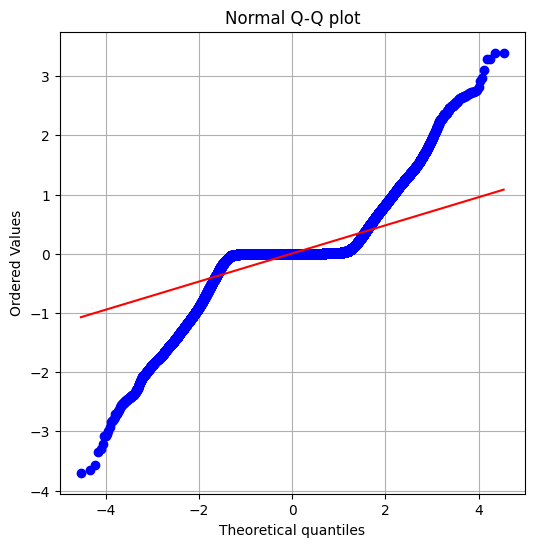

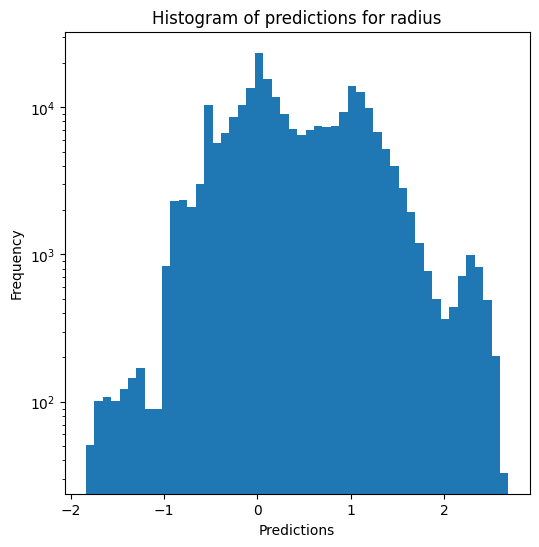

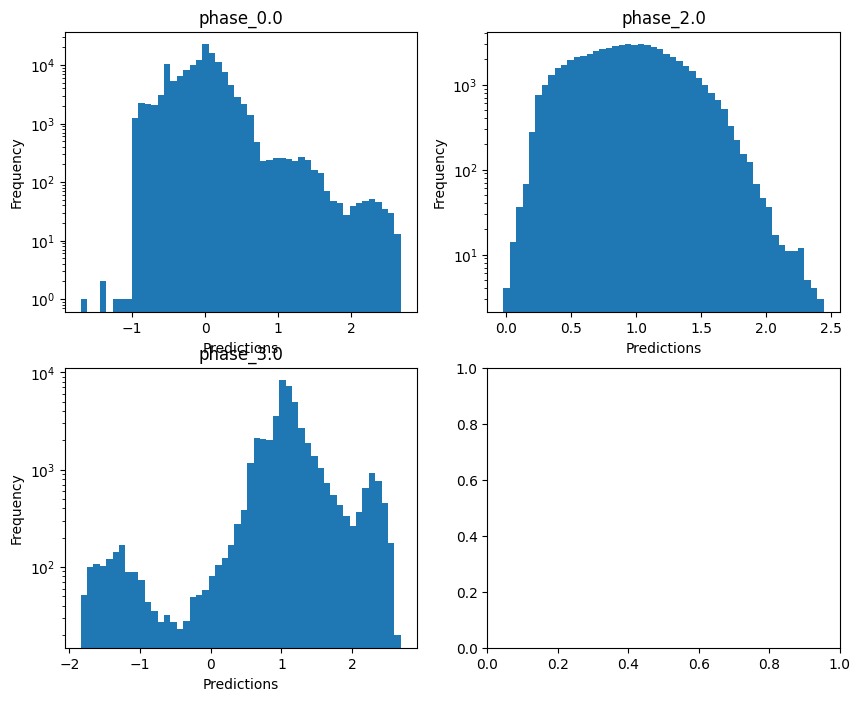

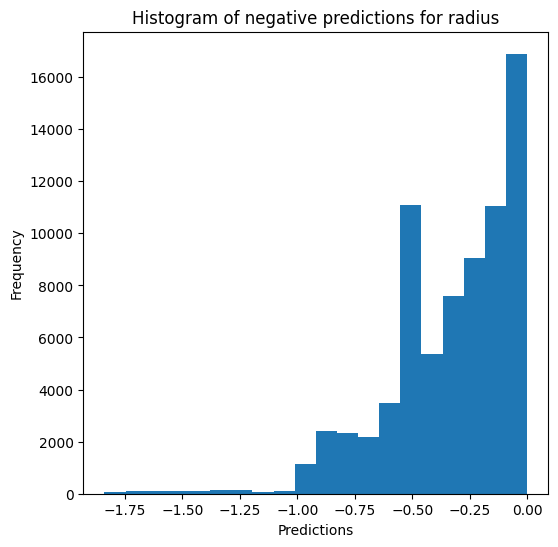

Saving predictions and results...


In [35]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True, n_jobs=5)

### XGBoost

In [36]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.9515547621623851
  RMSE :  0.04657882930901141
  MAE :  0.024062211514531157
  MedAE :  0.007255052617085145
  CORR :  0.9755077862758875
  MAX_ER :  1.251044029312676
  Percentiles : 
    75th percentile :  0.02377724885715793
    90th percentile :  0.07933880316449
    95th percentile :  0.10877789956403985
    99th percentile :  0.17338761269113992

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.276512878191396
  RVE :  0.7577982357657524
  RMSE :  0.07375813972862812
  MAE :  0.059227185701201224
  MedAE :  0.05101340953896072
  CORR :  0.8708321537655975
  MAX_ER :  0.27928959201612047
  Percentiles : 
    75th percentile :  0.08645159987650142
    90th percentile :  0.12154670384519717
   

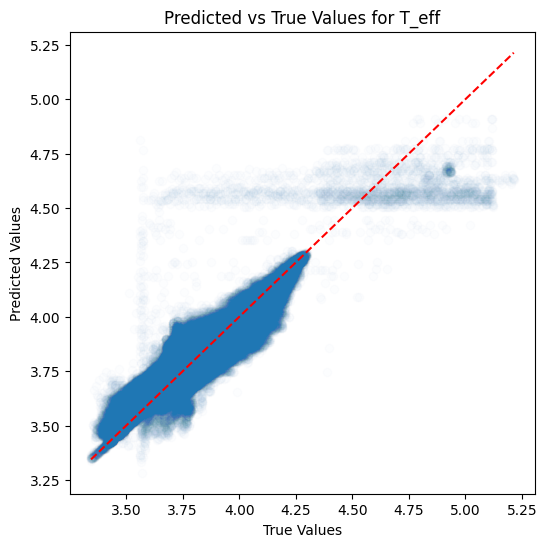

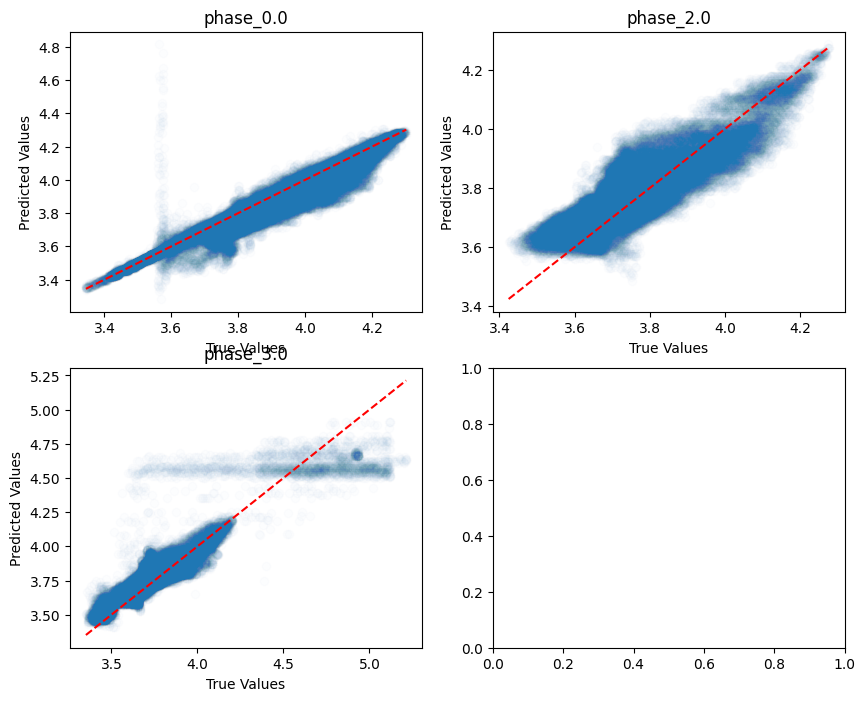

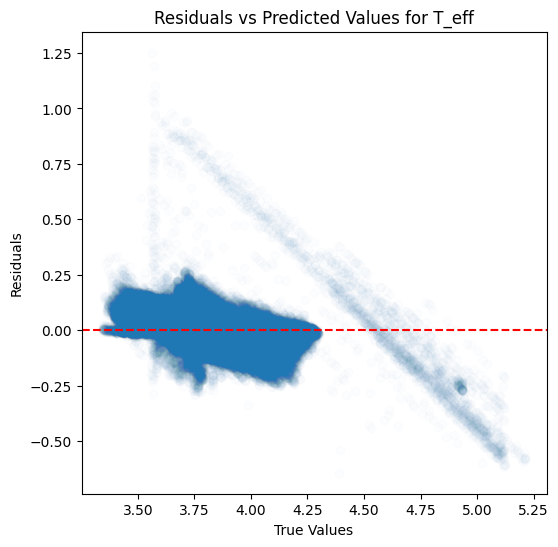

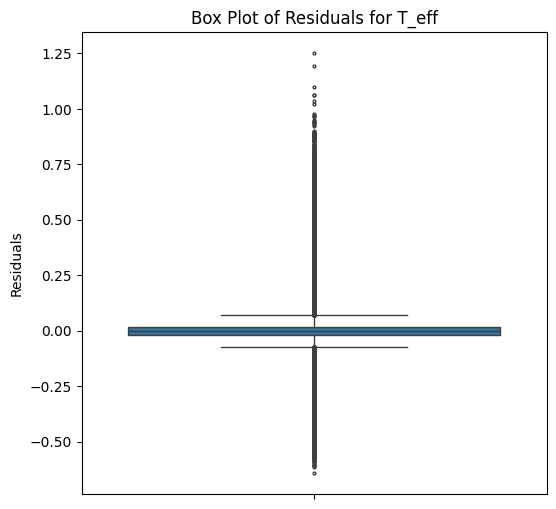

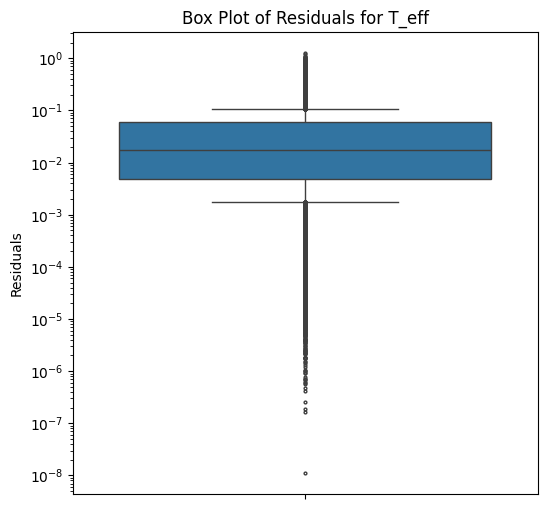

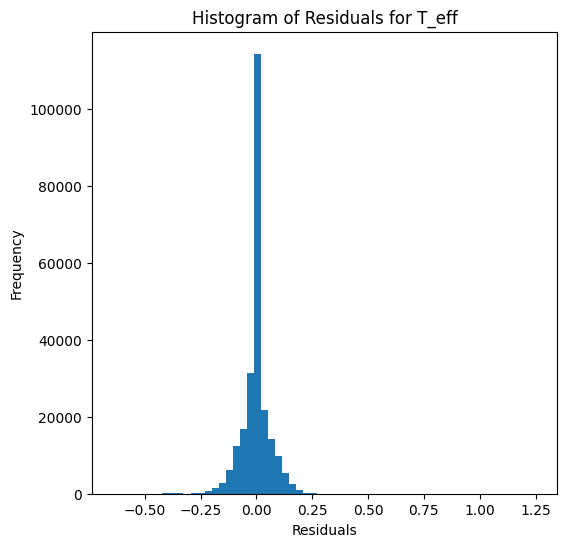

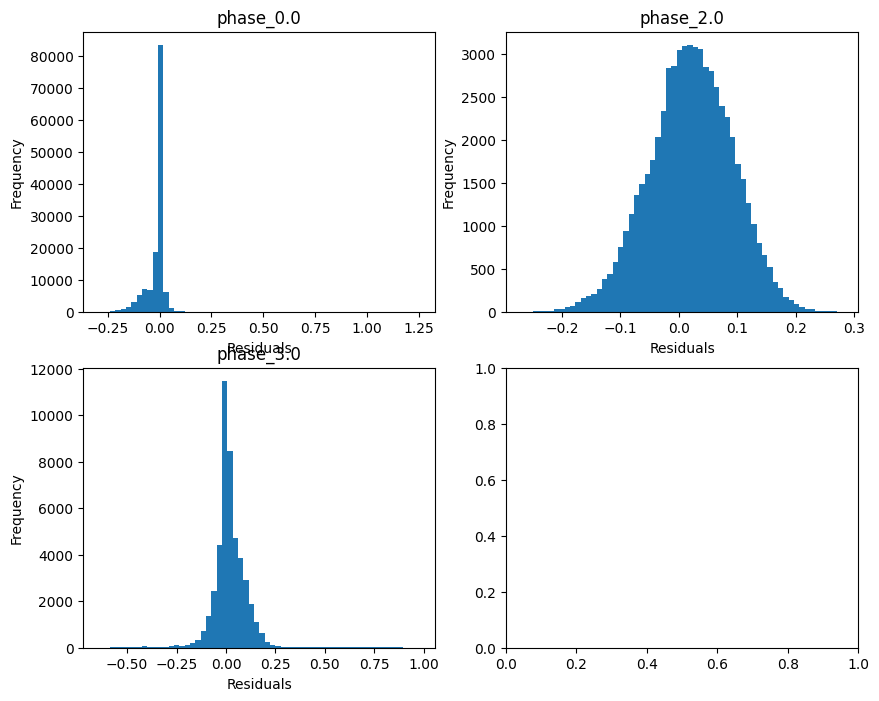

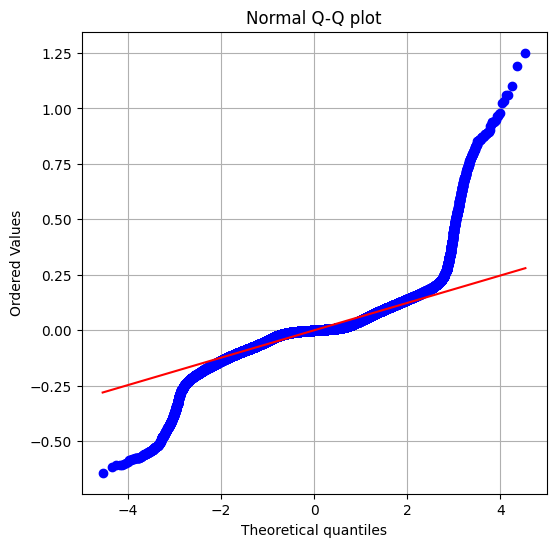

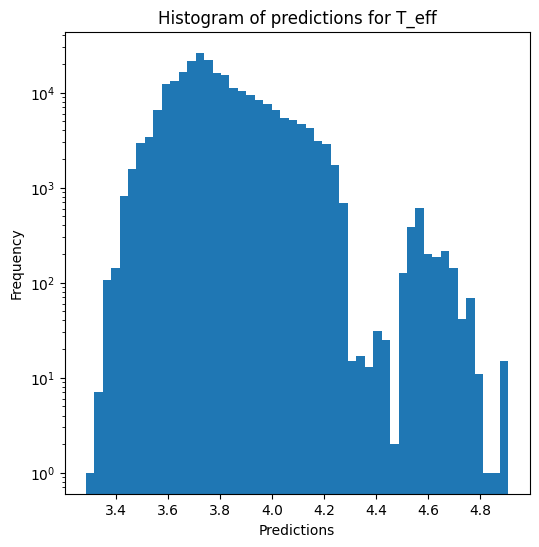

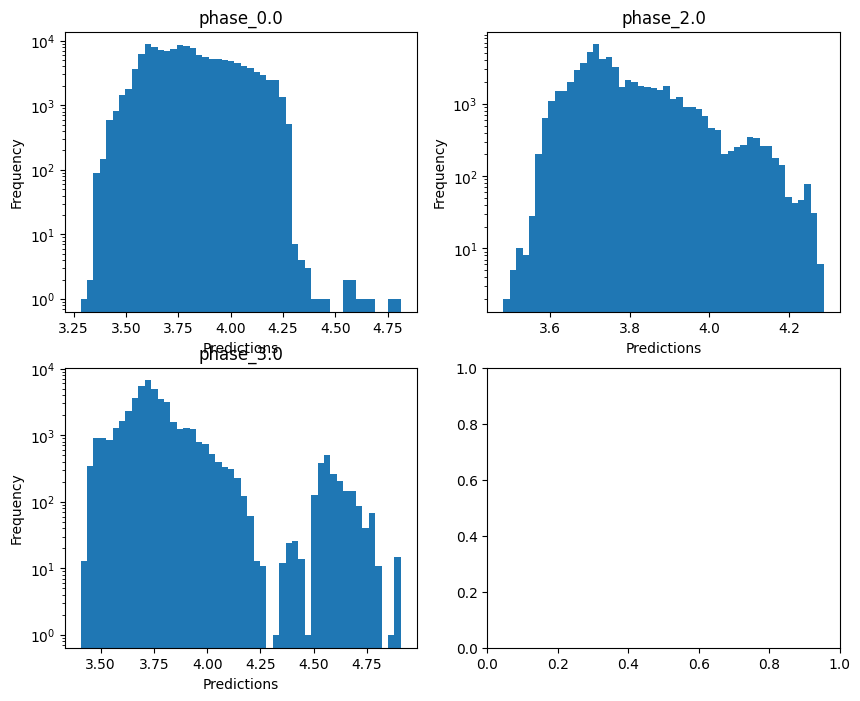


log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.432991769220164
  RVE :  -0.4550557010592451
  RMSE :  0.4381308602114693
  MAE :  0.19684650331151868
  MedAE :  0.03990198553391
  CORR :  0.8183154297391062
  MAX_ER :  4.854844857226363
  Percentiles : 
    75th percentile :  0.16773751934990333
    90th percentile :  0.602169927575861
    95th percentile :  0.9962713753813425
    99th percentile :  1.7185062748435256

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  0.2989774540103858
  RMSE :  0.8142371177545348
  MAE :  0.6259140322422598
  MedAE :  0.4865158701109582
  CORR :  0.5477478402371235
  MAX_ER :  3.8817071668170327
  Percentiles : 
    75th percentile :  0.8914166740913056
    90th percentile :  1.3638653939258092
    95th percentile :  1.6743903235108801
    99th percentile :  2.2632913968050805

log_g results for the phase category with a value of

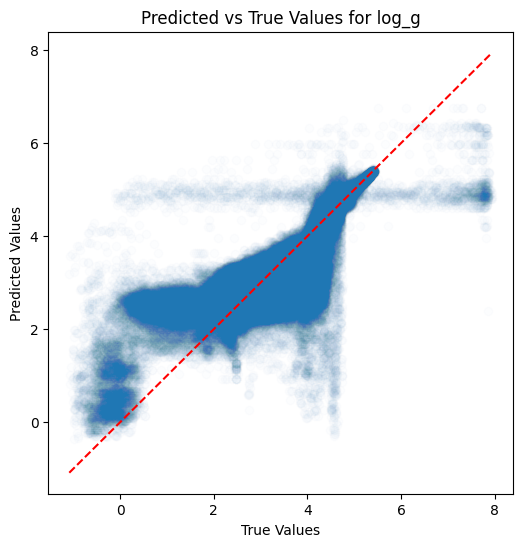

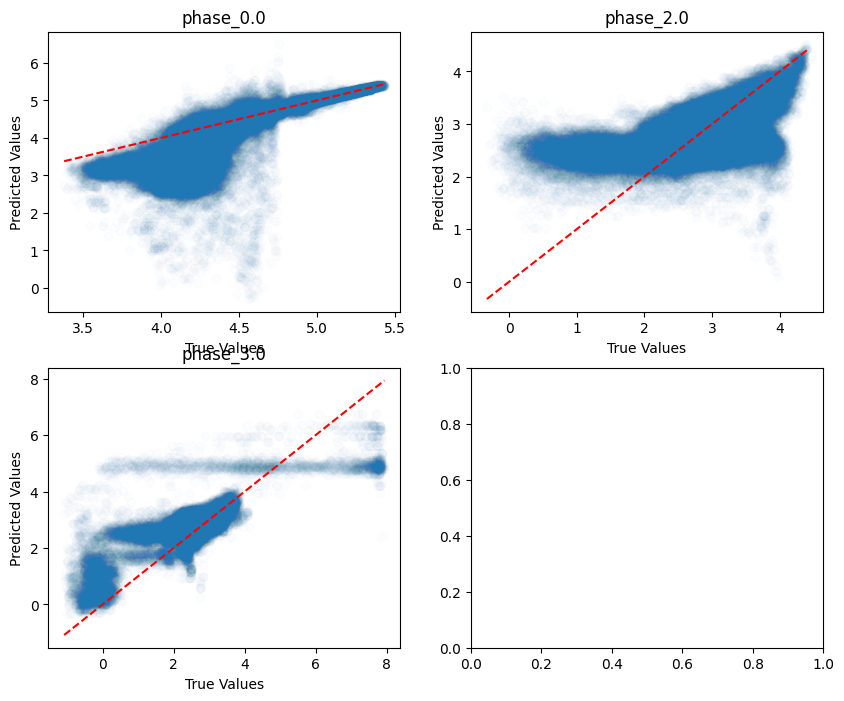

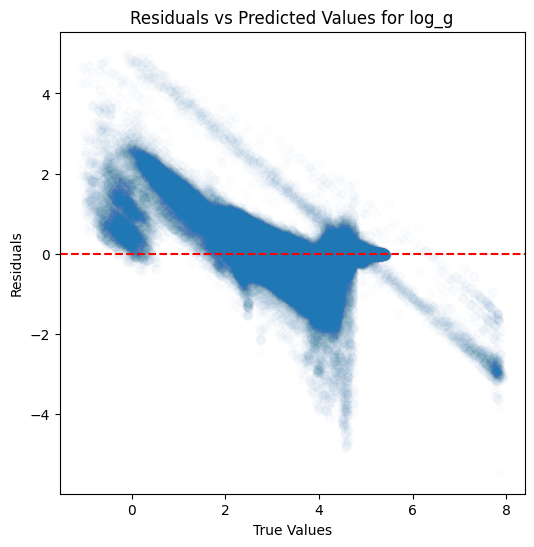

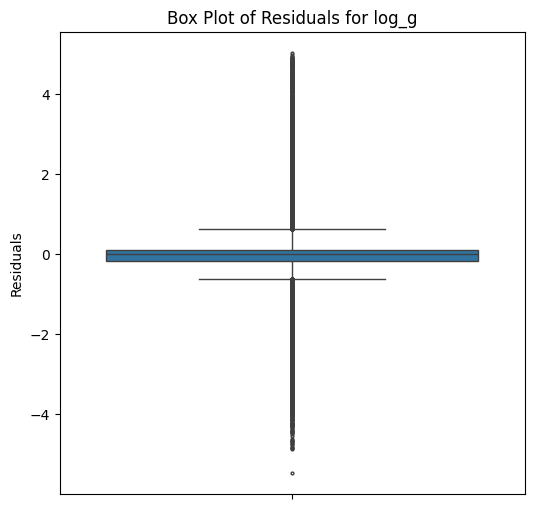

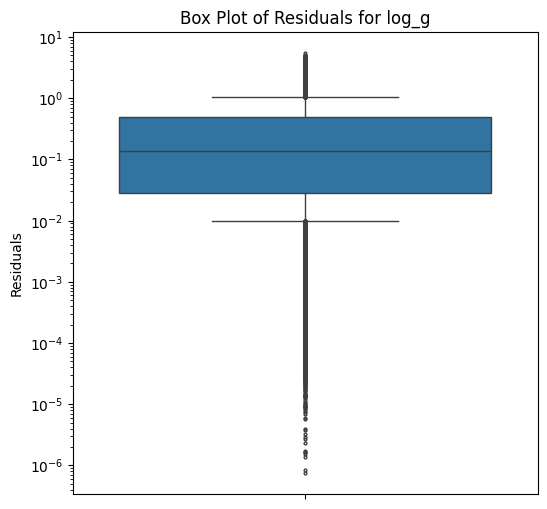

...

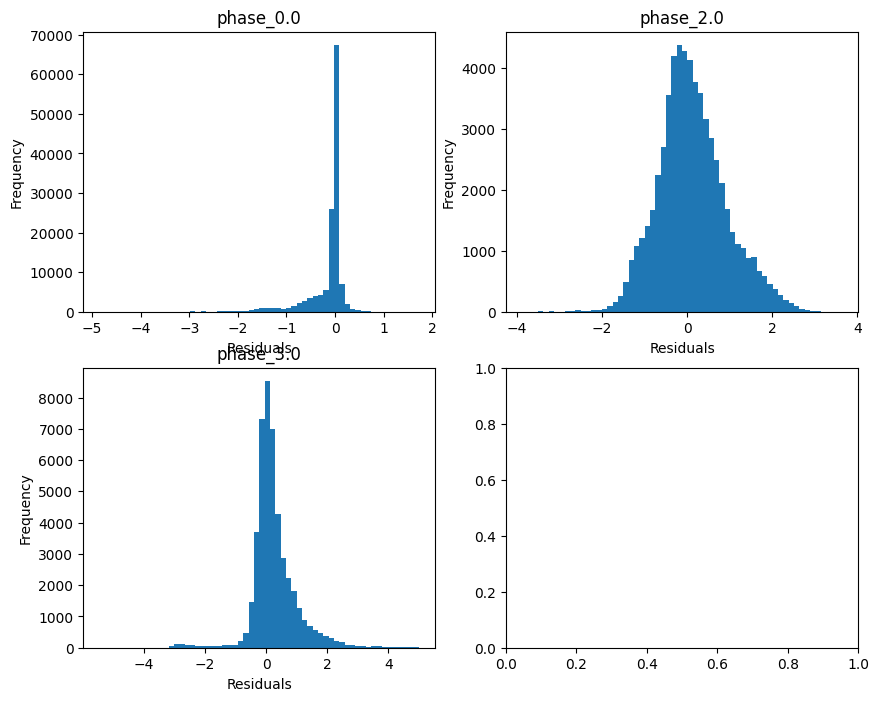

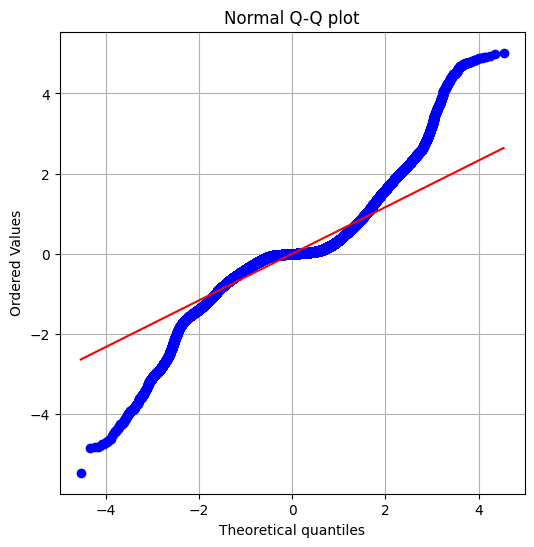

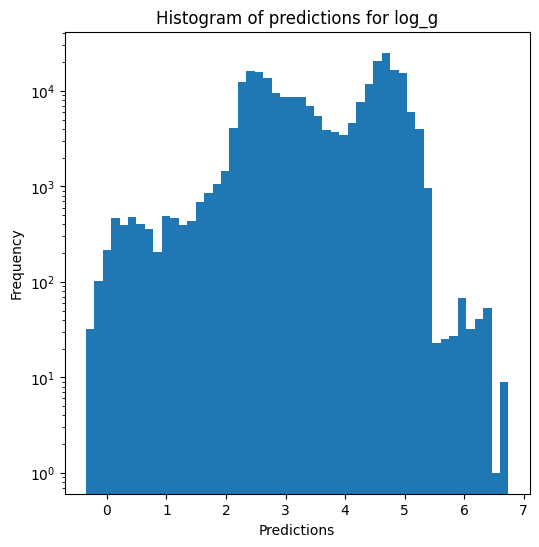

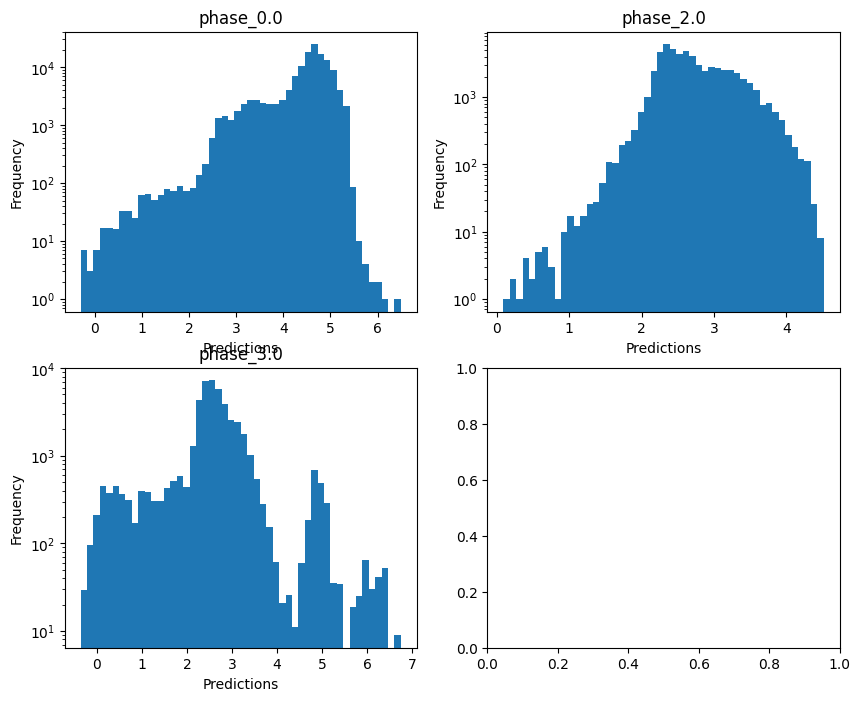

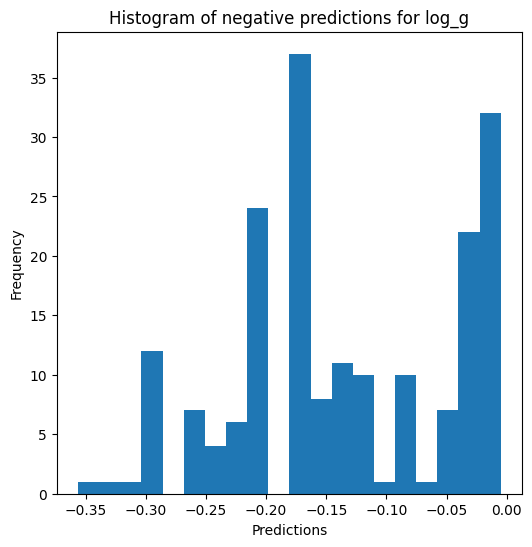


radius results for the phase category with a value of 0.0
  value range :  -0.9974234436680278 - 0.7629161677552769
  RVE :  0.5763740848495094
  RMSE :  0.22012629350696805
  MAE :  0.10032281184927883
  MedAE :  0.02267841367074963
  CORR :  0.889098836139754
  MAX_ER :  2.6920394110274932
  Percentiles : 
    75th percentile :  0.08728731206445944
    90th percentile :  0.30225535124081204
    95th percentile :  0.5039345472631378
    99th percentile :  0.8509817627596253

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.353416446984946
  RVE :  0.2358603494918028
  RMSE :  0.40678119315030564
  MAE :  0.31266136492239316
  MedAE :  0.242943367313325
  CORR :  0.4861788148122981
  MAX_ER :  2.013629887641608
  Percentiles : 
    75th percentile :  0.445482869883441
    90th percentile :  0.6824927988825691
    95th percentile :  0.837879334868407
    99th percentile :  1.1328428199765916

radius results for the phase category with a 

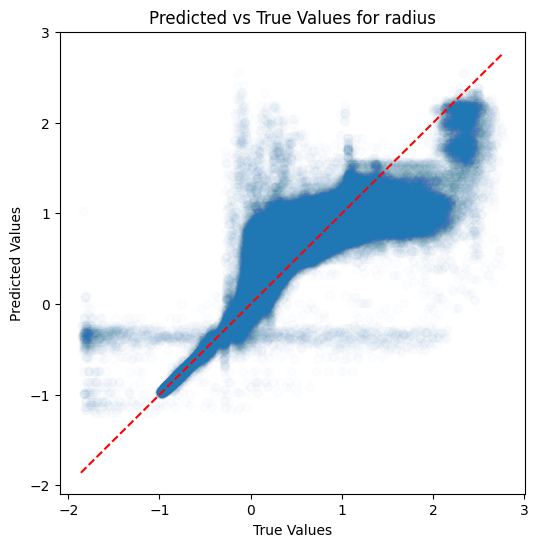

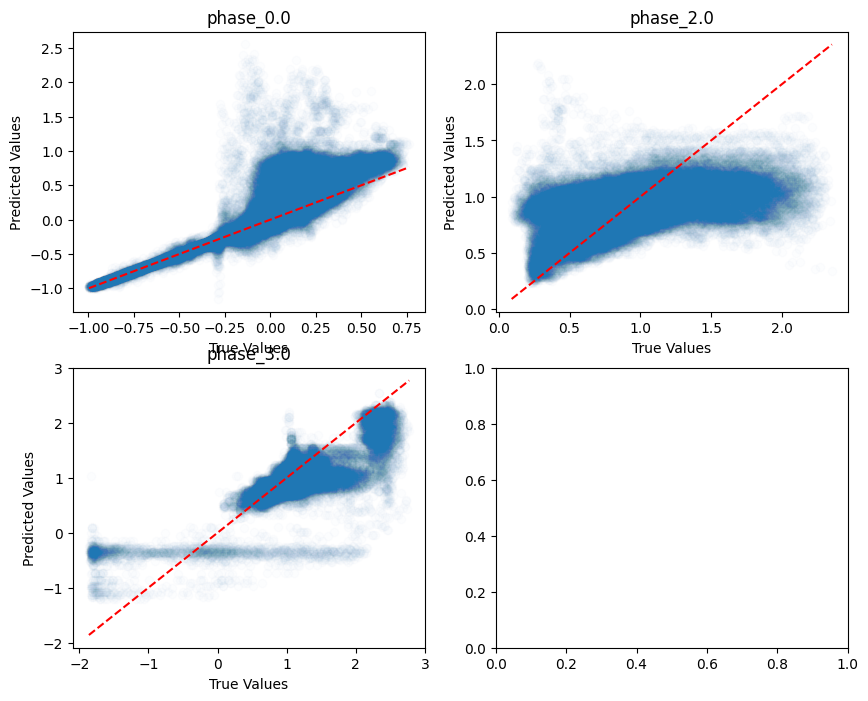

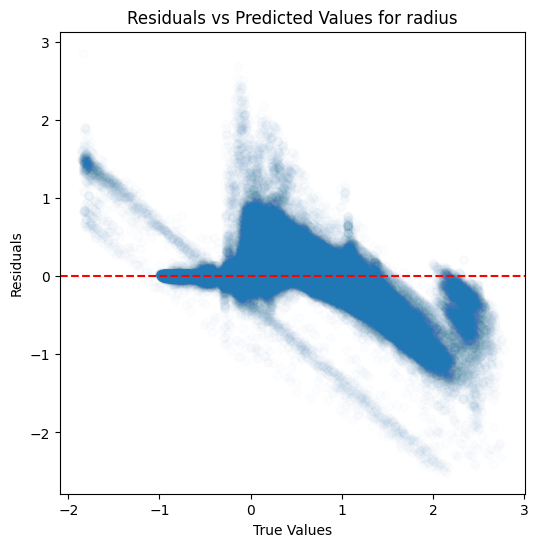

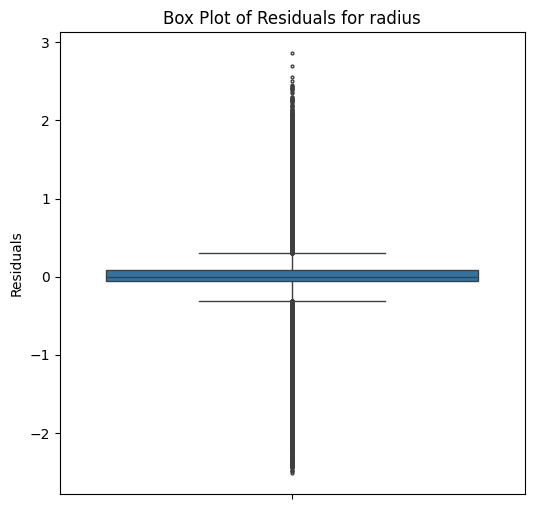

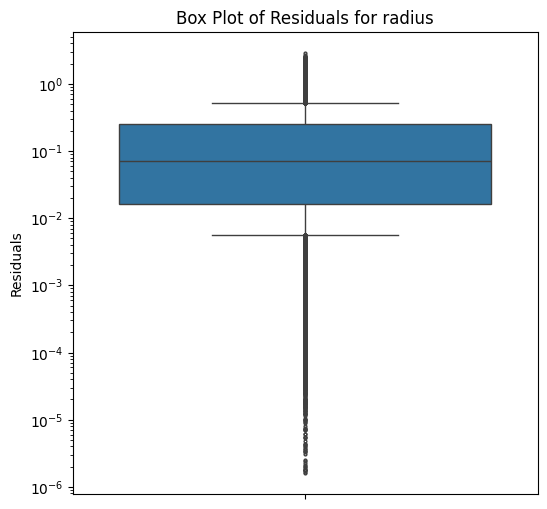

...

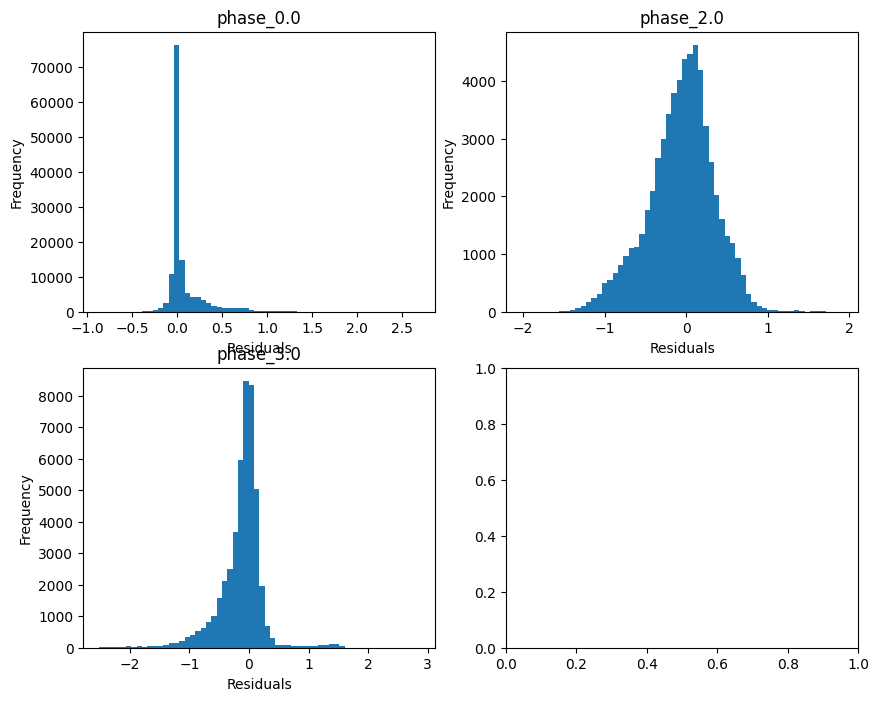

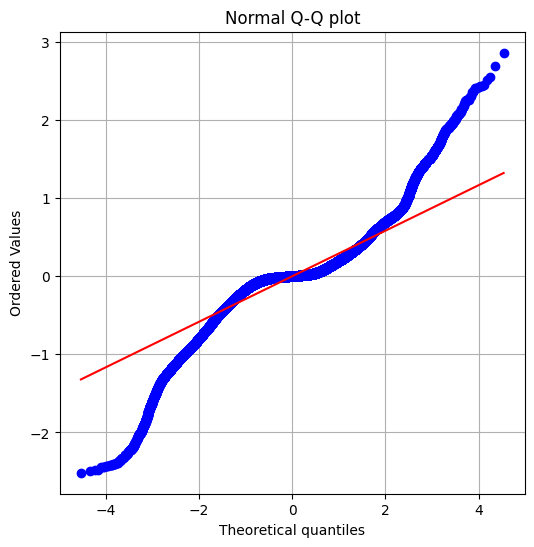

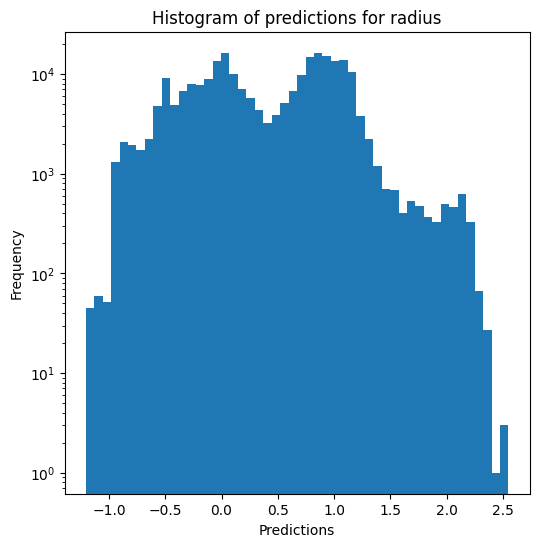

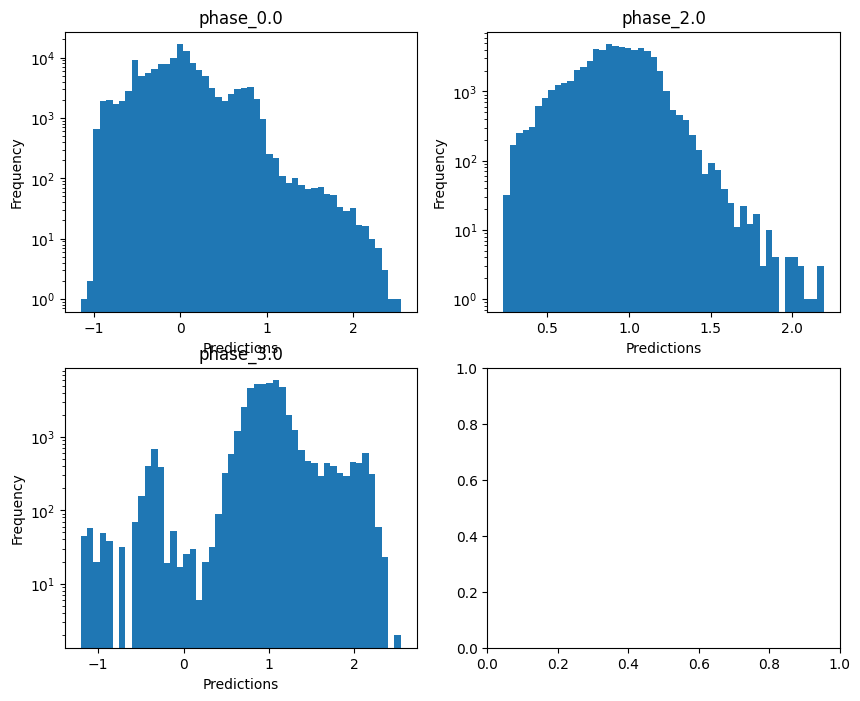

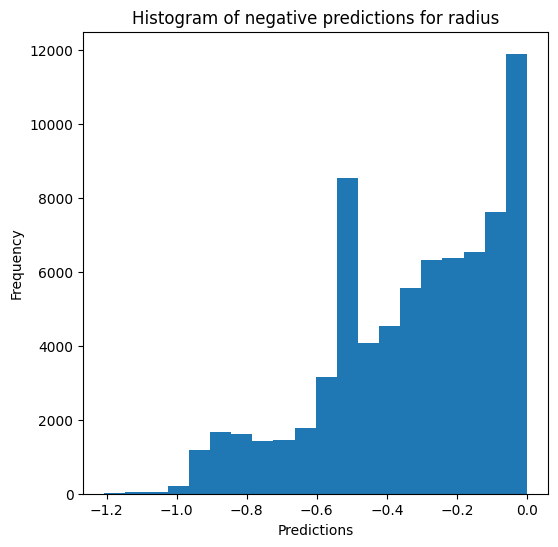

Saving predictions and results...


In [37]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=True, use_preds=False, save=True, show=True, n_jobs=5)

### Multi-layer perceptron

In [38]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


mass_smaller_3 train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.14058639866670994
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.14057527748131976
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.14452056110703343
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.14378182286825483
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.14030656003108866

Evaluating predictions...
no negative values

T_eff results for the phase category with a value of 0.0
  value range :  3.344668191350628 - 4.301337973559223
  RVE :  0.8623608313345653
  RMSE :  0.08087980074891418
  MAE :  0.05604028837827361
  MedAE :  0.039785432332626325
  CORR :  0.9295978495119153
  MAX_ER :  0.9369085524476066
  Percentiles : 
    75th percentile :  0.07417017629243827
    90th percentile :  0.12721587679470311
    95th percentile :  0.1647936857372979
    99th percentile :  0.2336380204814156

T_eff results for the phase category with a value of 2.0
  value range :  3.424526073183654 - 4.276512878191396
  RVE :  0.5965309534594504
  RMSE :  0.10237639637172603
  MAE :  0.08322935678194966
  MedAE :  0.07354568053780541
  CORR :  0.7886545067138623
  MAX_ER :  0.365783619562845
  Percentiles : 
    75th percentile :  0.12055984093646699
    90th percentile :  0.16558361972326185
    95th percentile :  0.1948723069626539
    99th percentile 

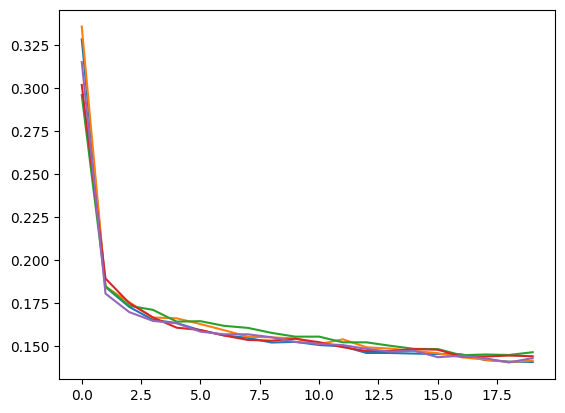

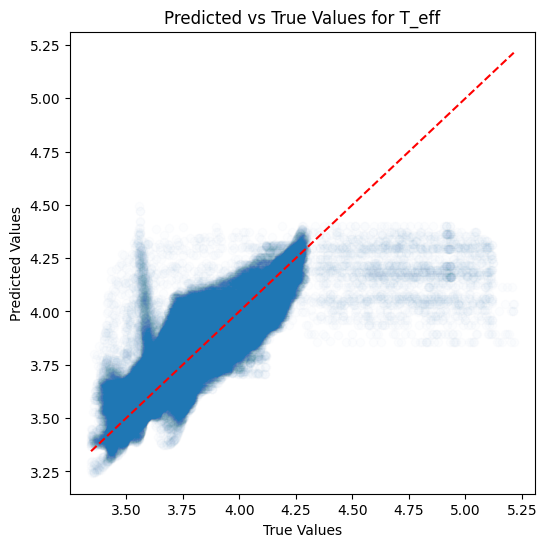

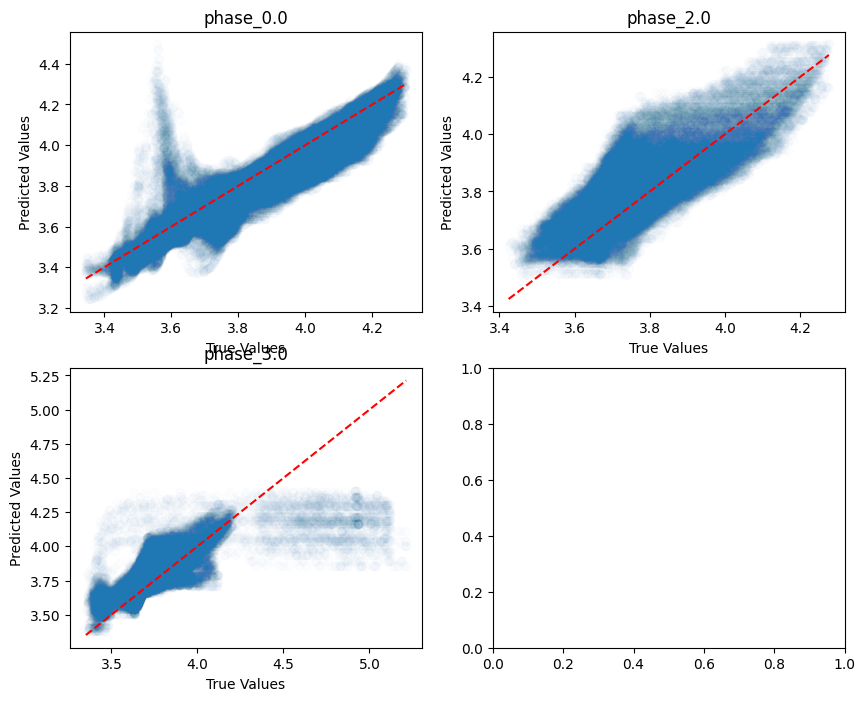

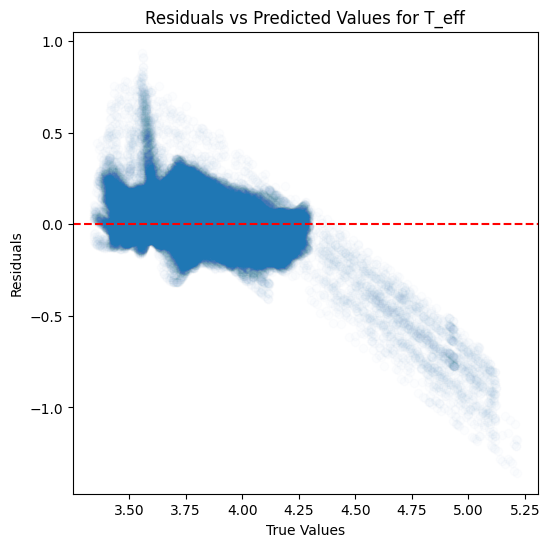

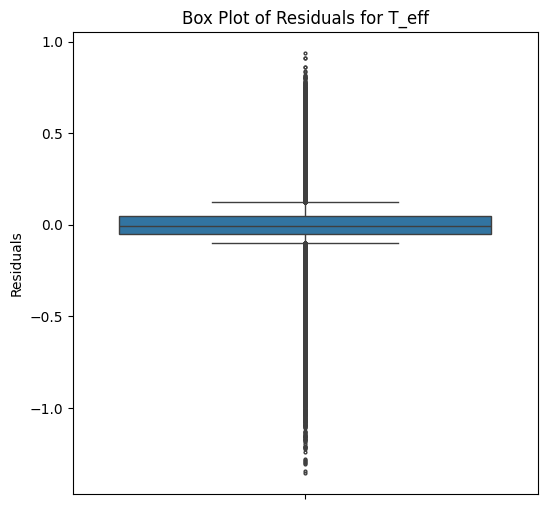

...

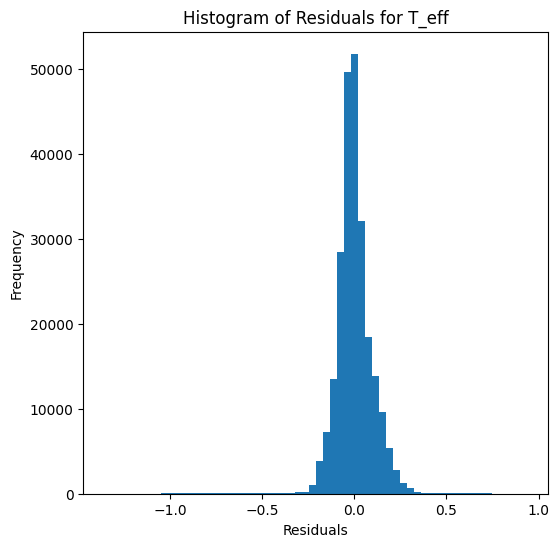

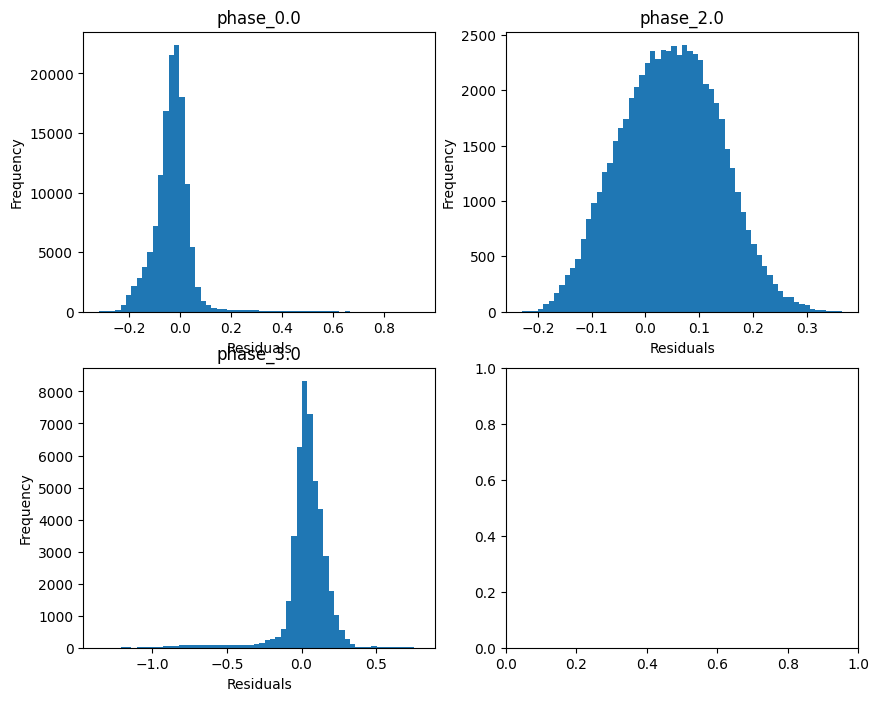

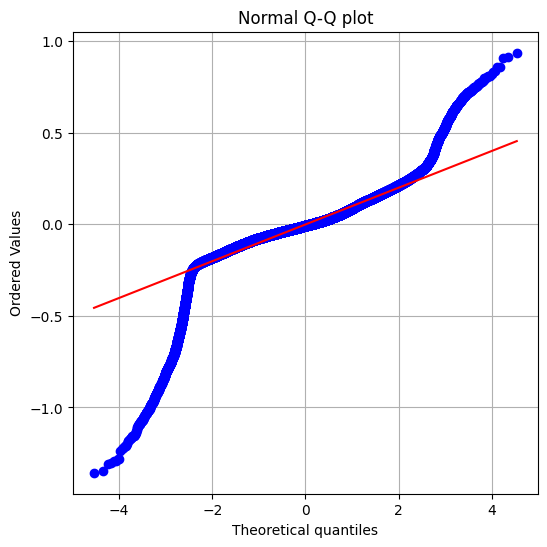

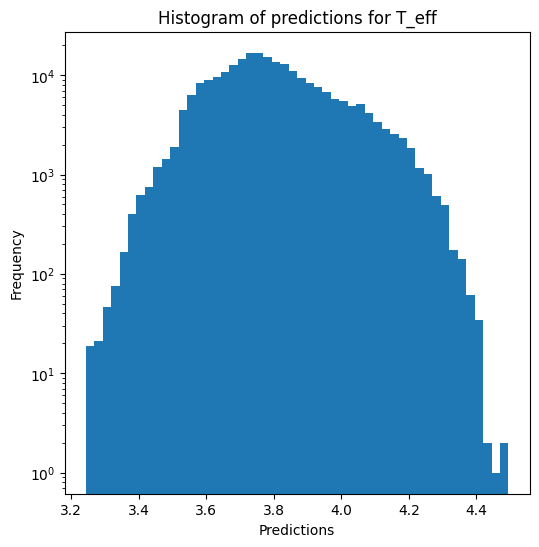

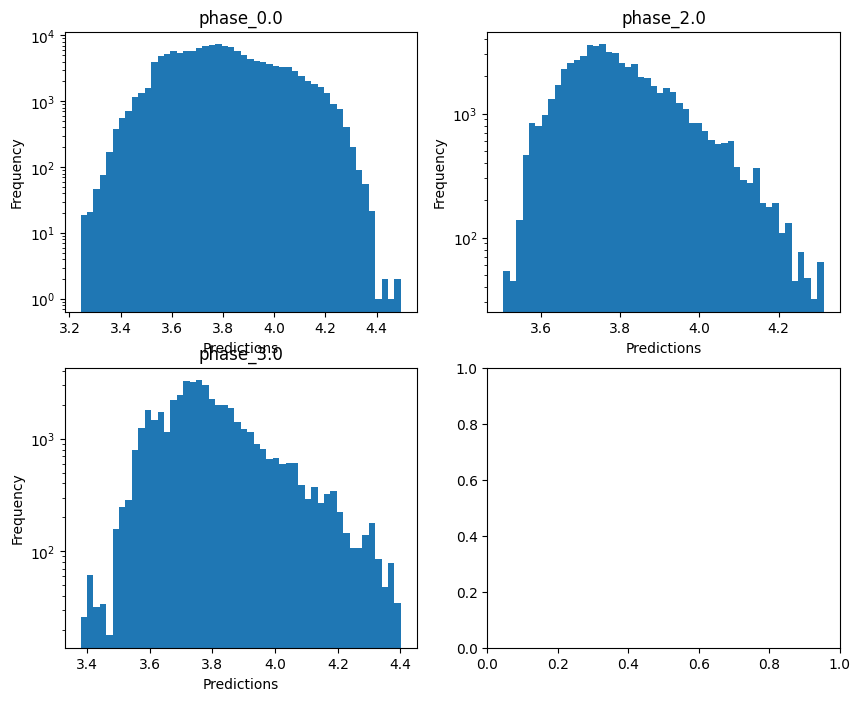

no negative values

log_g results for the phase category with a value of 0.0
  value range :  3.379753170845917 - 5.432991769220164
  RVE :  -0.7229649352856209
  RMSE :  0.49784931159055434
  MAE :  0.2509248120049705
  MedAE :  0.05626988117431786
  CORR :  0.8276797605168658
  MAX_ER :  2.6500562909872003
  Percentiles : 
    75th percentile :  0.24156820092172193
    90th percentile :  0.8133211472261904
    95th percentile :  1.1459614156791444
    99th percentile :  2.149063859067134

log_g results for the phase category with a value of 2.0
  value range :  -0.3287802371627256 - 4.406128730397165
  RVE :  0.14713482401893085
  RMSE :  0.960080389231262
  MAE :  0.7583316439653184
  MedAE :  0.6199390151602491
  CORR :  0.4056315344409603
  MAX_ER :  3.523257830602437
  Percentiles : 
    75th percentile :  1.0982159155027218
    90th percentile :  1.6435170804047
    95th percentile :  1.9517600109145978
    99th percentile :  2.392373573476028

log_g results for the phase catego

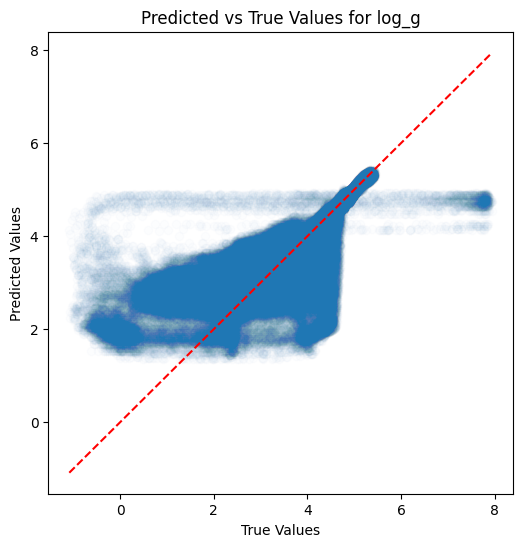

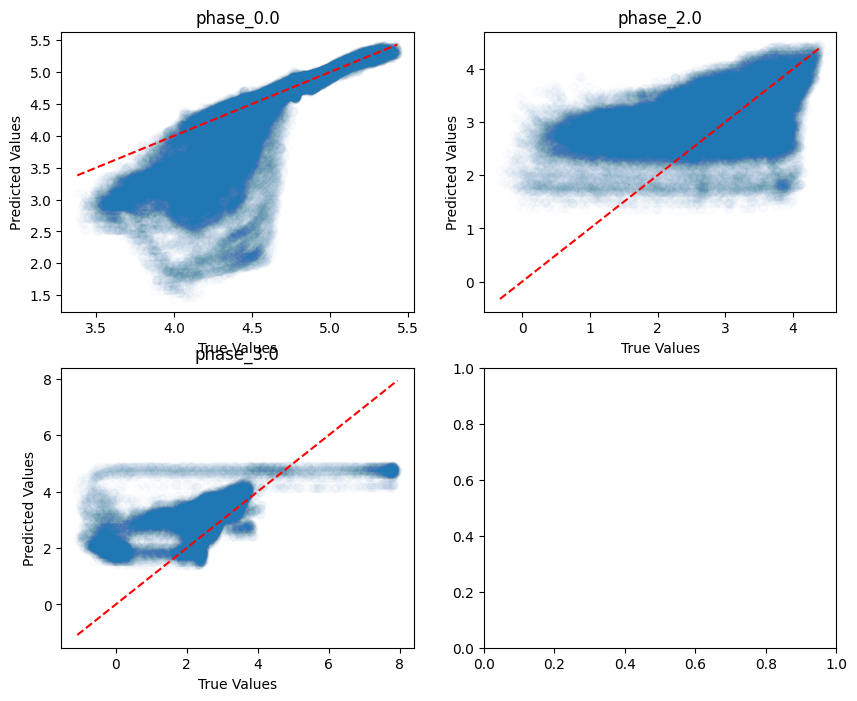

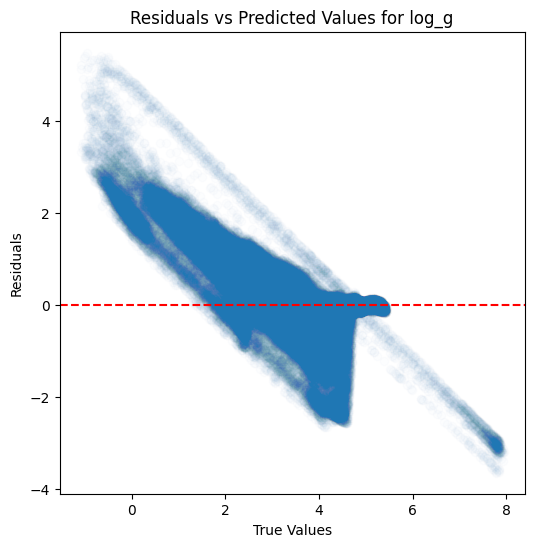

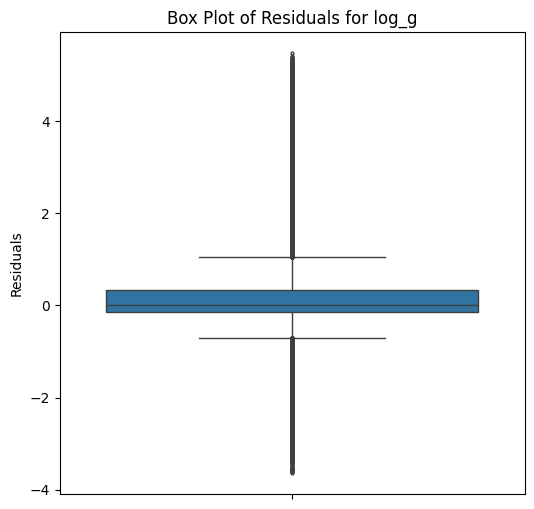

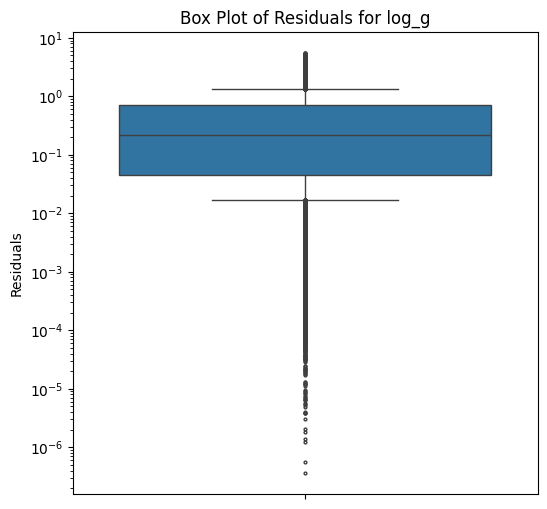

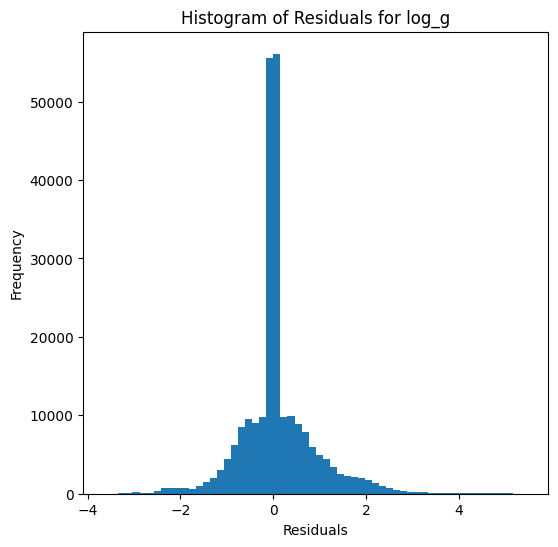

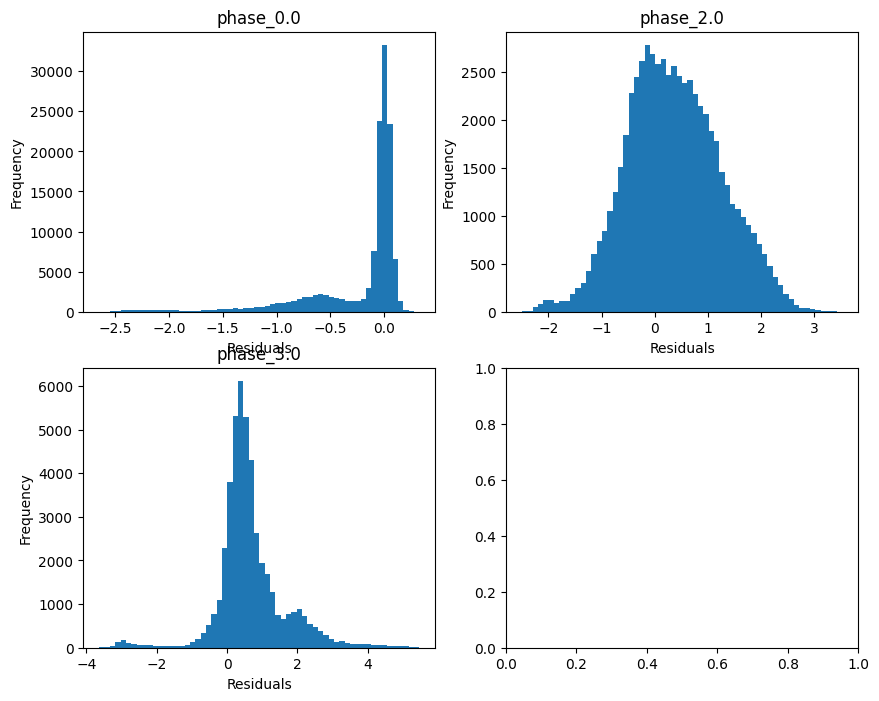

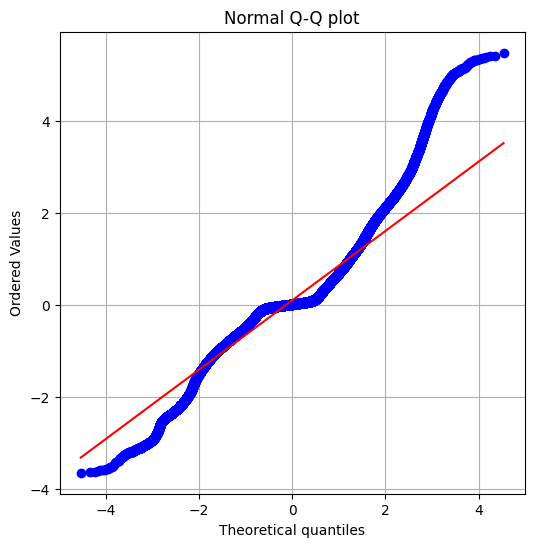

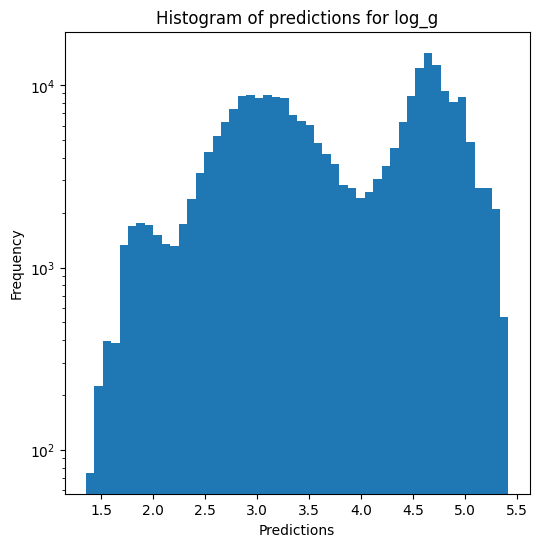

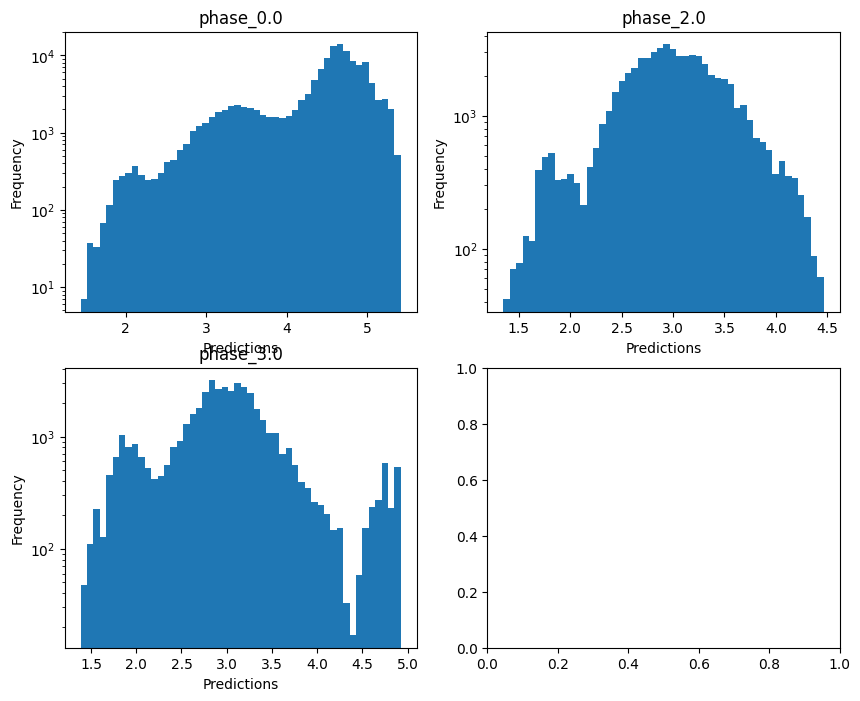


radius results for the phase category with a value of 0.0
  value range :  -0.9974234436680278 - 0.7629161677552769
  RVE :  0.4804004624804338
  RMSE :  0.24716512253229195
  MAE :  0.13003001232640327
  MedAE :  0.04212552227711103
  CORR :  0.8830430965380688
  MAX_ER :  1.3739607069071815
  Percentiles : 
    75th percentile :  0.11183031291698645
    90th percentile :  0.39673509218974784
    95th percentile :  0.5697226298101347
    99th percentile :  1.0704573140056028

radius results for the phase category with a value of 2.0
  value range :  0.0909920840275404 - 2.353416446984946
  RVE :  0.07128720904385955
  RMSE :  0.4801288848226303
  MAE :  0.3793329952919692
  MedAE :  0.3112012369179855
  CORR :  0.3182592769065406
  MAX_ER :  1.762950200358685
  Percentiles : 
    75th percentile :  0.5507935432724703
    90th percentile :  0.8186769878714975
    95th percentile :  0.9727643757568261
    99th percentile :  1.1986209937896437

radius results for the phase category with

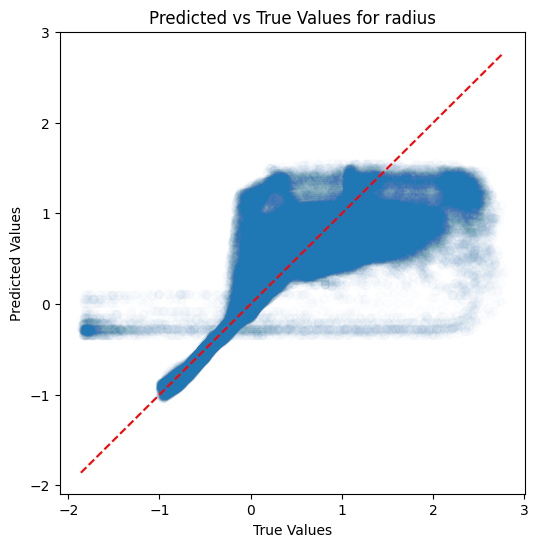

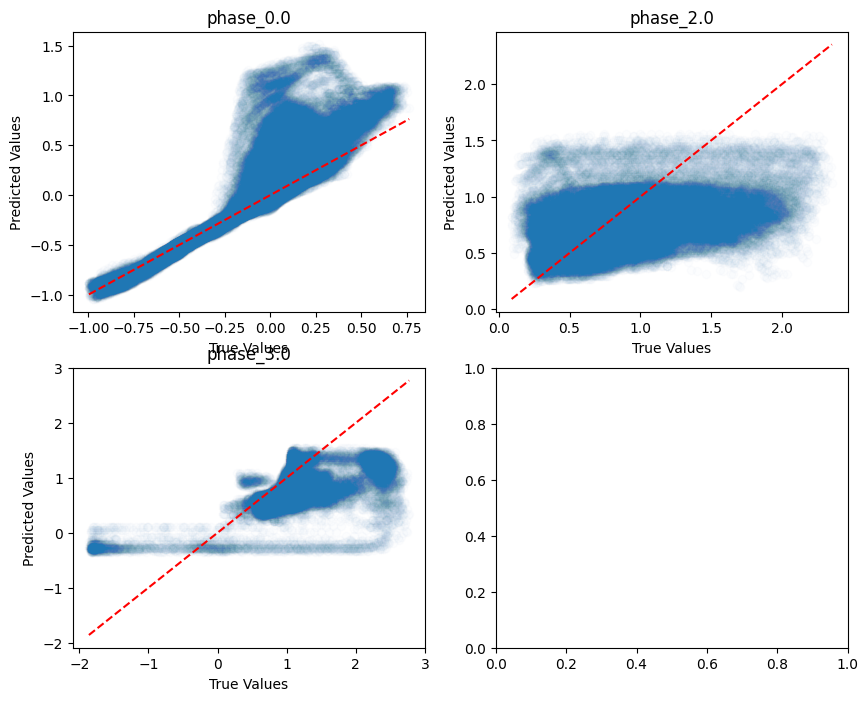

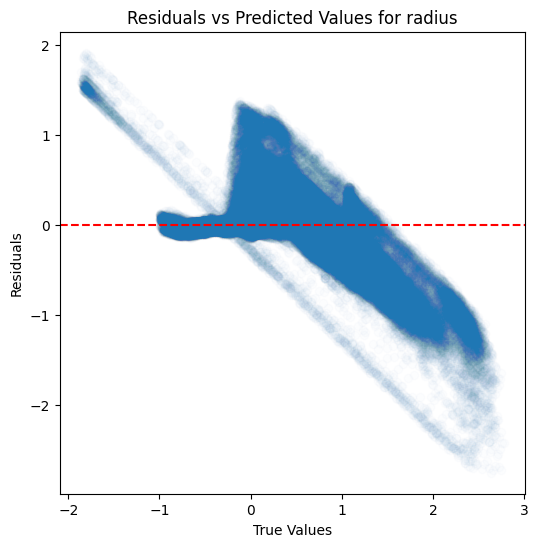

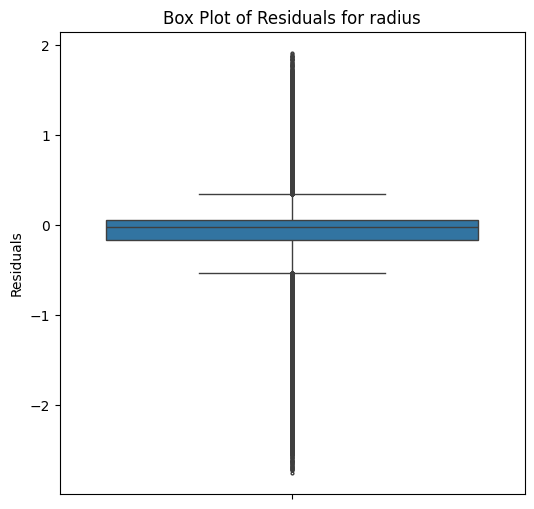

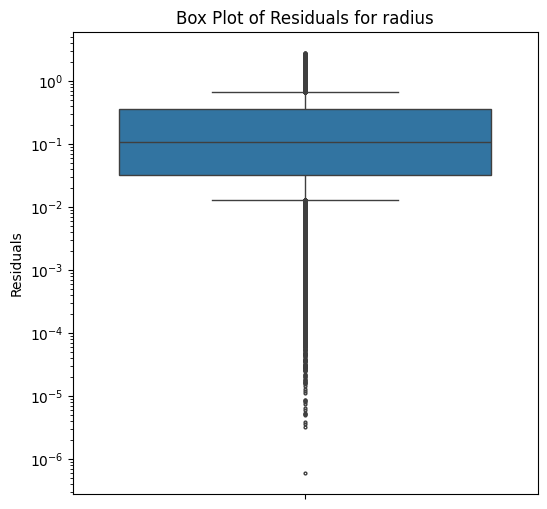

...

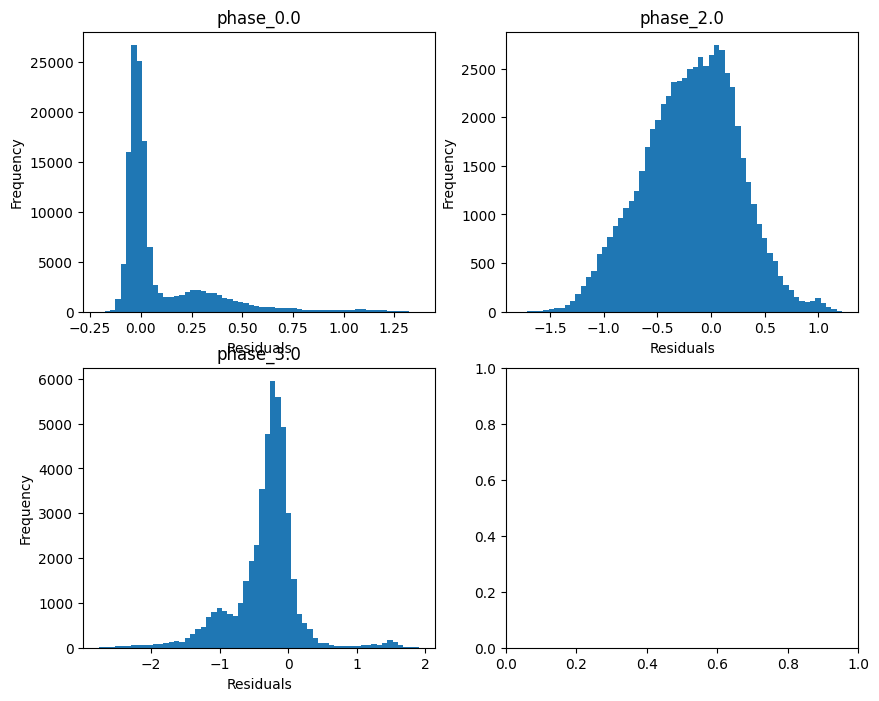

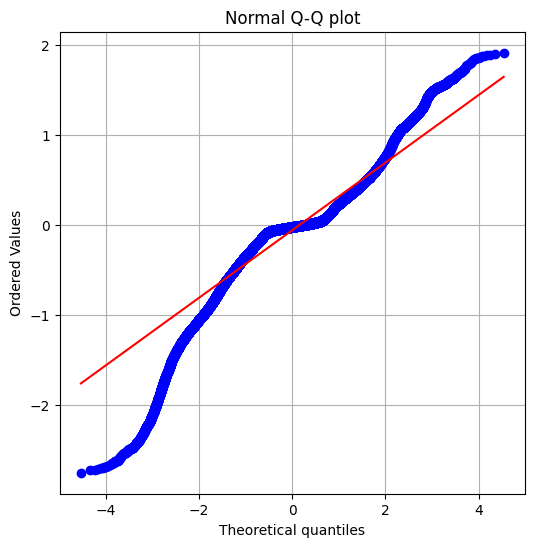

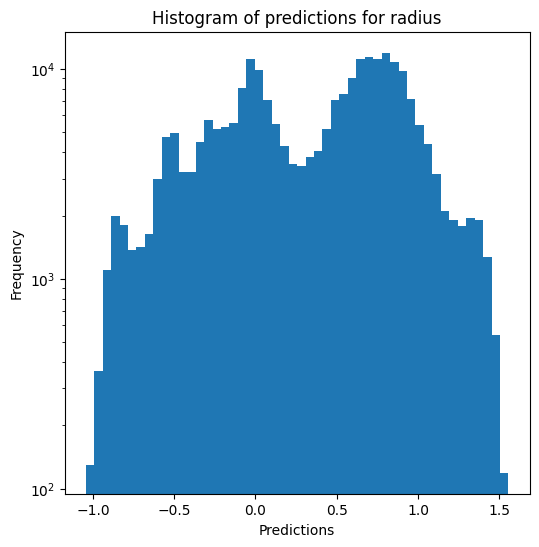

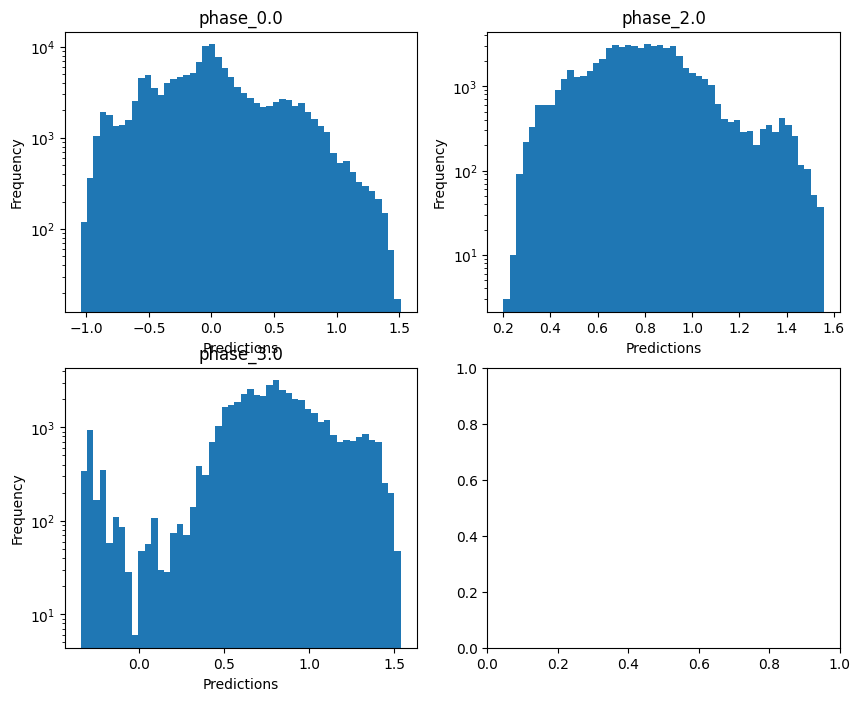

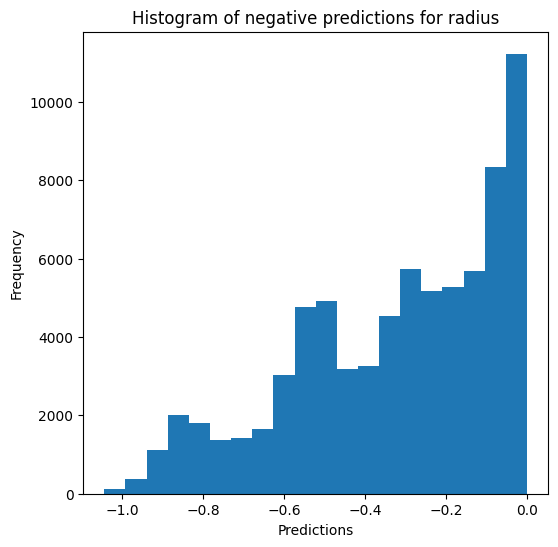

Saving predictions and results...


In [39]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=True, use_preds=False, save=True, show=True, 
                                     hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)